# Course 4. Exploratory data Analysis in R 

## Week 1

### Lesson 1: Graphs

### 1.1.1 Principles of Analytic Graphics

#### Princple 1: Show comparisons
- Evidence is always relative to another competing hypothesis
- Always ask "Compared to what?"

#### Principle 2: Show causality, mechanism, explanation, systematic structure
- What is your causal framework for thinking about a question?

#### Principle 3: Show multivariate data
- The real world is multivariate (more than 2 vars)

#### Principle 4: Integration of evidence
- Completely integrate words, numbers, images, diagrams
- Data graphics should make use of many modes of data presentation
- Don't let the tool drive the analysis!

#### Principle 5: Describe and document the evidence with appropriate labels, scales, sources, etc.
- A data graphic should tell a complete story that is credible

#### Principle 6: Content is king
- Analytical presentations ultimately stand or fall depending on the quality, relevance and integrity of their content

### 1.1.2 Exploratory Graphs

#### Why do we use graphs in data analysis?
- Understand data properties
- Find patterns in data
- Suggest modeling strategies
- Debug analyses
- Communicate results

#### Characteristics of exploratory graphs
- They are made quicklz
- A large number are made
- The goal is for personal understanding
- Axes/legends are generally cleaned up later
- Color/size are primarily used for information

#### Simples summaries of data
One dimension
- Five-number summary 
- Boxplots 
- Histograms 
- Density plot 
- Barplot

In [216]:
getwd()

[1] "/Users/lauraochoa"

In [218]:
setwd('/Users/lauraochoa/Documents/Coursera/4_exploratorydataanalysis')

In [219]:
getwd()

[1] "/Users/lauraochoa/Documents/Coursera/4_exploratorydataanalysis"

In [215]:
data <- runif(1000, min=0, max=100)
summary(data)

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
 0.01934 25.38548 50.23335 50.06345 74.57133 99.81051 

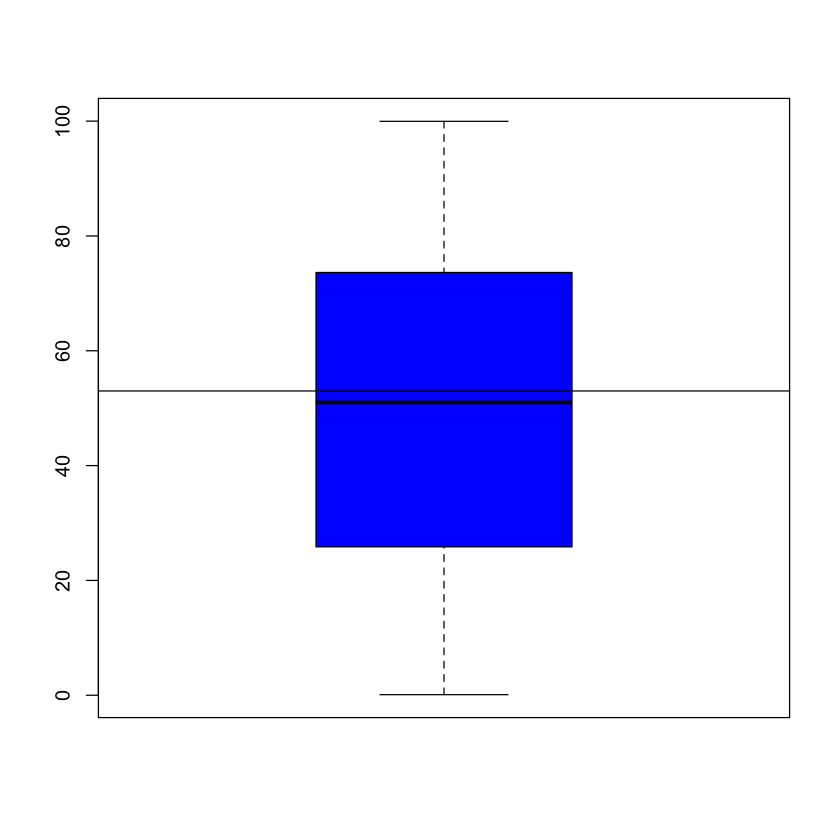

In [23]:
boxplot(data, col="blue")
abline(h=53)

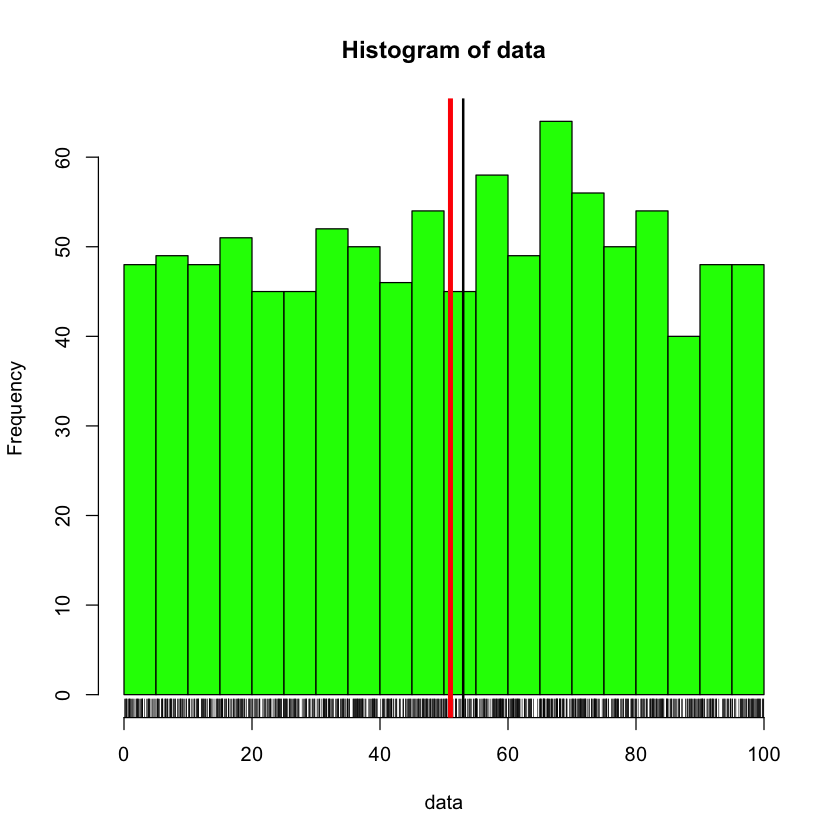

In [22]:
hist(data, col = "green", breaks = 20)
rug(data)
abline(v=53, lwd=2)
abline(v=median(data), col="red", lwd = 4)

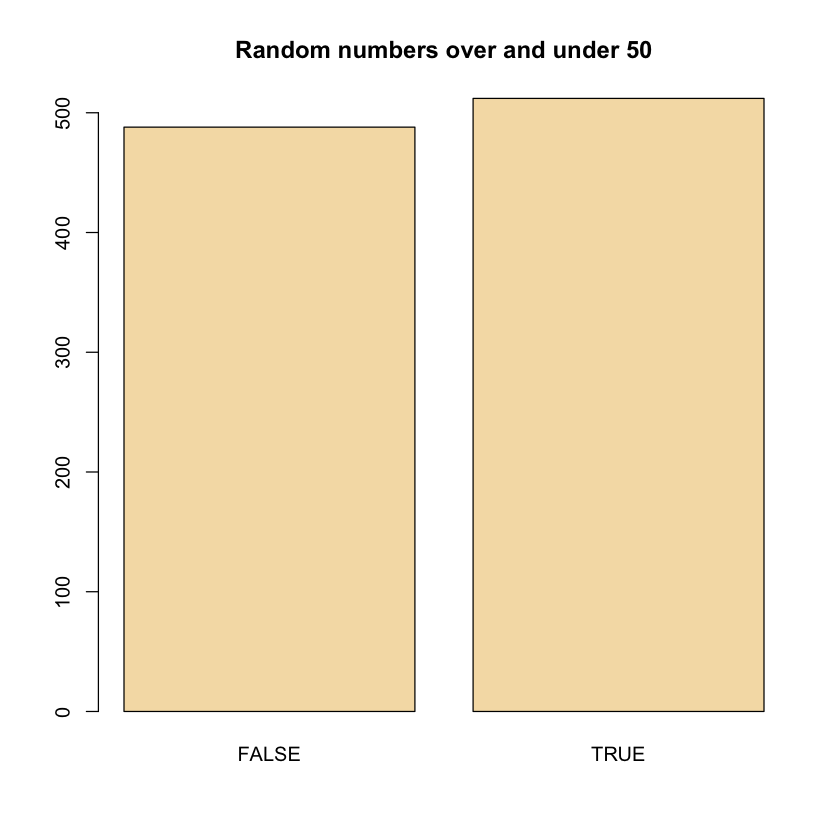

In [26]:
barplot(table(data>50), col="wheat", 
        main="Random numbers over and under 50")

### 1.1.3 Exploratory Graphs

#### Simple summaries of data
Two dimensions
- Multiple/overlayed 1-D plots (lattice/ggplot2)
- Scatterplots
- Smooth scatterplots

Over 2 dimensions
- Overlayed/multiple 2-D plots; coplots
- Use color, size, shape to add dimensions
- Spinning plots
- Actual 3D plots (not that useful)

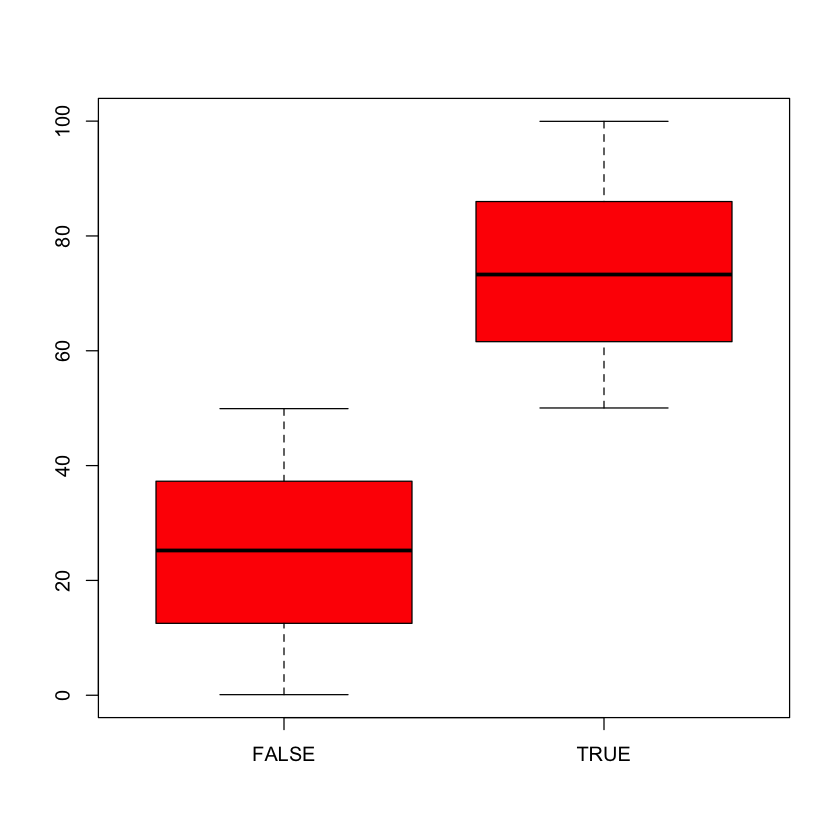

In [28]:
# Multiple boxplots to be able to compare causalities
boxplot(data ~ data>50, col = "red")

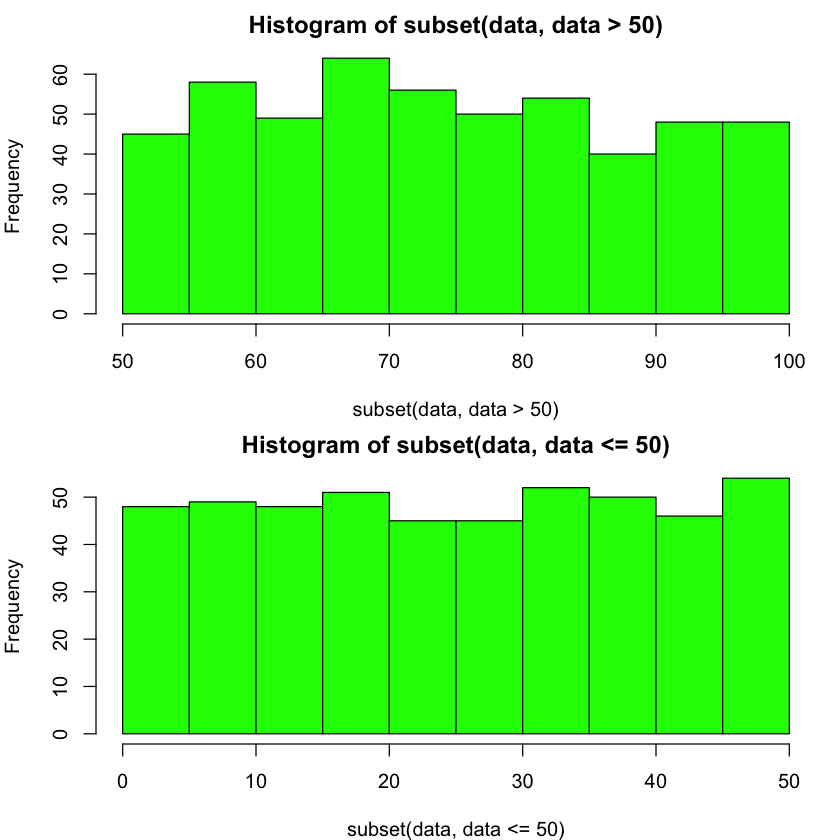

In [35]:
# Multiple histograms
par(mfrow = c(2,1), mar = c(4,4,2,1))
hist(subset(data, data>50), col = "green")
hist(subset(data, data<=50), col = "green")

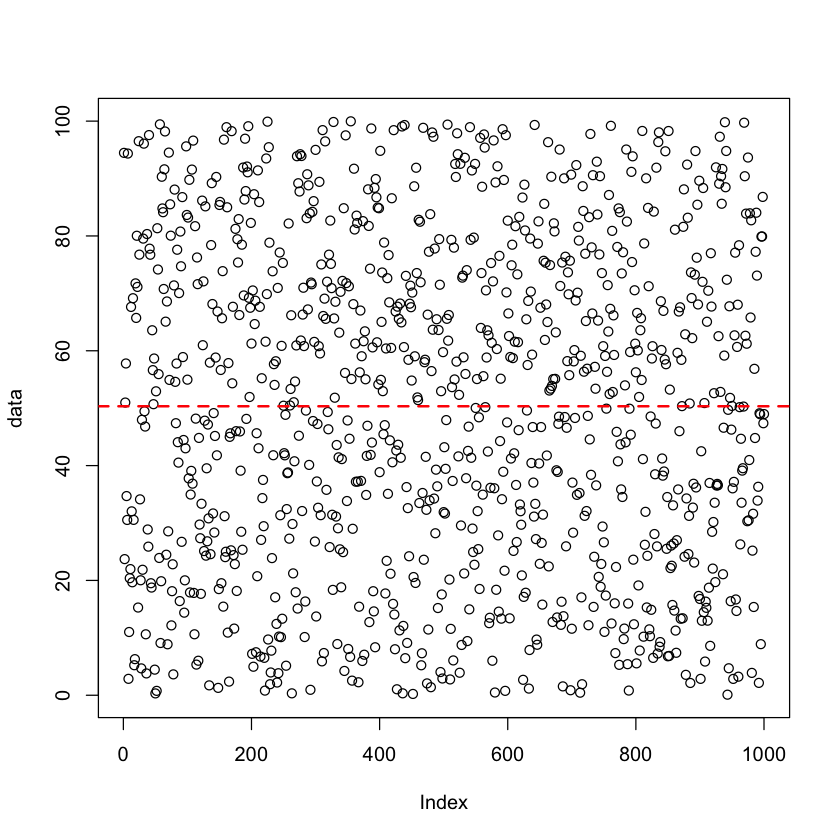

In [47]:
# Scatterplot
# with(pollutiondataframe, plot(latitude, pm25, col=region))

plot(data)
abline(h=mean(data), lwd=2, lty=2, col="red")

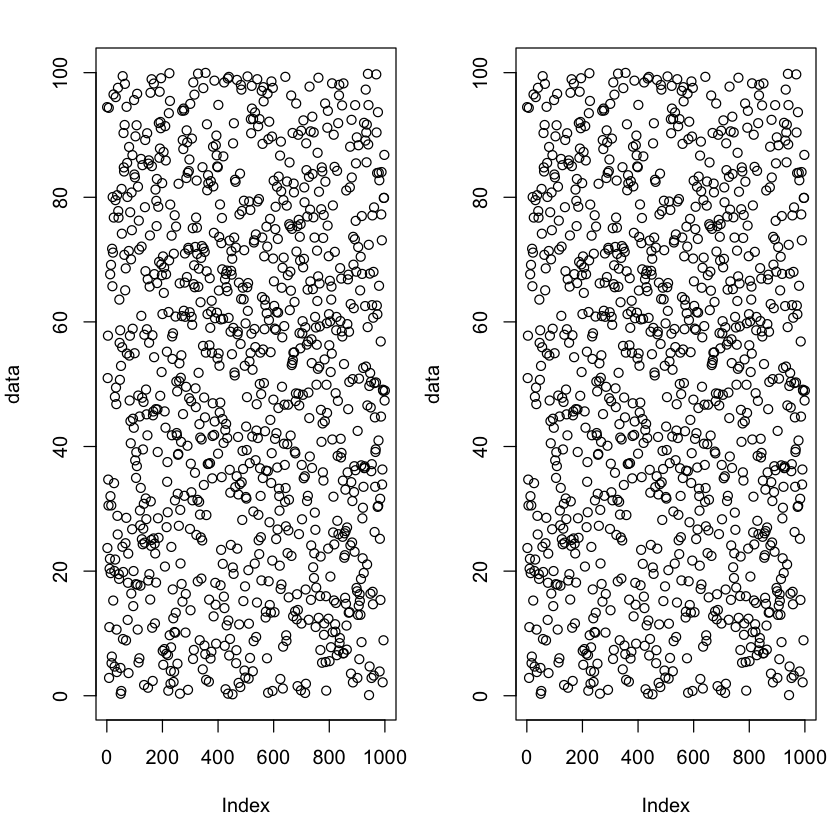

In [55]:
# Multiple scatterplots
# with(subset(pollutiondataframe, region == "west"), 
#    plot(latitude, pm25, main="West"))
# with(subset(pollutiondataframe, region == "east"), 
#    plot(latitude, pm25, main="East"))

par(mfrow = c(1,2), mar = c(5,4,2,1))
plot(data)
plot(data)


#### Resources
- R Graph Gallery
- R bloggers

### Lesson 2: Plotting

### 1.2.1 Plotting Systems in R

#### The base plotting system
- "Artist palette" model
- Start with blank canvas and build from tehre
- Start with plot function or similar
- Use annotation functions to add/modify (text, lines, points, axis)
 
Pros & Cons
- It is convenient, mirrors how we think of building plots and analysing data
- Can't go back once plot has started (i.e. to adjust margins); need to plan in advance
- Difficult to translate to others once a new plot has been created (no graphical language)
- Plot is just a series of R commands


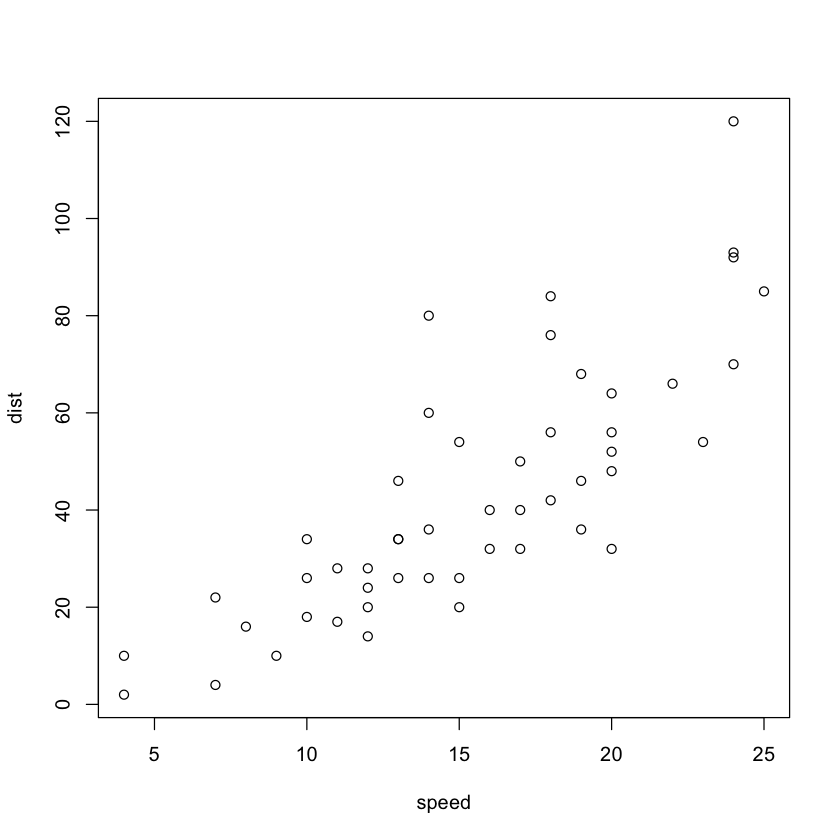

In [64]:
# Base plot

library(datasets)
data(cars)
with(cars, plot(speed, dist))

#### The Lattice System
- Plots are created with a single function call (xyplot, bwplot, etc.)
- Most useful for conditioning types of plots: looking at how y changes with x across levels of z
- Things like margins/spacing set automatically because entire plot is specified at once
- Good for putting many plots on a screen

Pros & Cons

- Sometimes awkward to specify an entire plot in a single function call
- Annotation in plot is not especially intuitive
- Use of panel functions and subscripts difficult to wield and requires intense preparation
- Cannot add to the plot once it is created

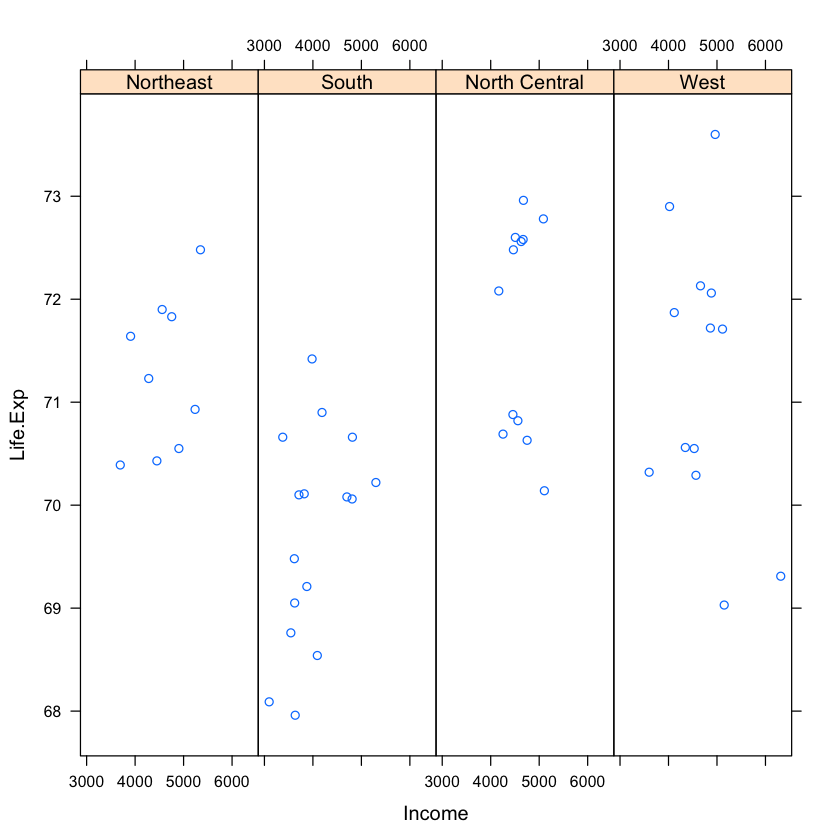

In [65]:
# Lattice plot

library(lattice)
state <- data.frame(state.x77, region = state.region)
xyplot(Life.Exp ~ Income | region, data = state, 
       layout = c(4,1))

#### The ggplot2 System
- Splits the difference between base and lattice in a number of ways
- Automatically deals with spacings, text, titles, but also allows you to annotate by adding to a plot
- Superficial similarity to lattice but generally easier/more intuitive to use
- Default mode makes many choices for you (but can still customize if you need to)

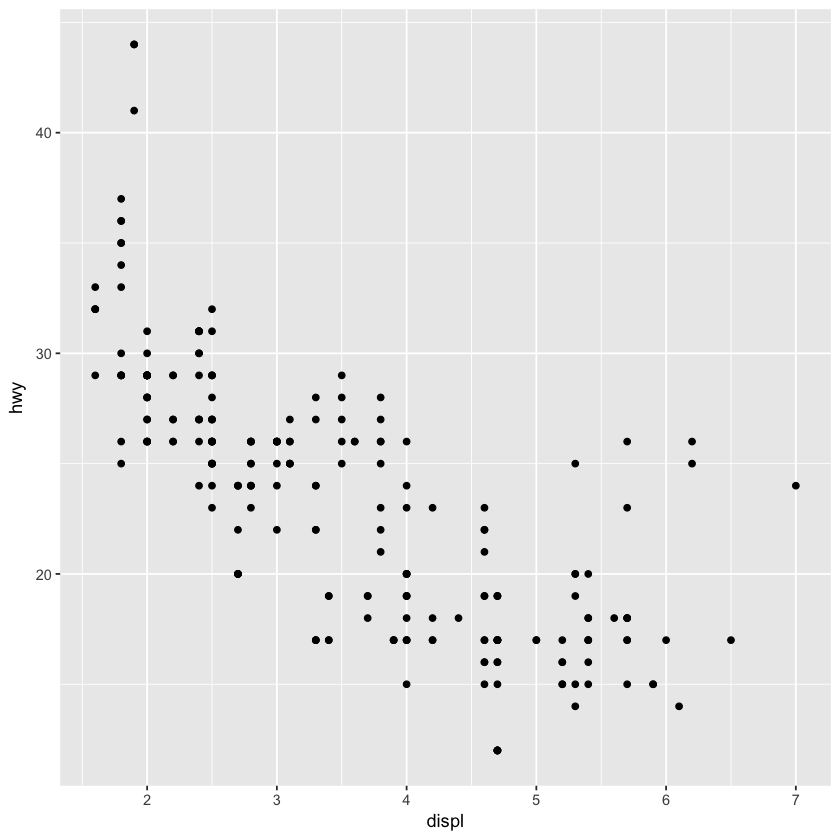

In [66]:
# ggplot2 plot 
# with mile per gallon data 
# shows the size of engine vs miles per gallon

library(ggplot2)
data(mpg)
qplot(displ, hwy, data=mpg)

### 1.2.2 The Base Plotting System in R

#### Plotting System
The core plotting and graphics engine in R is encapsulated in the following packages:
- graphics: contains plotting functions for base graphic like **plot, hist, boxplot, etc.**
- grDevices: contains code implementing graphics devices like **X11, PDF, PostScript, PNG, etc.**

The lattice plotting system is implemented using the packages:
- lattice: contains code for producing Trellis graphics, independent from the base graphics, functions like **xyplot, bwplot, levelplot, etc.**
- grid: implements a different graphing system independent of the base system, lattice builds on top of grid

#### The process of making a plot
- Where will it be made? Screen? File?
- How will it be used?
    - For viewing temporarily?
    - Presented on the web?
    - Will end up in a paper that will be printed?
    - Using it for a presentation?
- Is there a large amount of data going into the plot? Just a few points?
- Do you need to dynamically resize the graphic?
- What graphics systems will you use: base, lattice or ggplot2? They generally cannot be mixed.
    - **Base graphics** are usually constructed piecemeal, with each aspect handled separately through a series of function calls, often conceptually simpler and mirrors the thought process 
    - **ggplot2** combines concepts from both base and lattice graphics but uses an independent implementation

We focus on this course on using the **base plotting system** to create graphics on the **screen device** 

#### Base Graphics

Used most commonly and are very powerful for 2D graphs
- Two phases to creating a base plot:
    - Initializing a new plot
    - Annotating (adding to) an existing plot
- Calling **plot(x,y)** or **hist(x)** will launch a grahpics device and draw a new plot on the device
- If the arguments to **plot** are not some special class, then the *default* method for **plot** is called; it has *many* arguments, letting set the title, axis labels, etc.
- The base graphics systems has *many* parameters that can be tweaked; these parameters are documented in **?par**; helpful to try memorize this page...


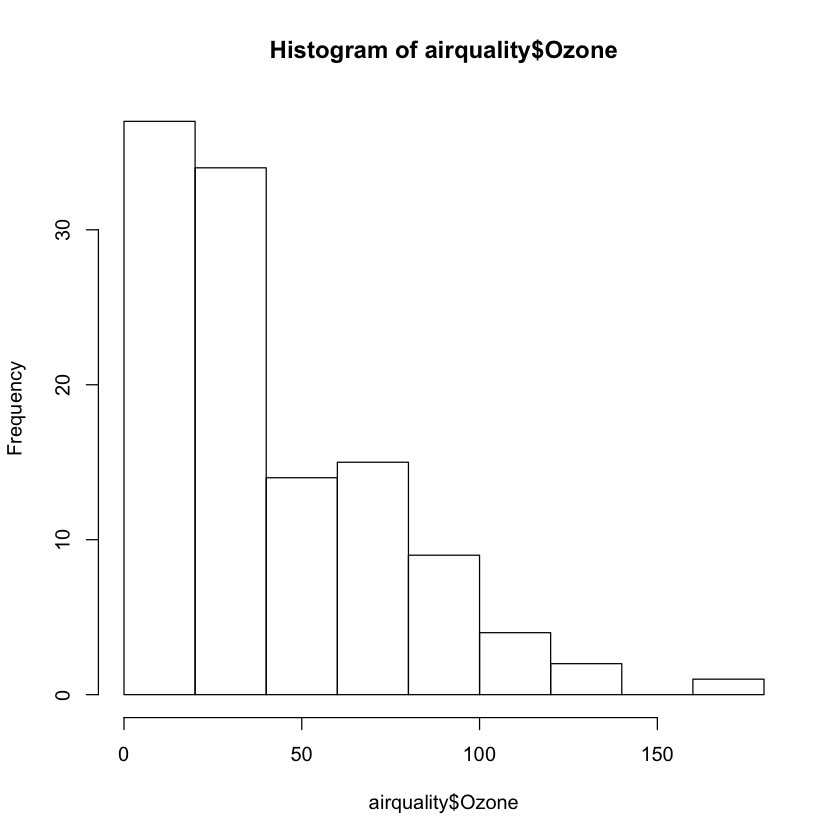

In [67]:
# Simple Base Graphics: Histogram

library(datasets)
hist(airquality$Ozone)  ## Draw a new plot

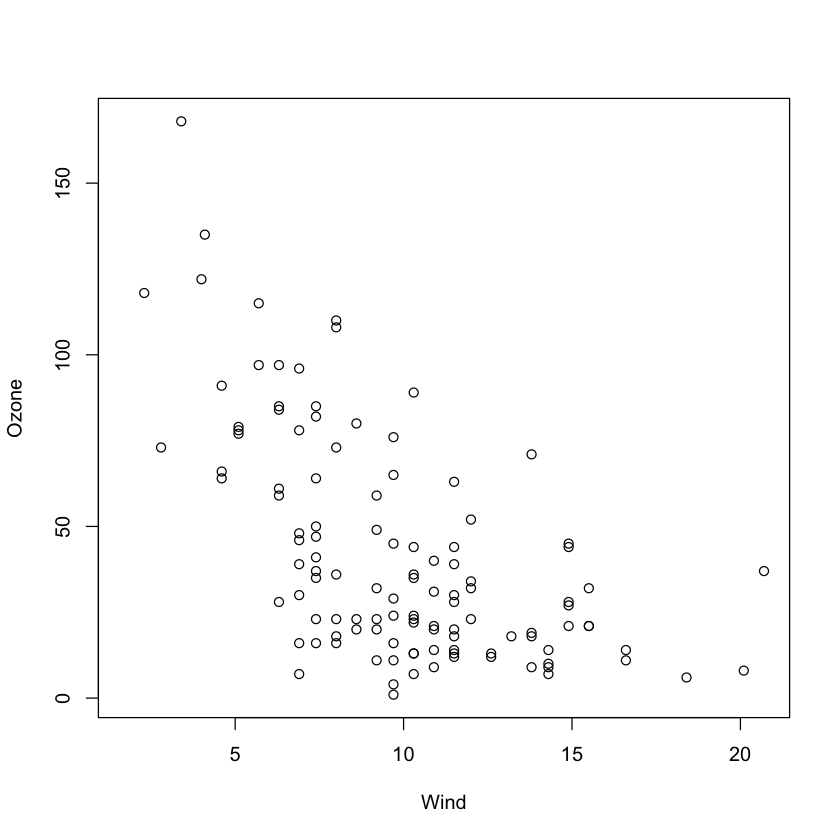

In [71]:
# Simple Base Graphics: Scatterplot

library(datasets)
with(airquality, plot(Wind,Ozone))  

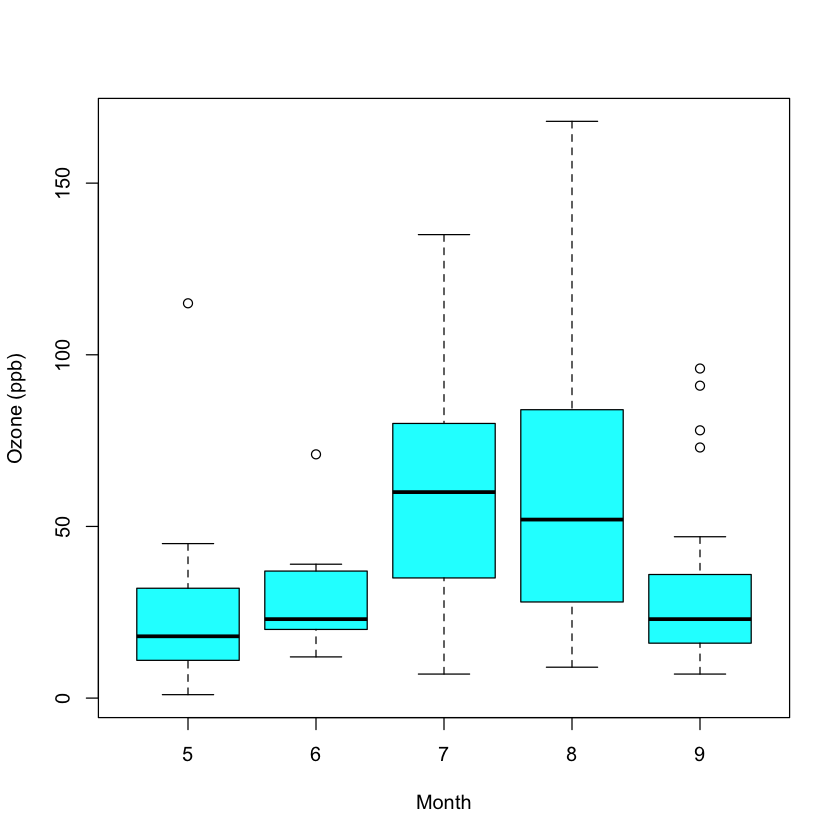

In [74]:
# Simple Base Graphics: Boxplot

library(datasets)
airquality <- transform(airquality, Month = factor(Month))
boxplot(Ozone ~ Month, airquality, xlab = "Month", 
        ylab = "Ozone (ppb)", col = "cyan")

#### Some Important Base Graphic Parameters

Many base plotting functions share a set of parameters. Here a few key ones:
- **pch**: the plotting symbol (default is open circle)
- **lty**: the line type (default solid line), can be dashed, dotted, etc.
- **lwd**: the line width, specified as an integer multiple
- **col**: the plotting color, specified as a number, string, or hex code, the **colors()** function gives you a vector of colors by name
- **xlab, ylab**: the x and y-axis labels

In [73]:
colors()

[1] "white"                "aliceblue"            "antiquewhite"        
  [4] "antiquewhite1"        "antiquewhite2"        "antiquewhite3"       
  [7] "antiquewhite4"        "aquamarine"           "aquamarine1"         
 [10] "aquamarine2"          "aquamarine3"          "aquamarine4"         
 [13] "azure"                "azure1"               "azure2"              
 [16] "azure3"               "azure4"               "beige"               
 [19] "bisque"               "bisque1"              "bisque2"             
 [22] "bisque3"              "bisque4"              "black"               
 [25] "blanchedalmond"       "blue"                 "blue1"               
 [28] "blue2"                "blue3"                "blue4"               
 [31] "blueviolet"           "brown"                "brown1"              
 [34] "brown2"               "brown3"               "brown4"              
 [37] "burlywood"            "burlywood1"           "burlywood2"          
 [40] "burlywood3"           "burlywood4"           "cadetblue"           
 [43] "cadetblue1"           "cadetblue2"           "cadetblue3"          
 [46] "cadetblue4"           "chartreuse"           "chartreuse1"         
 [49] "chartreuse2"          "chartreuse3"          "chartreuse4"         
 [52] "chocolate"            "chocolate1"           "chocolate2"          
 [55] "chocolate3"           "chocolate4"           "coral"               
 [58] "coral1"               "coral2"               "coral3"              
 [61] "coral4"               "cornflowerblue"       "cornsilk"            
 [64] "cornsilk1"            "cornsilk2"            "cornsilk3"           
 [67] "cornsilk4"            "cyan"                 "cyan1"               
 [70] "cyan2"                "cyan3"                "cyan4"               
 [73] "darkblue"             "darkcyan"             "darkgoldenrod"       
 [76] "darkgoldenrod1"       "darkgoldenrod2"       "darkgoldenrod3"      
 [79] "darkgoldenrod4"       "darkgray"             "darkgreen"           
 [82] "darkgrey"             "darkkhaki"            "darkmagenta"         
 [85] "darkolivegreen"       "darkolivegreen1"      "darkolivegreen2"     
 [88] "darkolivegreen3"      "darkolivegreen4"      "darkorange"          
 [91] "darkorange1"          "darkorange2"          "darkorange3"         
 [94] "darkorange4"          "darkorchid"           "darkorchid1"         
 [97] "darkorchid2"          "darkorchid3"          "darkorchid4"         
[100] "darkred"              "darksalmon"           "darkseagreen"        
[103] "darkseagreen1"        "darkseagreen2"        "darkseagreen3"       
[106] "darkseagreen4"        "darkslateblue"        "darkslategray"       
[109] "darkslategray1"       "darkslategray2"       "darkslategray3"      
[112] "darkslategray4"       "darkslategrey"        "darkturquoise"       
[115] "darkviolet"           "deeppink"             "deeppink1"           
[118] "deeppink2"            "deeppink3"            "deeppink4"           
[121] "deepskyblue"          "deepskyblue1"         "deepskyblue2"        
[124] "deepskyblue3"         "deepskyblue4"         "dimgray"             
[127] "dimgrey"              "dodgerblue"           "dodgerblue1"         
[130] "dodgerblue2"          "dodgerblue3"          "dodgerblue4"         
[133] "firebrick"            "firebrick1"           "firebrick2"          
[136] "firebrick3"           "firebrick4"           "floralwhite"         
[139] "forestgreen"          "gainsboro"            "ghostwhite"          
[142] "gold"                 "gold1"                "gold2"               
[145] "gold3"                "gold4"                "goldenrod"           
[148] "goldenrod1"           "goldenrod2"           "goldenrod3"          
[151] "goldenrod4"           "gray"                 "gray0"               
[154] "gray1"                "gray2"                "gray3"               
[157] "gray4"                "gray5"                "gray6"               
[160] "gray7"              

#### Some Important Base Graphic Parameters

The **par()** function is used to specify *global* graphics parameters that affect all plots in an R session. These parameters can be overridden when specified as arguments to specific plotting functions.

- **las**: the orientation of the axis labels on the plot
- **bg**: the background color
- **mar**: the margin siye
- **oma**: the outer margin size (default is 0 for all sides)
- **mfrow**: number of plots per row, column (plots are filled row-wise)
- **mfcol**: number of plots per row, column (plots are filled column-wise)

In [82]:
# Calling the par function shows the set default

par("lty")

[1] "solid"

In [81]:
par("las")

[1] 0

In [76]:
par("col")

[1] "black"

In [77]:
par("bg")

[1] "transparent"

In [78]:
par("mar")

[1] 5.1 4.1 4.1 2.1

In [79]:
par("mfrow")

[1] 1 1

In [80]:
par("mfcol")

[1] 1 1

### 1.2.3 Base Plotting Functions

- **plot**: make a scatterplot, or other types of plot depending on the class of object being plotted
- **lines**: add lines to a plot, given a vector x values and a corresponding vector of y values (or a 2-column matrix); good for time series; this function just connects the dots
- **points**: add points to a plot
- **text**: add text labels to a plot (inside) using specified x, y coordinates
- **title**: add annotations to x, y axis labels, title, subtitle, outer margin
- **mtext**: add arbitrary text to the margins (inner or outer) of the plot
- **axis**: adding axis ticks/labels

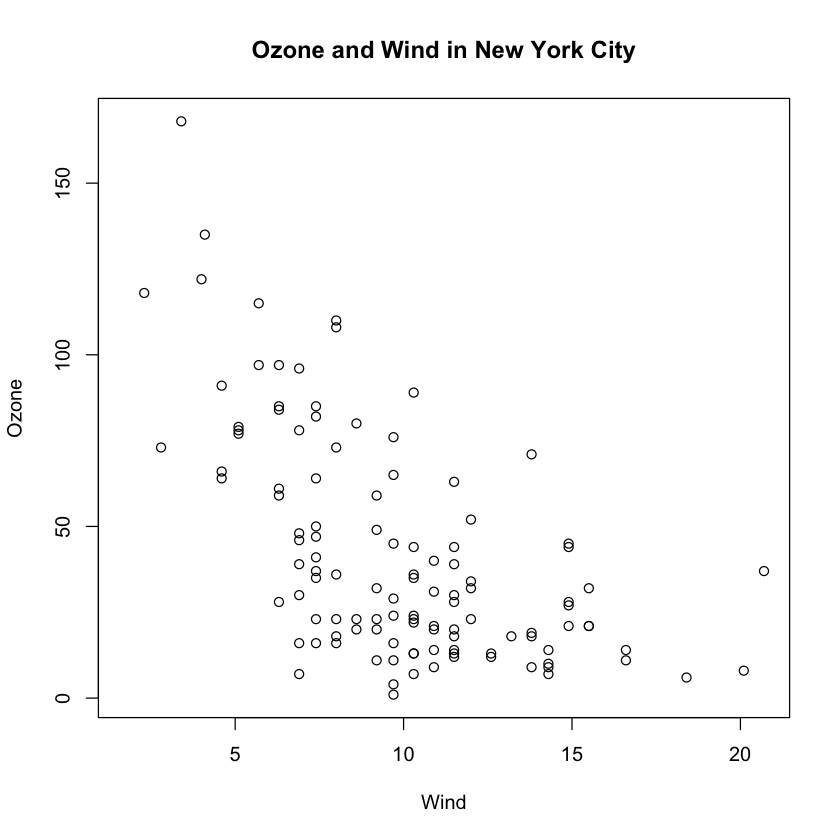

In [83]:
library(datasets)
with(airquality, plot(Wind,Ozone))
title(main="Ozone and Wind in New York City") ## Add a title

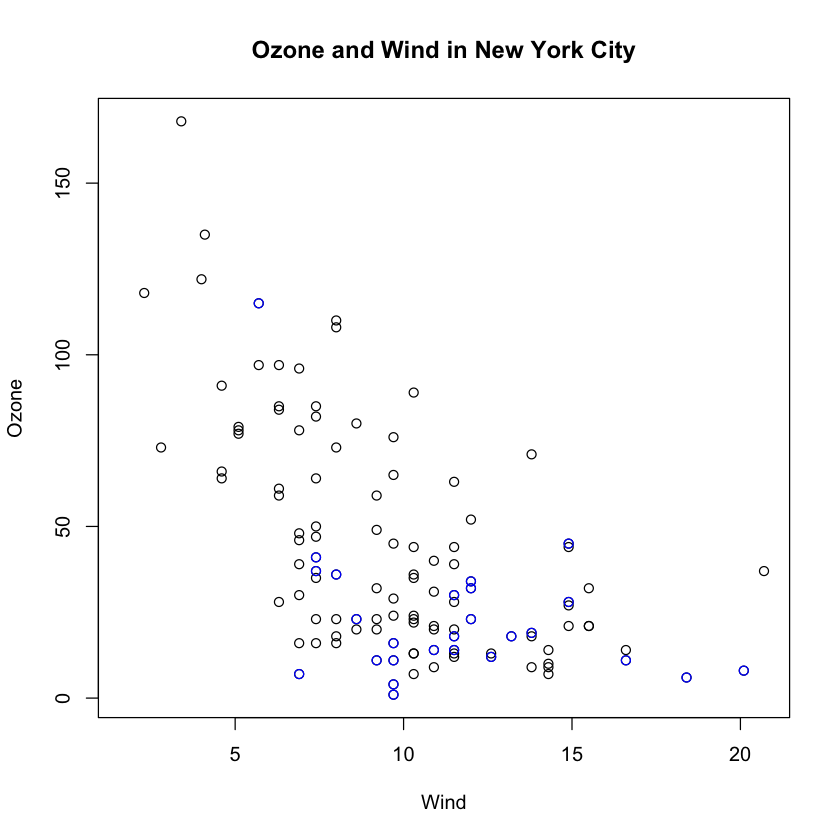

In [92]:
# Base Plot with Annotation

with(airquality, 
     plot(Wind,Ozone, main="Ozone and Wind in New York City"))
with(subset(airquality, Month==5), 
     points(Wind, Ozone, col="blue"))

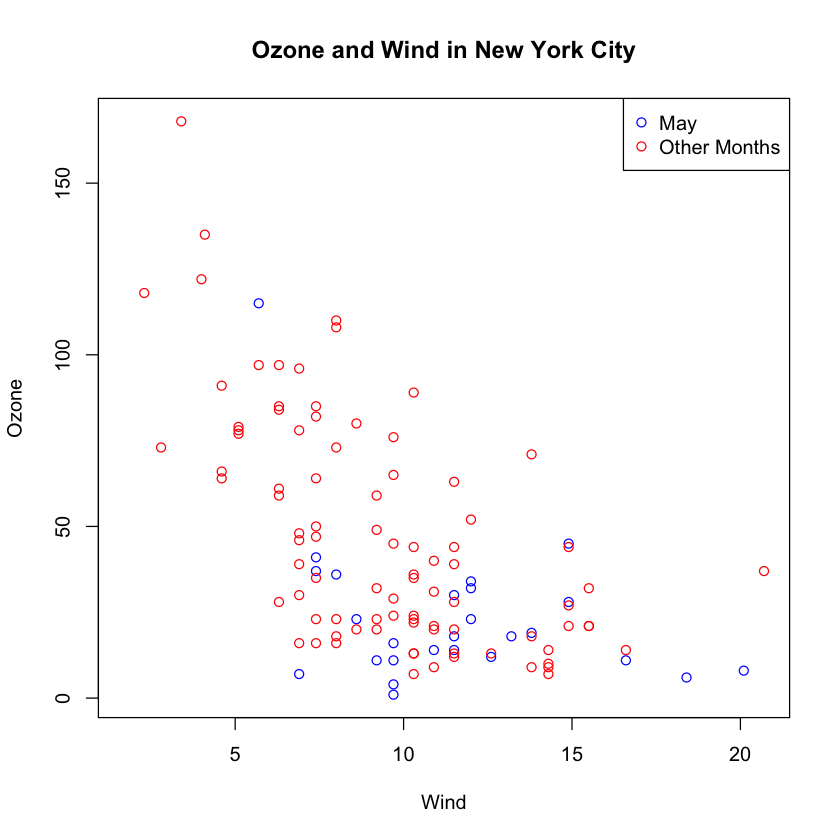

In [101]:
# Base Plot with Annotation

## type "n" creates a new empty plot
with(airquality, plot(Wind,Ozone, 
    main="Ozone and Wind in New York City", 
    type="n")) 

## Adds the points in different colors for May or not
with(subset(airquality, Month==5), 
     points(Wind, Ozone, col="blue"))
with(subset(airquality, Month!=5), 
     points(Wind, Ozone, col="red"))

## Adds legends
legend("topright", pch=1, col=c("blue","red"), 
       legend=c("May", "Other Months"))

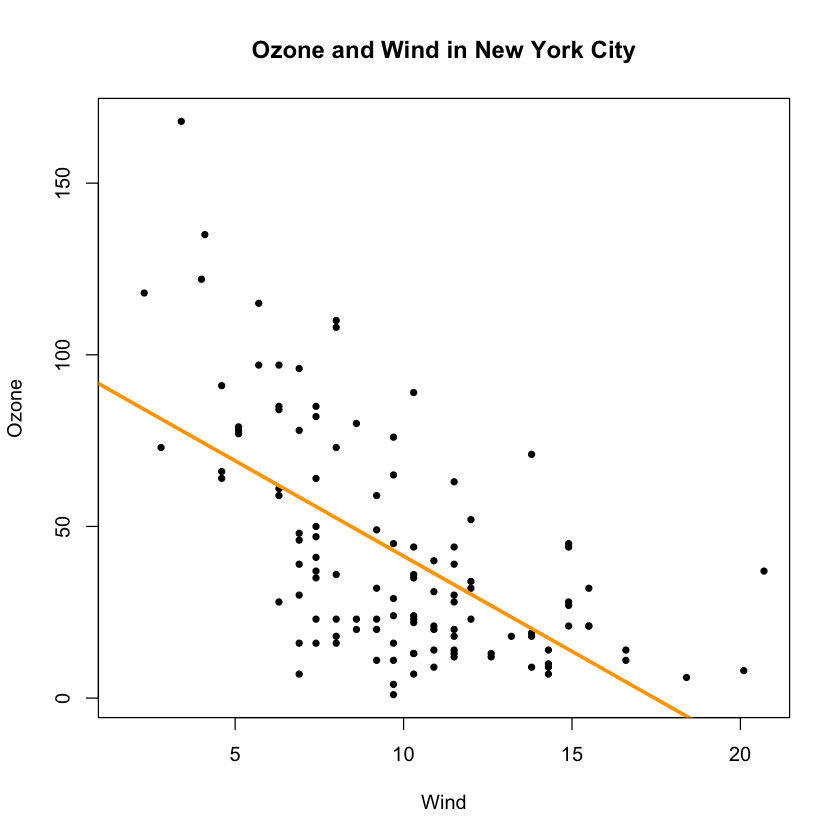

In [110]:
# Base Plot with Regression Line

## pch=20 picks dots instead of cirlces
with(airquality, plot(Wind,Ozone, 
    main="Ozone and Wind in New York City", 
    pch=20)) 
model <- lm(Ozone ~ Wind, airquality)
abline(model, lwd = 3, col = "orange")

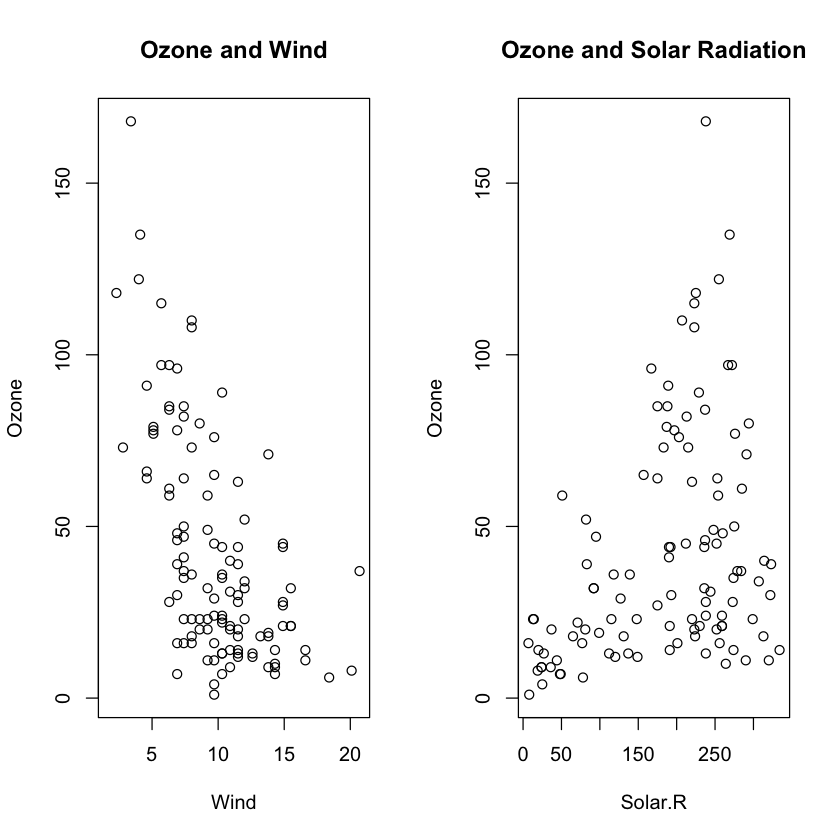

In [111]:
# Multiple Base Plots

par(mfrow = c(1,2))
with(airquality, {
    plot(Wind, Ozone, main = "Ozone and Wind")
    plot(Solar.R, Ozone, main = "Ozone and Solar Radiation")
})

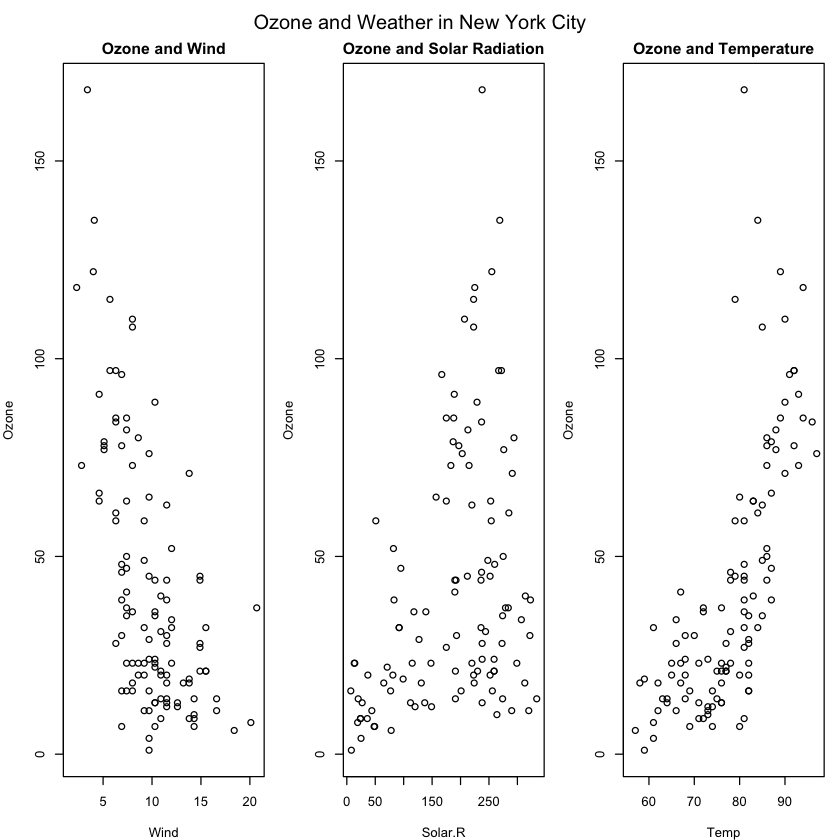

In [117]:
# Multiple Base Plots

## Setting margins with mar smaller and outer margin
## oma bigger than defaults to add a top text
par(mfrow = c(1,3), mar = c(4,4,2,1), oma=c(0,0,2,0))
with(airquality, {
    plot(Wind, Ozone, main = "Ozone and Wind")
    plot(Solar.R, Ozone, main = "Ozone and Solar Radiation")
    plot(Temp, Ozone, main = "Ozone and Temperature")
    mtext("Ozone and Weather in New York City", outer = TRUE)
})

#### Summary

- Plots in the base plotting system are created by calling successive R functions to build up a plot
- Plotting occurs in two stages:
    - Creation of a plot
    - Annotation of a plot (adding lines, points, text, legends, etc.)
- The **base plotting system** is very flexible and offers a high degree of control over plotting

### 1.2.4 Base Plotting Demonstration

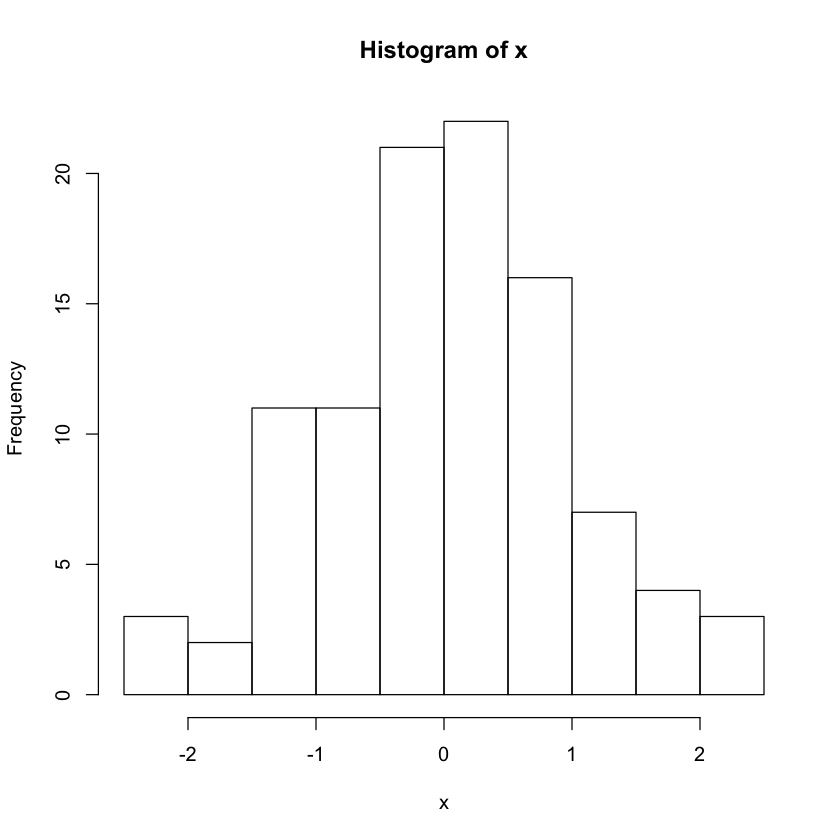

In [118]:
# Without specifying, several things appear on the graph, 
# like title, labels, axes, etc.

x <- rnorm(100)
hist(x)

[1] 5.1 4.1 4.1 2.1

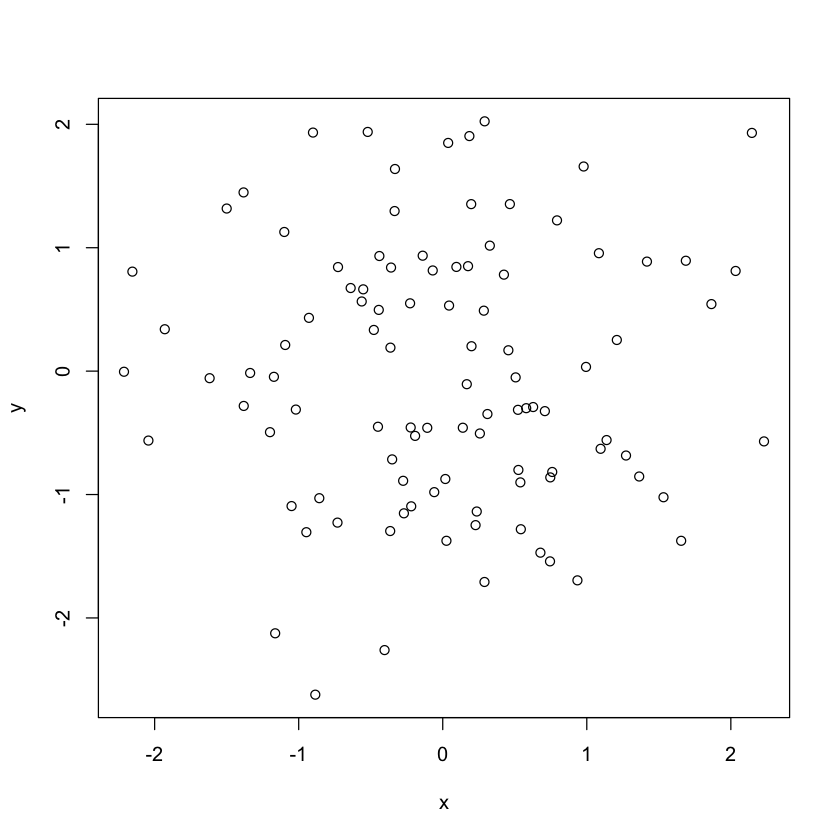

In [121]:
# labels are specified, using the object names

y <- rnorm(100)
plot(x,y)

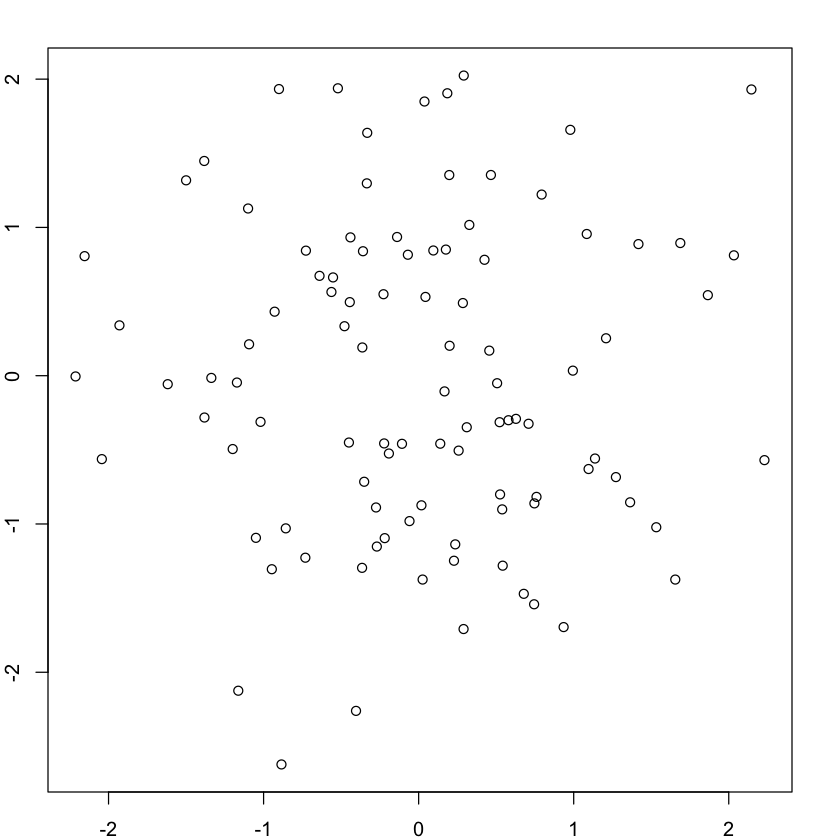

In [122]:
par(mar = c(2,2,2,2))
plot(x,y)

## oops, lost the labels (w bigger margins it appears)

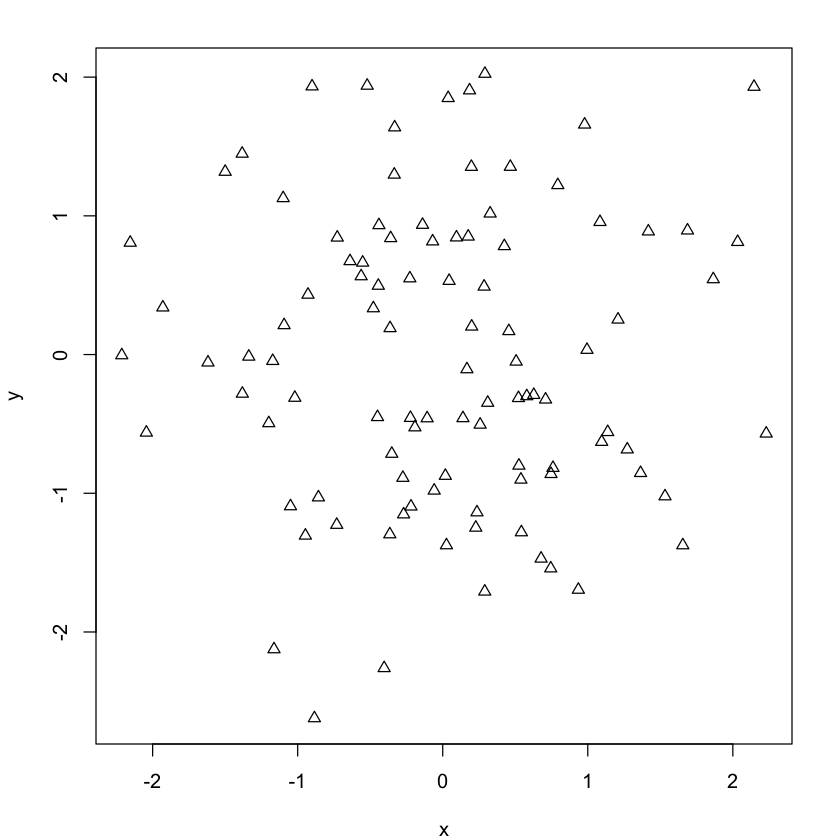

In [150]:
par(mar = c(4,4,2,2))
plot(x,y, pch = 2)
# pch = 1 --> circles
# pch = 2 --> triangles
# pch = 3 --> crosses
# pch = 4 --> x's
# pch = 5 --> diamonds
# pch = 6 --> upside down triangles
# pch = 7 --> crossed squares
# pch = 8 --> asterisques
# pch = 15 --> full squares
# pch = 16 --> full circles
# pch = 17 --> full triangles
# pch = 18 --> full diamonds
# pch = 19 --> bigger full cirlces
# pch = 20 --> dots
# pch = 21-25 are similar but have internal and external color, 
# possible to specify with bg


points> require(stats) # for rnorm

points> plot(-4:4, -4:4, type = "n")  # setting up coord. system

points> points(rnorm(200), rnorm(200), col = "red")

points> points(rnorm(100)/2, rnorm(100)/2, col = "blue", cex = 1.5)

points> op <- par(bg = "light blue")

points> x <- seq(0, 2*pi, len = 51)

points> ## something "between type='b' and type='o'":
points> plot(x, sin(x), type = "o", pch = 21, bg = par("bg"), col = "blue", cex = .6,
points+  main = 'plot(..., type="o", pch=21, bg=par("bg"))')


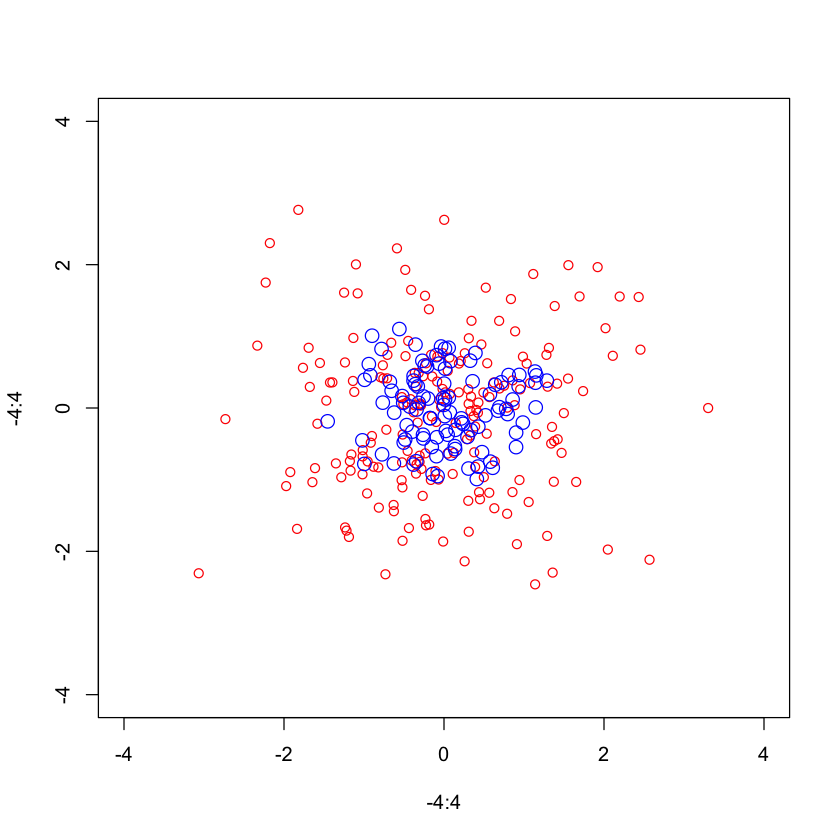


points> par(op)

points> ## Not run: 
points> ##D ## The figure was produced by calls like
points> ##D png("pch.png", height = 0.7, width = 7, res = 100, units = "in")
points> ##D par(mar = rep(0,4))
points> ##D plot(c(-1, 26), 0:1, type = "n", axes = FALSE)
points> ##D text(0:25, 0.6, 0:25, cex = 0.5)
points> ##D points(0:25, rep(0.3, 26), pch = 0:25, bg = "grey")
points> ## End(Not run)
points> 
points> ##-------- Showing all the extra & some char graphics symbols ---------
points> pchShow <-
points+   function(extras = c("*",".", "o","O","0","+","-","|","%","#"),
points+            cex = 3, ## good for both .Device=="postscript" and "x11"
points+            col = "red3", bg = "gold", coltext = "brown", cextext = 1.2,
points+            main = paste("plot symbols :  points (...  pch = *, cex =",
points+                         cex,")"))
points+   {
points+     nex <- length(extras)
points+     np  <- 26 + nex
points+     ipch <- 0:(np-1)
points+     k <- floor(sqrt(np))
points+     

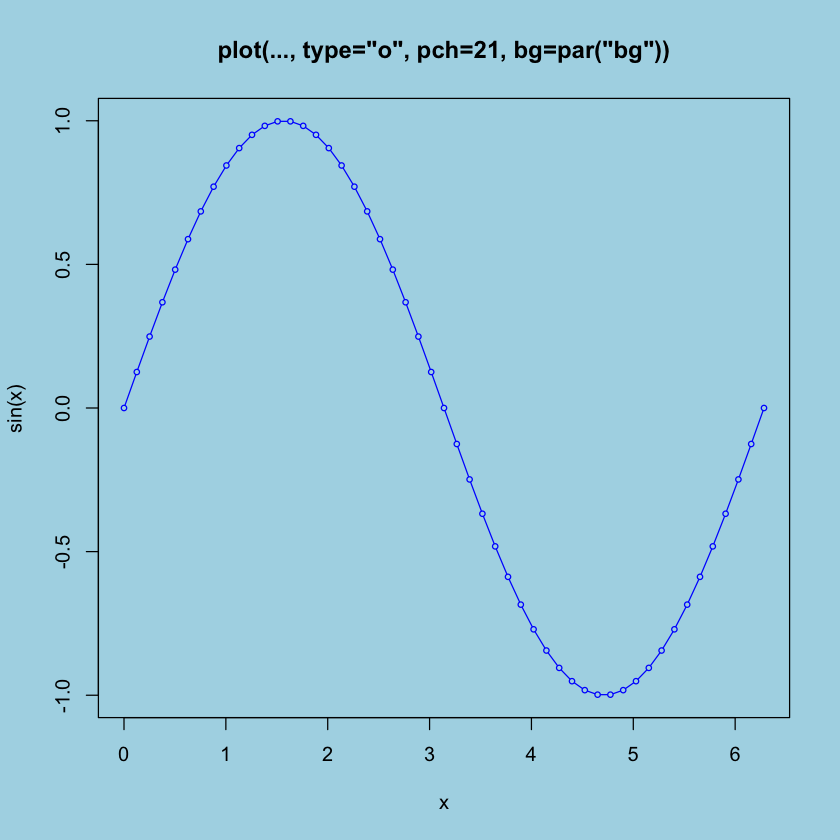


points> pchShow(c("o","O","0"), cex = 2.5)


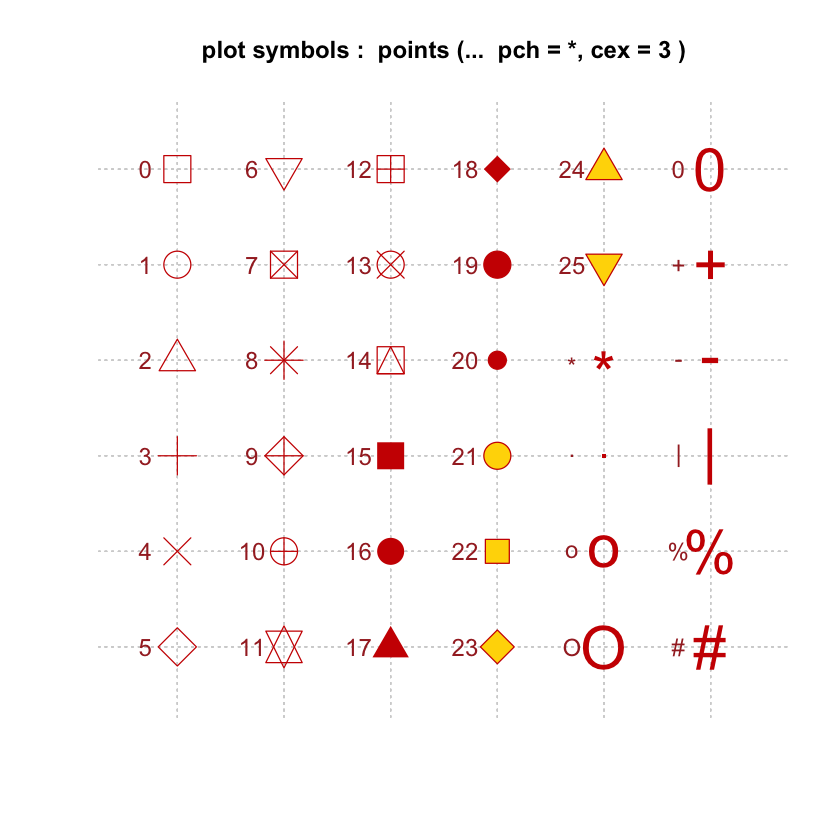


points> pchShow(NULL, cex = 4, cextext = 0, main = NULL)


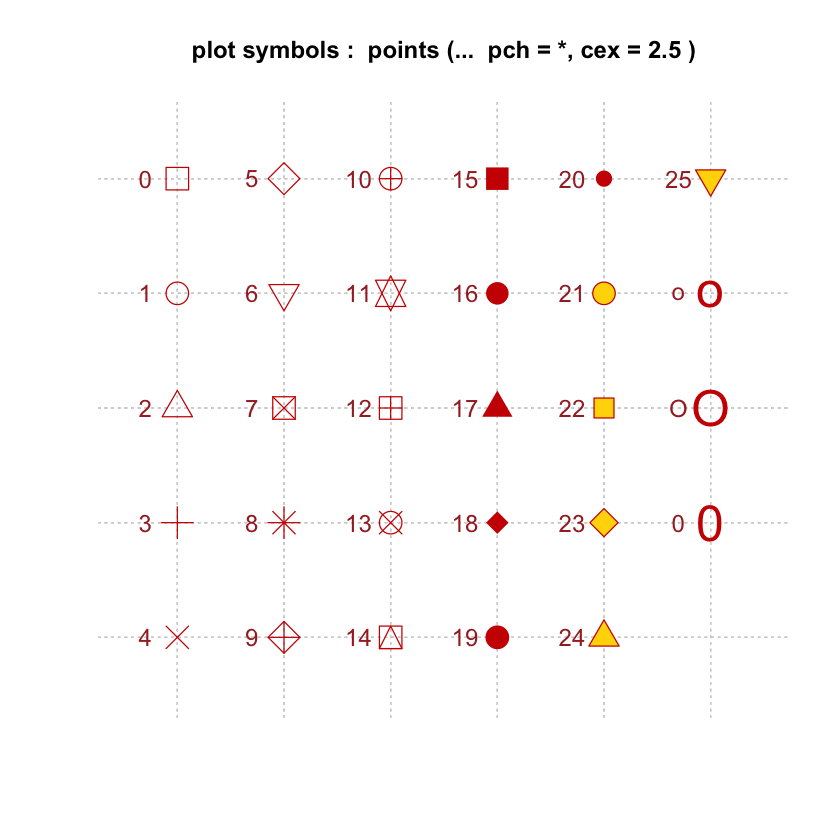


points> ## No test: 
points> ##D ## ------------ test code for various pch specifications -------------
points> ##D # Try this in various font families (including Hershey)
points> ##D # and locales.  Use sign = -1 asserts we want Latin-1.
points> ##D # Standard cases in a MBCS locale will not plot the top half.
points> ##D TestChars <- function(sign = 1, font = 1, ...)
points> ##D {
points> ##D    MB <- l10n_info()$MBCS
points> ##D    r <- if(font == 5) { sign <- 1; c(32:126, 160:254)
points> ##D        } else if(MB) 32:126 else 32:255
points> ##D    if (sign == -1) r <- c(32:126, 160:255)
points> ##D    par(pty = "s")
points> ##D    plot(c(-1,16), c(-1,16), type = "n", xlab = "", ylab = "",
points> ##D         xaxs = "i", yaxs = "i",
points> ##D         main = sprintf("sign = %d, font = %d", sign, font))
points> ##D    grid(17, 17, lty = 1) ; mtext(paste("MBCS:", MB))
points> ##D    for(i in r) try(points(i%%16, i%/%16, pch = sign*i, font = font,...))
points> ##D }
points> ##D TestCh

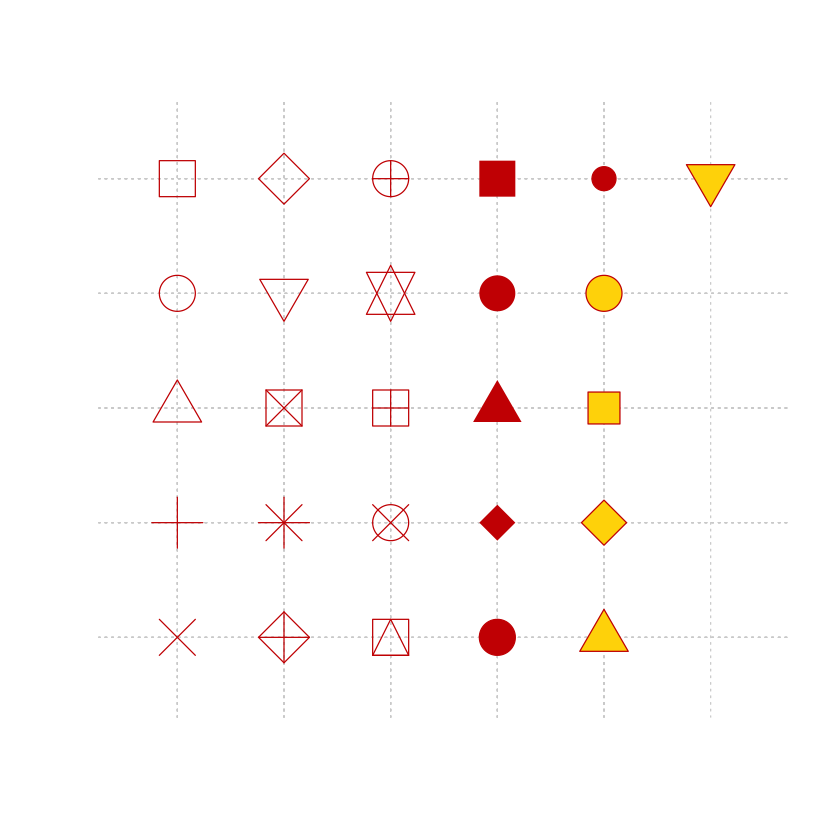

In [151]:
# A refresher of all points with examples

example(points)

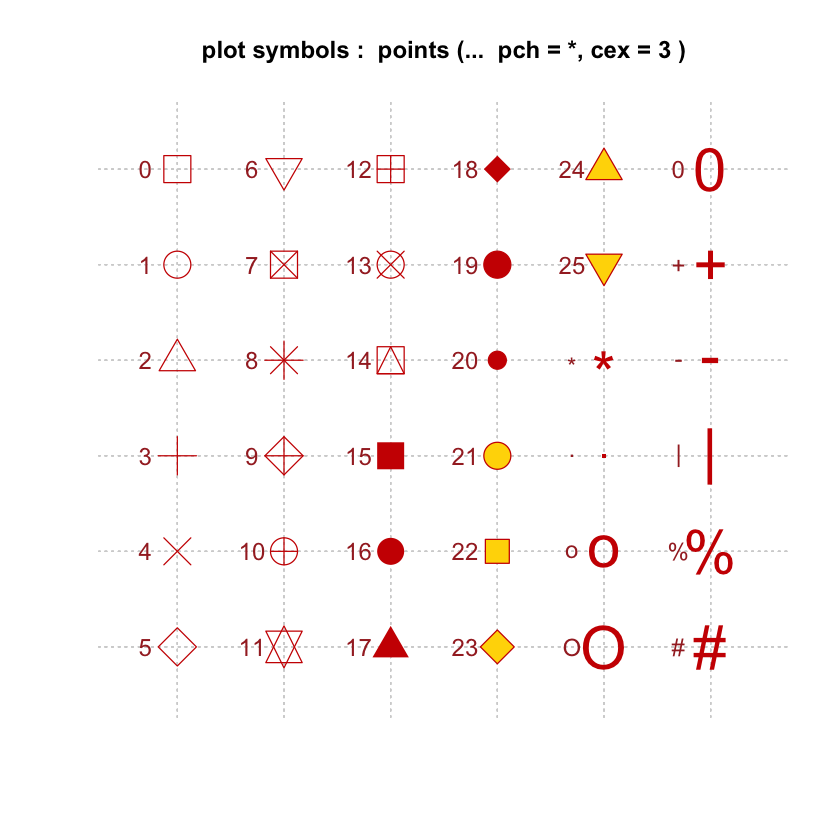

In [152]:
# To see all different point types

pchShow()

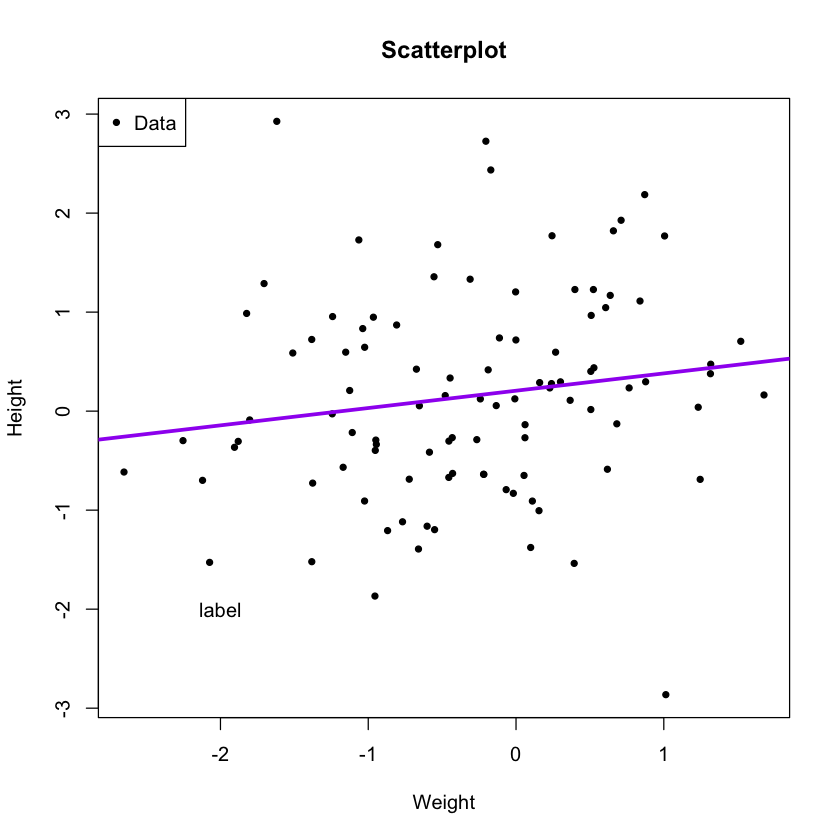

In [169]:
x <- rnorm(100)
y <- rnorm(100)
plot(x,y, pch=20, xlab = "Weight", ylab = "Height")
title("Scatterplot")
text(-2,-2,"label")
legend("topleft", legend = "Data", pch=20)
fit <- lm(y ~ x)
abline(fit, lwd = 3, col = "purple")

[1] 5.1 4.1 4.1 2.1

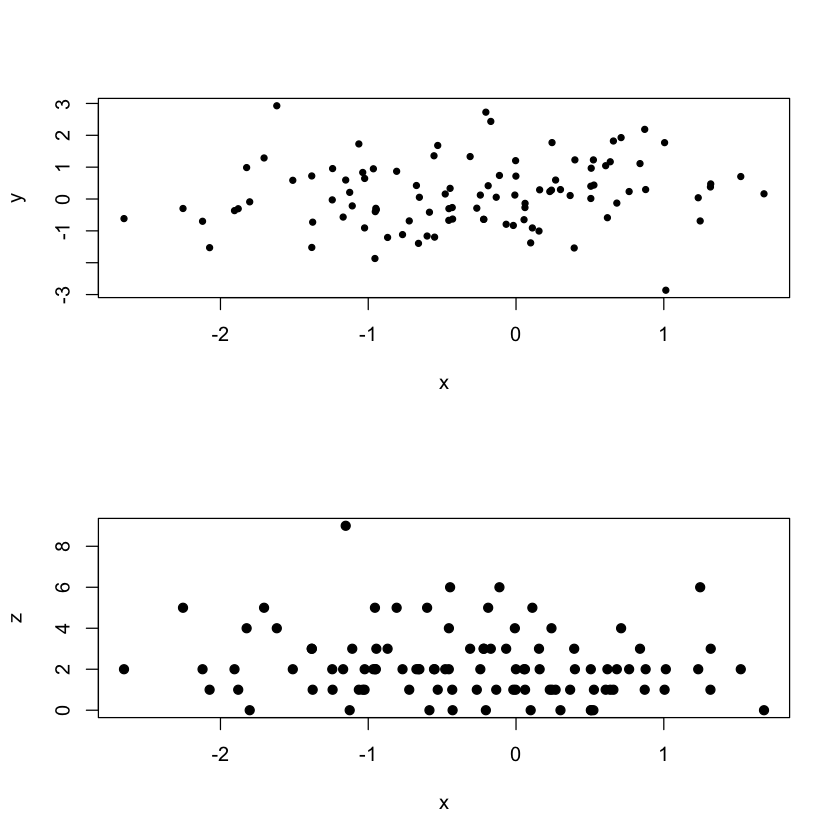

In [174]:
z <- rpois(100,2)
par(mfrow = c(2,1))
plot(x,y, pch=20)
plot(x,z, pch=19)
par("mar")
# so we need to change the margins

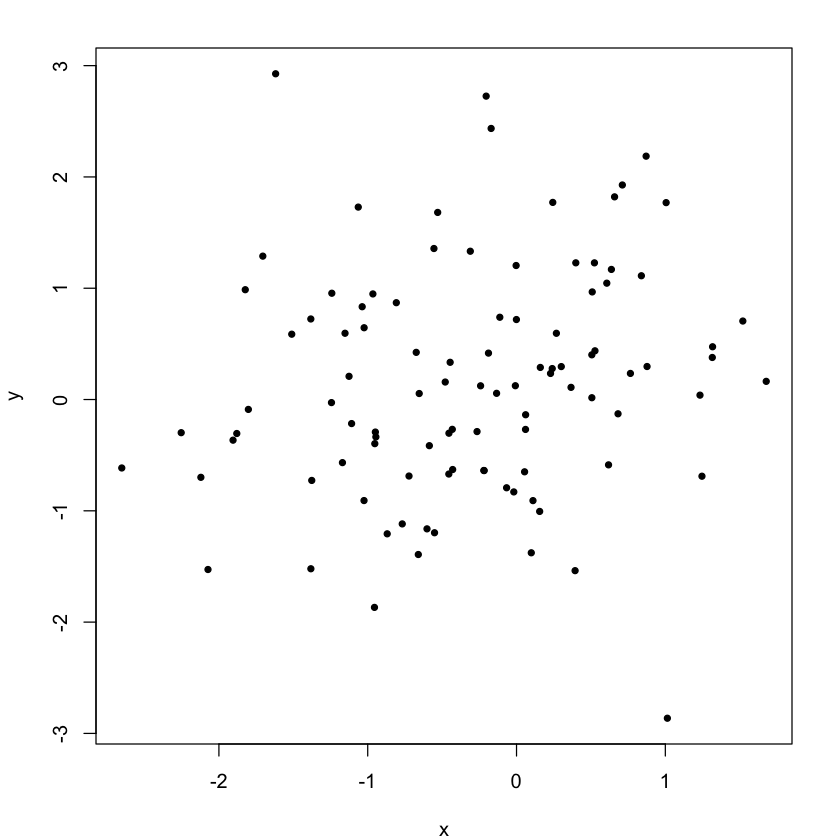

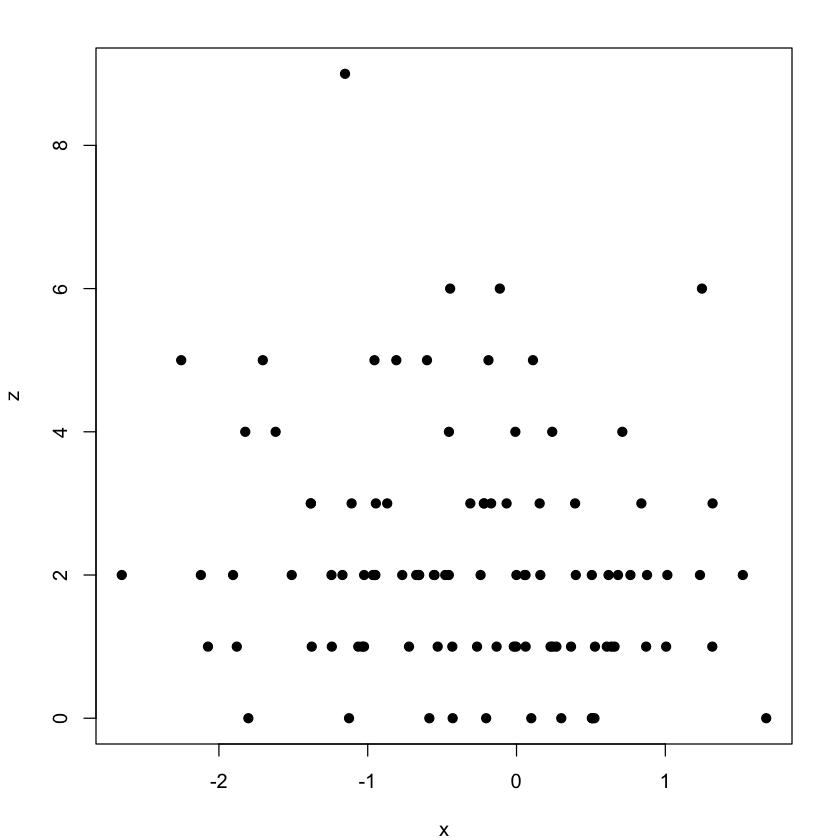

In [177]:
par(mar=c(4,4,2,2))
plot(x,y, pch=20)
plot(x,z, pch=19)

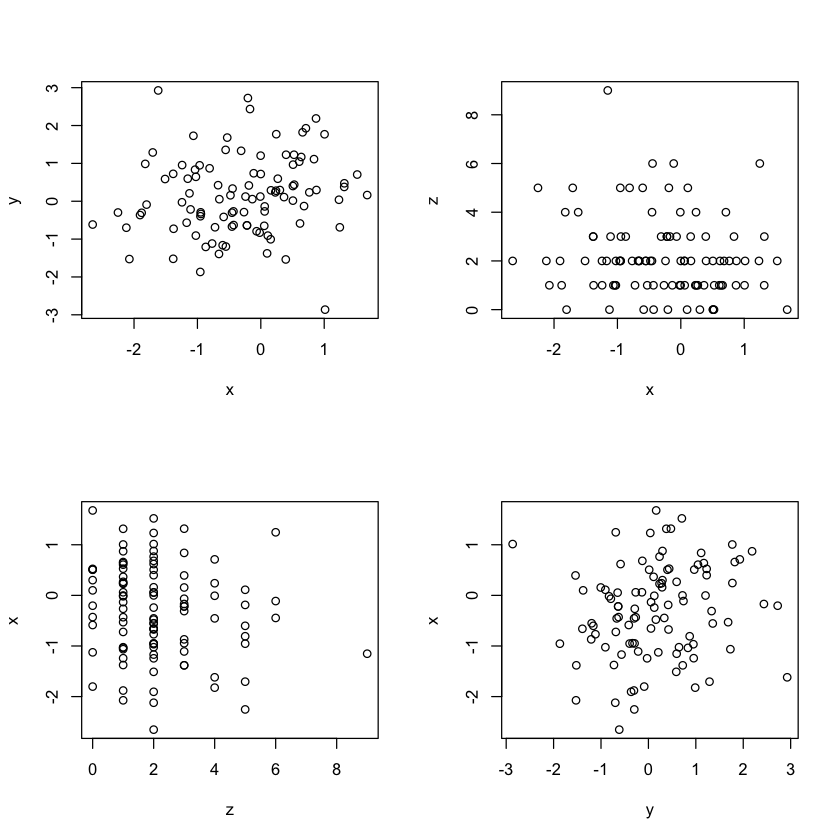

In [183]:
# fills the graphs first by row
# mfcol fills the column first

par(mfrow = c(2,2))
plot(x,y)
plot(x,z)
plot(z,x)
plot(y,x)

In [186]:
# Random Males and Females w levels and colors

par(mfrow= c(1,1))
x <- rnorm(100)
y <- x + rnorm(100)
g <- gl(2,50)
str(g)

 Factor w/ 2 levels "1","2": 1 1 1 1 1 1 1 1 1 1 ...


In [187]:
g <- gl(2, 50, labels = c("Male","Female"))
str(g)

 Factor w/ 2 levels "Male","Female": 1 1 1 1 1 1 1 1 1 1 ...


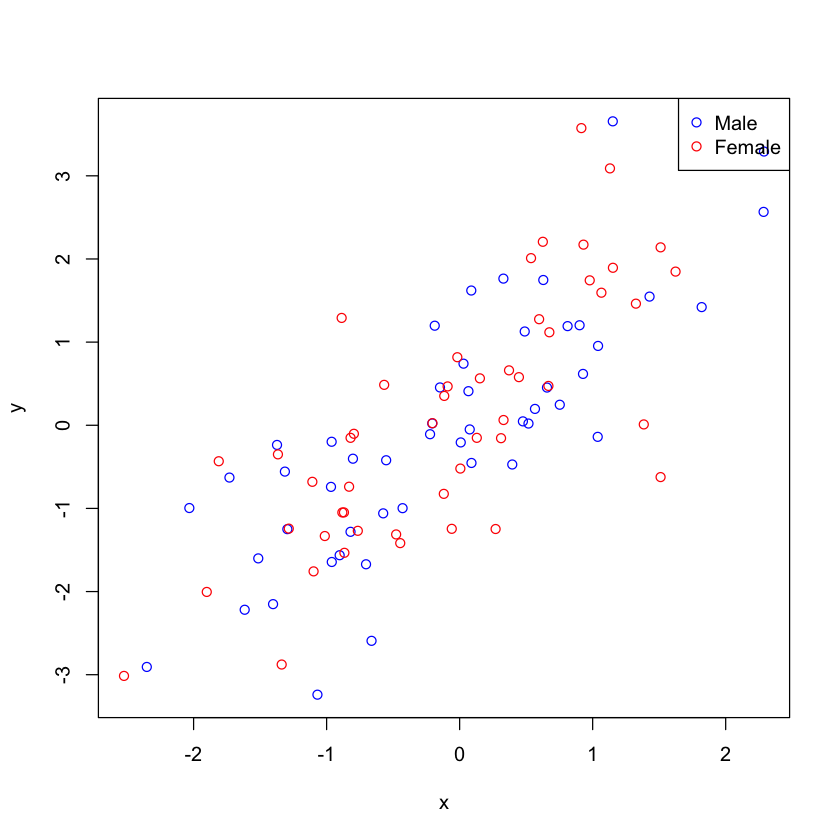

In [199]:
# Set plot region
plot(x,y,type="n")

# Add males
points(x[g=="Male"],y[g=="Male"], col = "blue")

# Add females
points(x[g=="Female"],y[g=="Female"], col = "red")

legend("topright", pch=1, col=c("blue","red"), 
       legend=c("Male", "Female"))

### Lesson 3: Graphics Devices

### 1.3.1 Graphics Devices in R 

- A graphics device is  something where you can make a plot appear
    - A window on your computer (screen device)
    - A PDF file (file device)
    - A PNG or JPEG file (file device)
    - A scalable vector graphics (SVG) file (file device)
- When you make a plot in R, it has to be *sent* to a specific graphics device
- The most common place for a plot to be *sent* is the *screen device* 
    - On a Mac the screen device is launched with the **quartz()**
    - On Windows it is launched with **windows()**
    - On Unix/Linux it is launched with **x11()**
- When making a plot, consider how the plot will be used to determine what device the plot should be sent to
    - The list of devices is found in **?Devices**; there are also devices created by users on CRAN
- For quick visualizations and exploratory analysis, usually you want the screen device
    - Functions like **plot** in base, **xyplot** in lattice, or **qplot** in ggplot2 will default to sending a plot to the screen device
    - On a given platform (Mac, Windows, Unix/Linux) there is only one screen device
- For plots that may be printed out or be incorporated into a document (e.g. papers/reports, slide ppt), usually a file device is more appropriate
    - There are many different file devices to choose from
- NOTE: Not all graphics devices are available on all platforms(i.e. you cannot launch the **windows()** on a Mac)
    

In [201]:
# Get a list of devises found 

?Devices

#### How does a plot gets created?

There are two basic approaches to plotting. The first most common:
1. Call a plotting function like **plot**, **xyplot**, or **qplot**
2. The plot appears on the screen device
3. Annotate plot if necessary
4. Enjoy


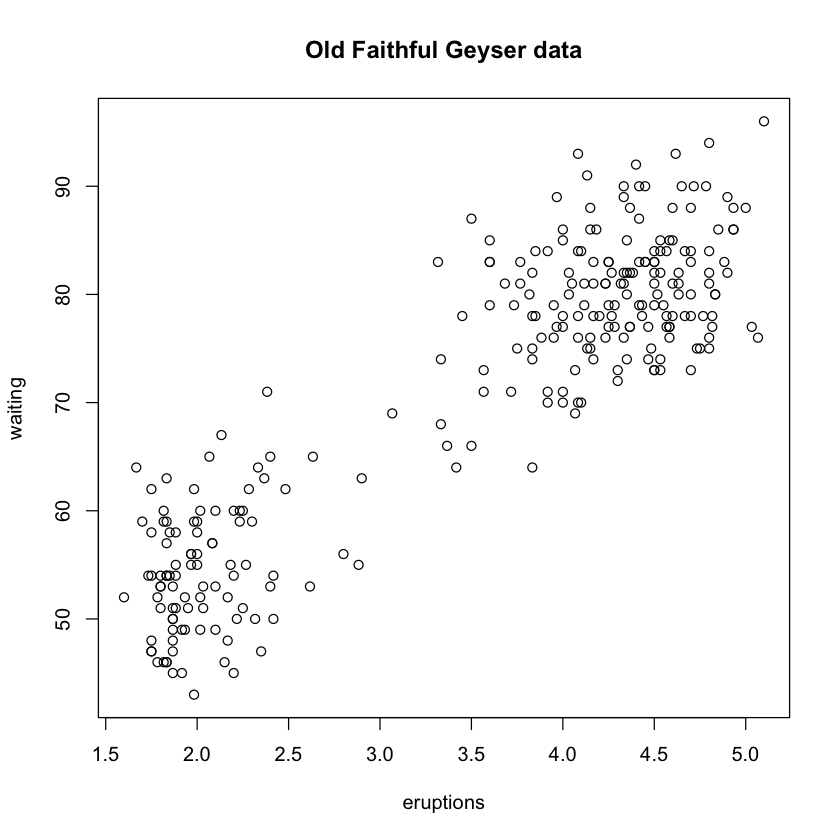

In [202]:
library(datasets)

## Make plot appear on screen device
with(faithful, plot(eruptions,waiting)) 
title(main="Old Faithful Geyser data")

#### How does a plot gets created?

The second approach to plotting is most commonly used for file devices:
1. Explicitly launch a graphics device
2. Call a plotting function to make a plot (Note: if you are using a file device, no plot will appear on the screen)
3. Annotate plot if necessary
4. Explicitly close graphics device with **dev.off()** (very important!)

In [220]:
## Open PDF device; create myplot.pdf in my working dir
pdf(file="myplot.pdf")

## Create plot and send to a file (no plot appears on screen)
with(faithful, plot(eruptions,waiting)) 
title(main="Old Faithful Geyser data")

## Close the PDF file device
dev.off() 

## Now myplot.pdf is on your computer

pdf 
  2

In [205]:
# That is where the pdf file is
getwd()

[1] "/Users/lauraochoa"

### 1.3.2 Graphics Devices in R 

#### Graphics File Devices

There are two basic types of file devices: *vector* and *bitmap* devices

- Vector formats:
    - **pdf**: useful for line-type graphics, resizes well, usually portable, not efficient if a plot has many objects/points
    - **svg**: XML-based scalable vector graphics; supports animation and interactivity, potentially useful for web-based plots
    - **win.metafile**: Windows metafile format (only on Windows)
    - **postscript**: older format, also resizes well, usually portable, can be used to create encapsulated postscript files; Windows systems often don't have postscript viewer
    
- Bitmap formats:
    - **png**: portable network graphics, bitmapped format, good for line drawings or images with solid colors, uses lossless compression (like the old GIF format), most web browsers can read this format natively, good for plotting many points, does not resize well
    - **jpeg**: good for photographs or natural scenes, uses lossy compression, good for plotting many points, does not resize well, can b eread by almost any computer and any web browser, not great for line drawings
    - **tiff**: Creates bitmap files in the TIFF format; supports lossless compression
    - **bmp**: a native Windows bitmapped format (for icons)
    
#### Multiple Open Graphics Devices
- It is possible to open multiple graphics devices (screen, file, or both), for example when viewing multiple plots at once
- Plotting can only occur on one graphics device at a time
- The **currently active** graphics device can be found by calling **dev.cur()**
- Every open graphics device is assigned an integer >=2
- You can change the active graphics device with **dev.set(<integer>)** where **<integer>** is the number associated with the graphics device you want to switch to

#### Copying Plots
- **dev.copy**: copy a plot from one device to another
- **dev.copy2pdf**: specifically copy a plot to a PDF file
NOTE: copying a plot is not an exact operation, so the result may not be identical to the original

quartz_off_screen 
                4

pdf 
  2

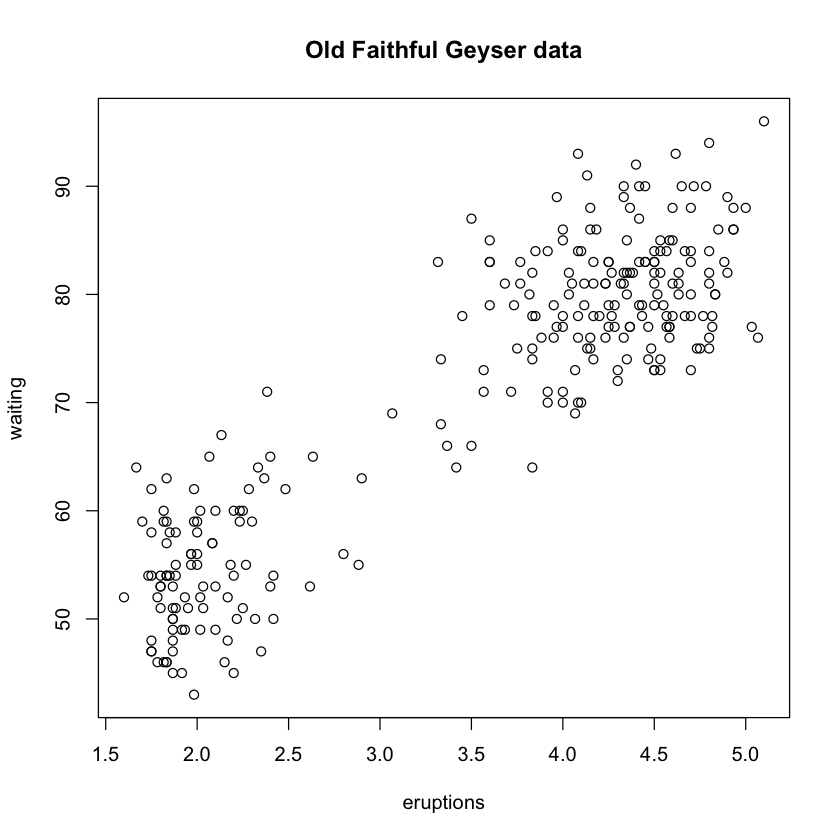

In [17]:
library(datasets)

## Create plot on screen device
with(faithful, plot(eruptions,waiting)) 
title(main="Old Faithful Geyser data")

## Copy my plot to a PNG file
dev.copy(png, file = "geyserplot.png")

## Close the PNG device!
dev.off()

# Now my plot is under my working directory!

pdf 
  2

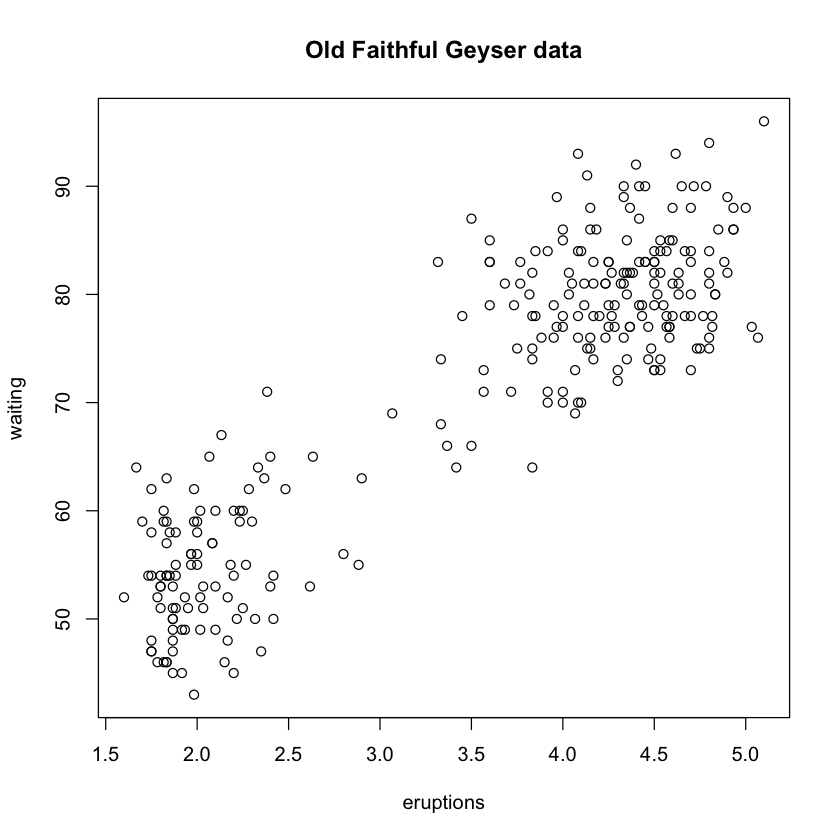

In [18]:
library(datasets)

## Create plot on screen device
with(faithful, plot(eruptions,waiting)) 
title(main="Old Faithful Geyser data")

# Create pdf file in working directory
pdf(file="myplot.pdf")

# Close pdf device
dev.off()

### 1.4.1 Swirl notes

www.edwardtufte.com


## Week 2

### Lesson 1: Lattice Plotting System

#### 2.1.1 Lattice Plotting System
Designed to make high-density plots.

The lattice plotting system is implemented using the packages:
- **lattice**: contains code for producing Trellis graphics, independent from the base graphics system; functions like **xyplot, bwplot, levelplot, etc.**
- **grid**: implements a different graphing system independent of the base system, the *lattice package* builds on top of *grid*
    - We seldom call functions from the *grid* package directly
- The lattice plotting system does not have a *two-phase* aspect with separate plotting and annotation like in base plotting
- All plotting/annotation is done at once with a single function call

#### Lattice Functions

- **xyplot**: main function for creating scatterplots
- **bwplot**: box-and-whiskers plots (boxplots)
- **histogram**: histograms
- **stripplot**: like a boxplot but with actual points
- **dotplot**: plot dots on *violin strings*
- **splom**: scatterplot matrix; like **pairs** in base plotting system
- **levelplot**, **contourplot**: for plotting *image* data

Lattice functions generally take a formula for their first argument, usually of the form: **xyplot(y ~ x | f * g, data)**
- We use the *formula notation* here, hence the **~**.
- On the left of the ~ is the y-axis variable, on the right is the x-axis variable
- *f* and *g* are *conditioning variables* - they are optional
    - The * indicates an interaction between two variables
- The second argument is the data frame or list from which the variables in the formula should be looked up
    - If no data frame or list is passed, then the parent frame is used
- If no other arguments are passed, there are defaults that can be used

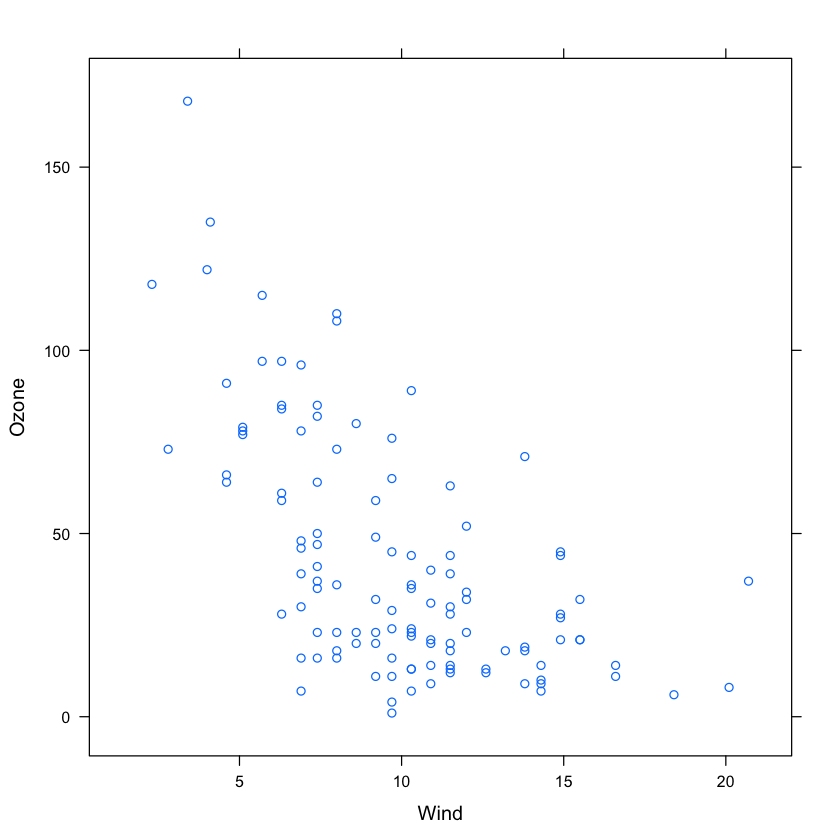

In [1]:
library(lattice)
library(datasets)
## Simple scatterplot
xyplot(Ozone ~ Wind, data = airquality)

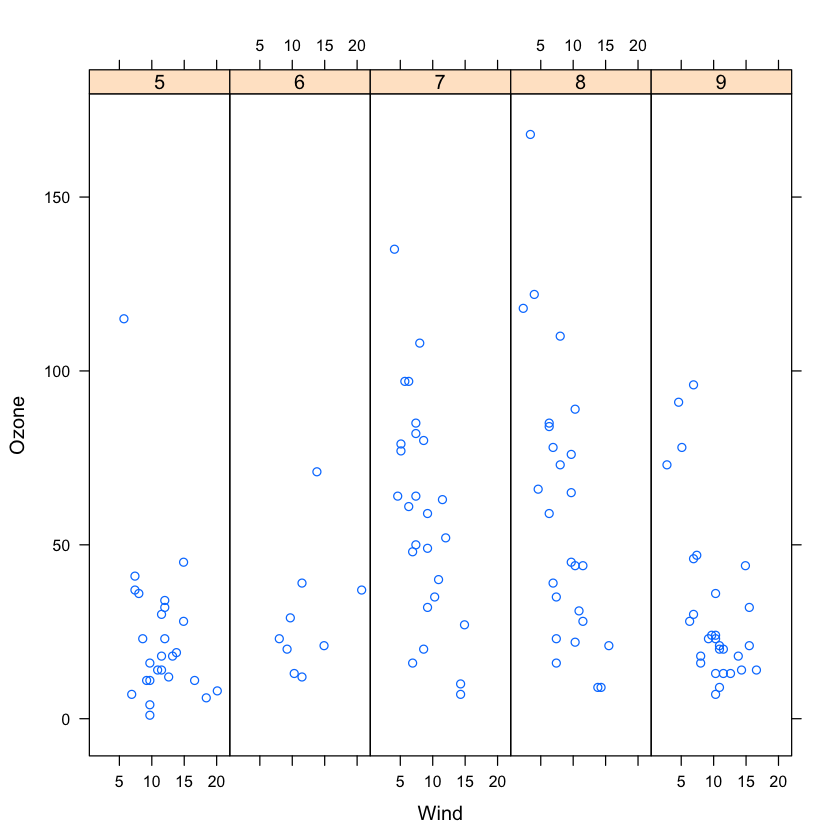

In [4]:
library(lattice)
library(datasets)
## Convert Month into a factor variable
airquality <- transform(airquality, Month = factor(Month))
xyplot(Ozone ~ Wind | Month, data = airquality, layout = c(5,1))

#### Lattice Behaviour

Lattice functions behave differently from base graphics functions in one critical way.
- Base graphics functions plot data *directly* to the graphics device (screen, PDF file, etc.)
- Lattice graphics functions retunr an *object* of the class **trellis**
- The print methods for lattice functions actually do the work of plotting the data on the graphics device
- Lattice functions return *plot objects* than can, in principle, be stored (but it's usually better to just save the code + data).
- On the command line, trellis objects are *auto-printed* so that it appears the function is plotting the data


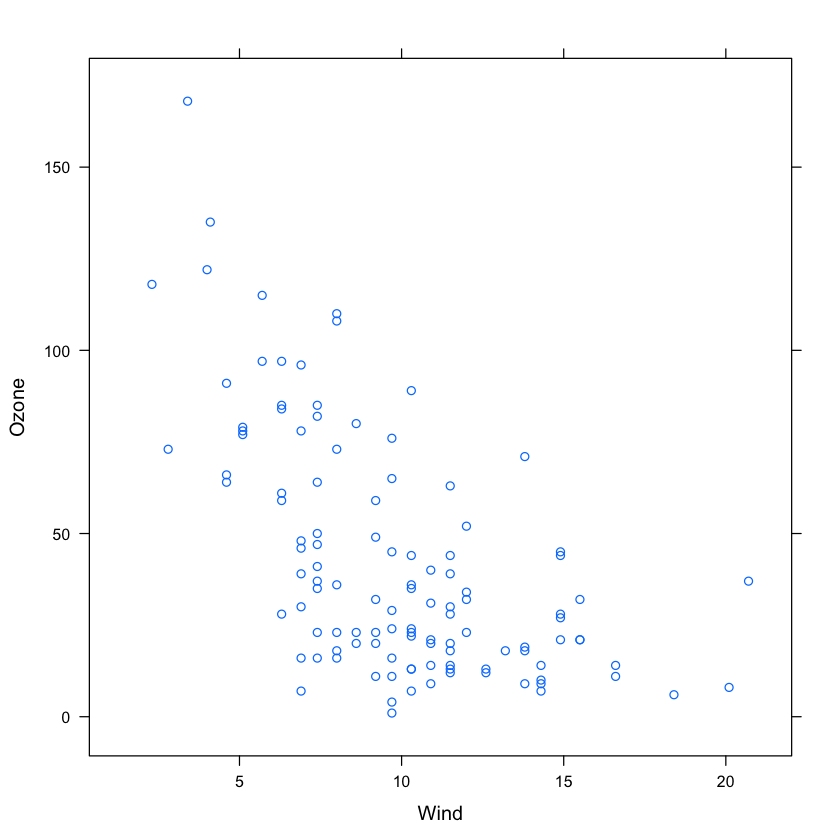

In [5]:
p <- xyplot(Ozone ~ Wind, data = airquality) ## nothing happens!
print(p) ## plot appears

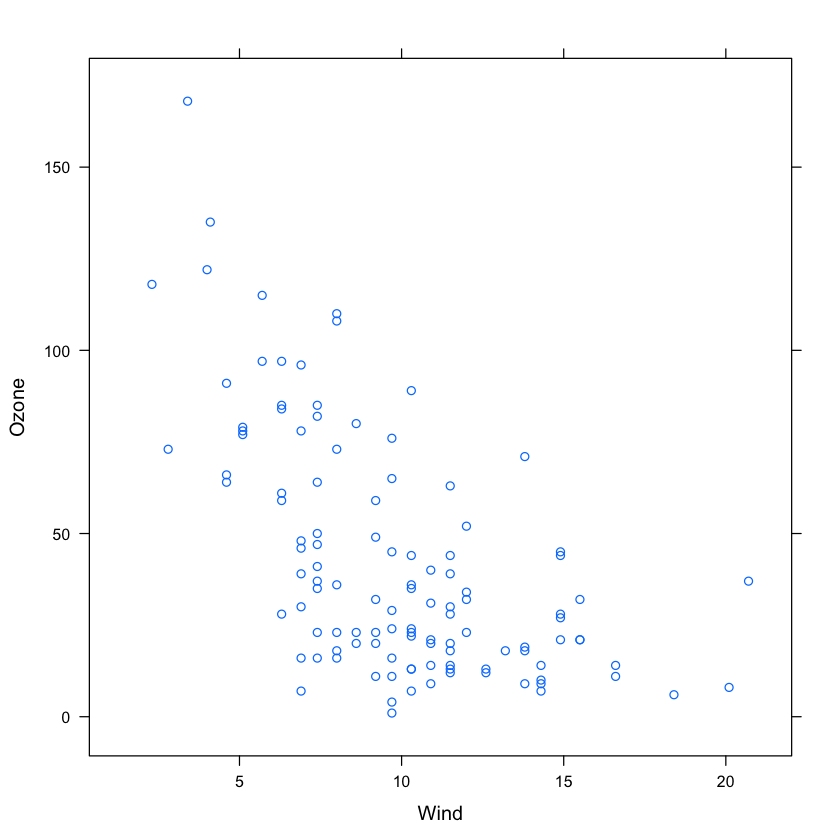

In [6]:
xyplot(Ozone ~ Wind, data = airquality)  ## autoprinting!

#### 2.1.2 Lattice Plotting System

- Lattice functions have a *panel function* which controls what happens inside each panel of the plot.
- The *lattice package* comes with default panel functions, but you can supply your own if you want to customize what happens in each panel
- Panel functions receive the x/y coordinates of the data points in their panel (along with any optional arguments)

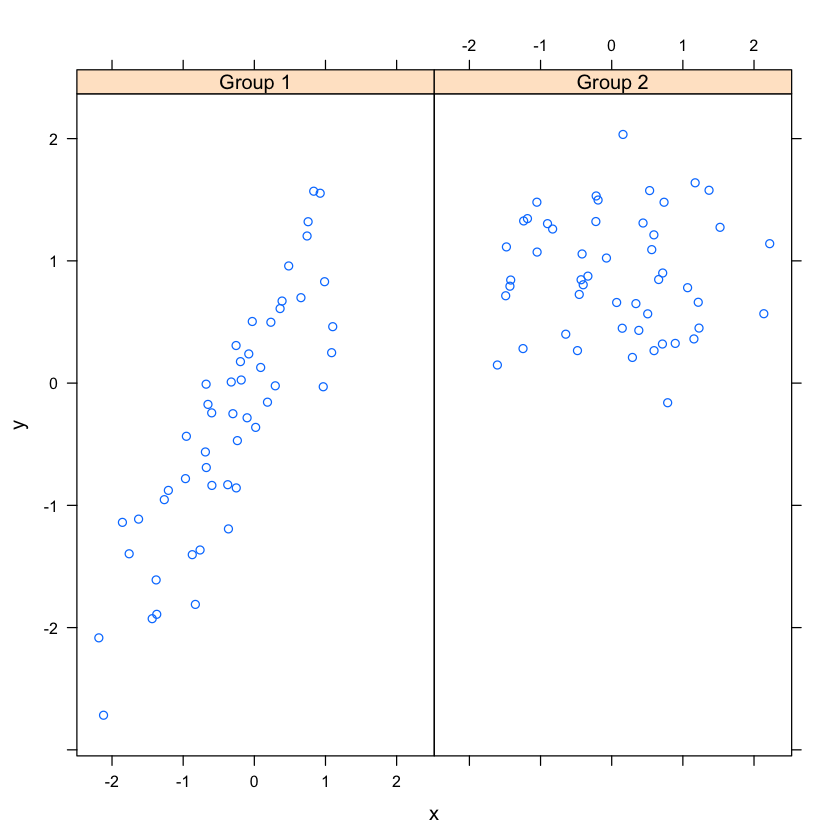

In [13]:
set.seed(10)
x <- rnorm(100)
f <- rep(0:1, each = 50)
y <- x + f - f * x + rnorm(100, sd = 0.5)
f <- factor(f, labels = c("Group 1", "Group 2"))
xyplot(y ~ x | f, layout = c(2,1)) ## Plot with two panels

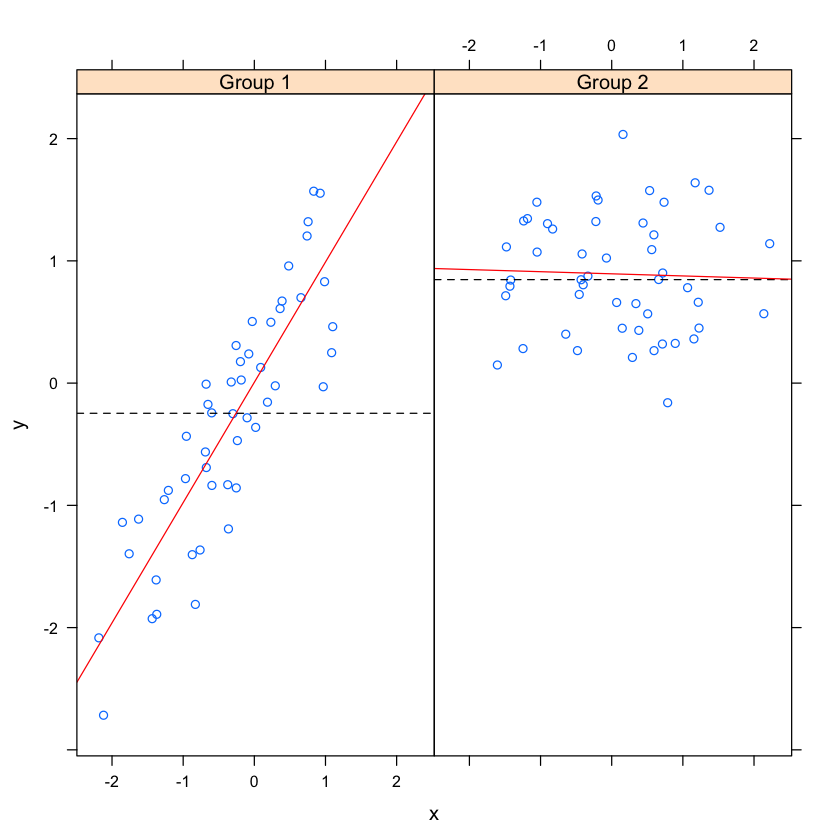

In [15]:
## Calling a custom panel function
xyplot(y ~ x | f, panel = function(x,y, ...){
    panel.xyplot(x, y, ...) ## First call the default panel function for xyplot
    panel.abline(h=median(y), lty=2) ## add median line
    panel.lmline(x, y, col = 2) ## add regression line
})

#### Summary

- Lattice plots are constructed with a single function call to a core lattice function (e.g. xyplot)
- Aspects like margins and spacing are automatically handled and defaults are usually sufficient
- The lattice system is idea for creating conditioning plots where you examine the same kind of plot under many different conditions
- Panel functions can be specified/customized to modifz what is plotted in each of the plot panels

#### Swirl Lattice

If I have a graph code in **plot1.R**, I can call it using **source(pathtofile("plot2.R"),local=TRUE)**

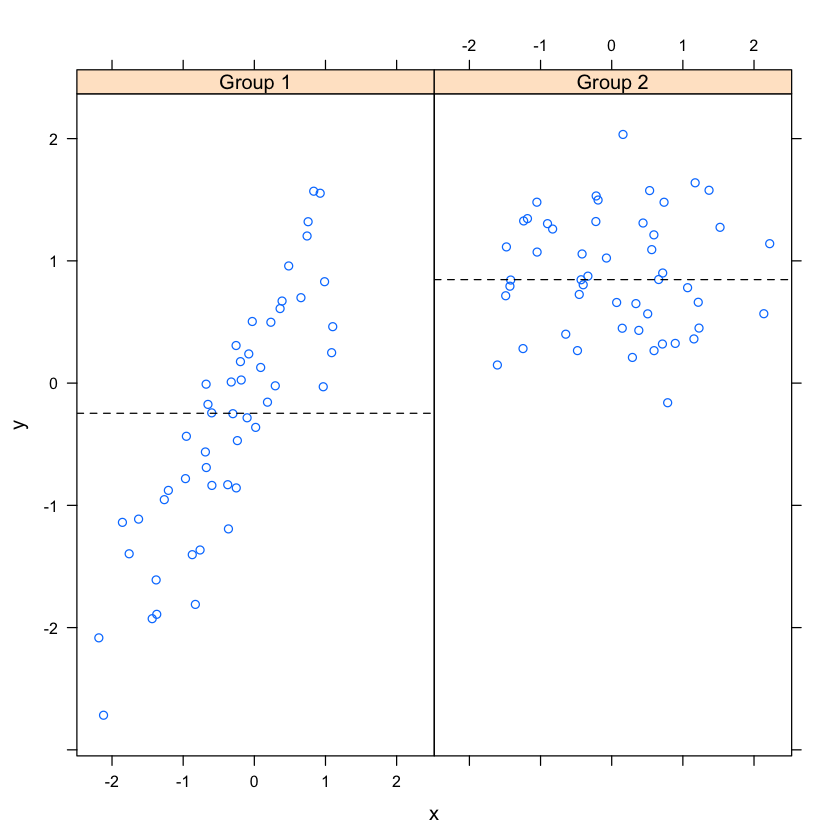

In [20]:
# plot1.R
p <- xyplot(y ~ x | f, panel = function(x, y, ...) {
  panel.xyplot(x, y, ...)  ## First call the default panel function for 'xyplot'
  panel.abline(h = median(y), lty = 2)  ## Add a horizontal line at the median
})
print(p)
invisible()

# Call this using:
# source(pathtofile("plot1.R"),local=TRUE)

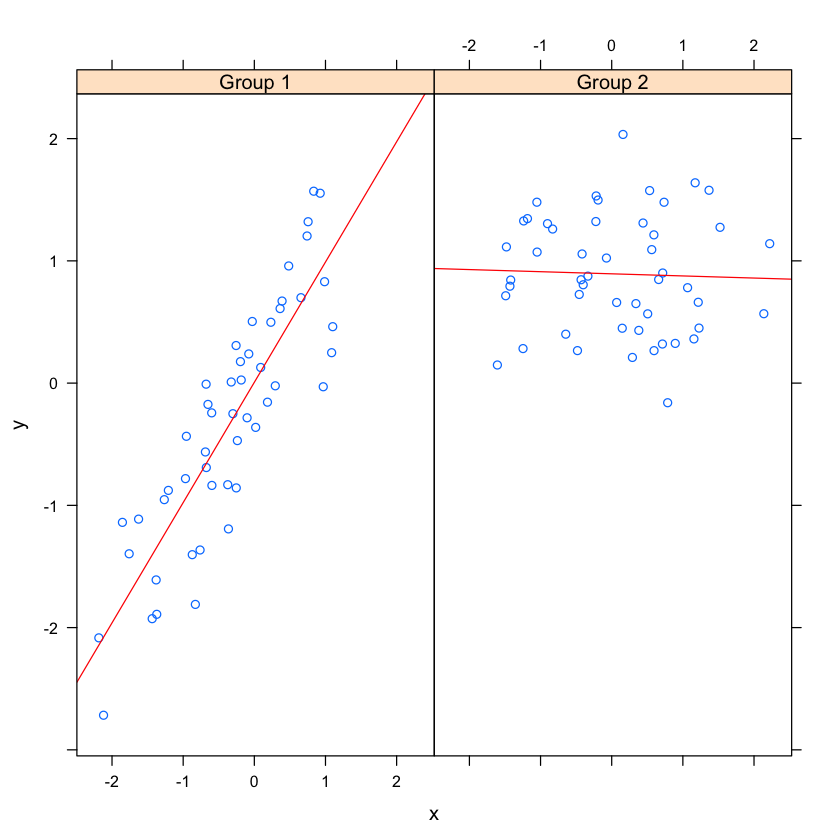

In [19]:
# plot2.R
p2 <- xyplot(y ~ x | f, panel = function(x, y, ...) {
  panel.xyplot(x, y, ...)  ## First call default panel function
  panel.lmline(x, y, col = 2)  ## Overlay a simple linear regression line
})
print(p2)
invisible()

In [ ]:
## If I save some label data under myLabels.R 
# myedit("myLabels.R")

## I could call them using:
# source(pathtofile("myLabels.R"),local=TRUE)

### Lesson 2: ggplot2

#### 2.2.1 ggplot2

- ggplot2 is a package in R, implementation of the *grammar of graphics* by Leland Wilkinson
- Written by Hadley Wickham (while he was a graduate student at Iowa State)
- Available from CRAN via install.packages(), check ggplot2.org

- Grammar of graphics represents an abstraction of graphics ideas/objects
- Think "verb", "noun", "adjective" for graphics
- Allows for a "theory" of graphics on which to build new graphics and graphics objects
- Shorten the distance from mind to page

- In brief, the grammar tells us that a statistical graphic is a **mapping** from data to **aesthetic** attributes (colour, shape, size) of **geometric** objects (points, lines, bars). The plot may also contain statistical transformations of the data and is drawn on a specific coordinate system.

#### The basics: qplot() - or the quick plot

- Works much like the plot function in base graphics system
- Looks for data in a data frame, similar to lattice, or in the parental environment
- Plots are made up of *aesthetics* (size, shape, color) and *geoms* (points, lines)
- Factors are important for indicating subsets of the data (if they are to have different properties); they should be **labeled**
- The **qplot()** hides what goes on underneath, which is okay for most operations
- **ggplot()** is the core function and very flexible for doing things **qplot()** cannot do


In [24]:
# Load ggplot2 package, comes with mpg dataset
library(ggplot2)
str(mpg)

Classes ‘tbl_df’, ‘tbl’ and 'data.frame':	234 obs. of  11 variables:
 $ manufacturer: chr  "audi" "audi" "audi" "audi" ...
 $ model       : chr  "a4" "a4" "a4" "a4" ...
 $ displ       : num  1.8 1.8 2 2 2.8 2.8 3.1 1.8 1.8 2 ...
 $ year        : int  1999 1999 2008 2008 1999 1999 2008 1999 1999 2008 ...
 $ cyl         : int  4 4 4 4 6 6 6 4 4 4 ...
 $ trans       : chr  "auto(l5)" "manual(m5)" "manual(m6)" "auto(av)" ...
 $ drv         : chr  "f" "f" "f" "f" ...
 $ cty         : int  18 21 20 21 16 18 18 18 16 20 ...
 $ hwy         : int  29 29 31 30 26 26 27 26 25 28 ...
 $ fl          : chr  "p" "p" "p" "p" ...
 $ class       : chr  "compact" "compact" "compact" "compact" ...


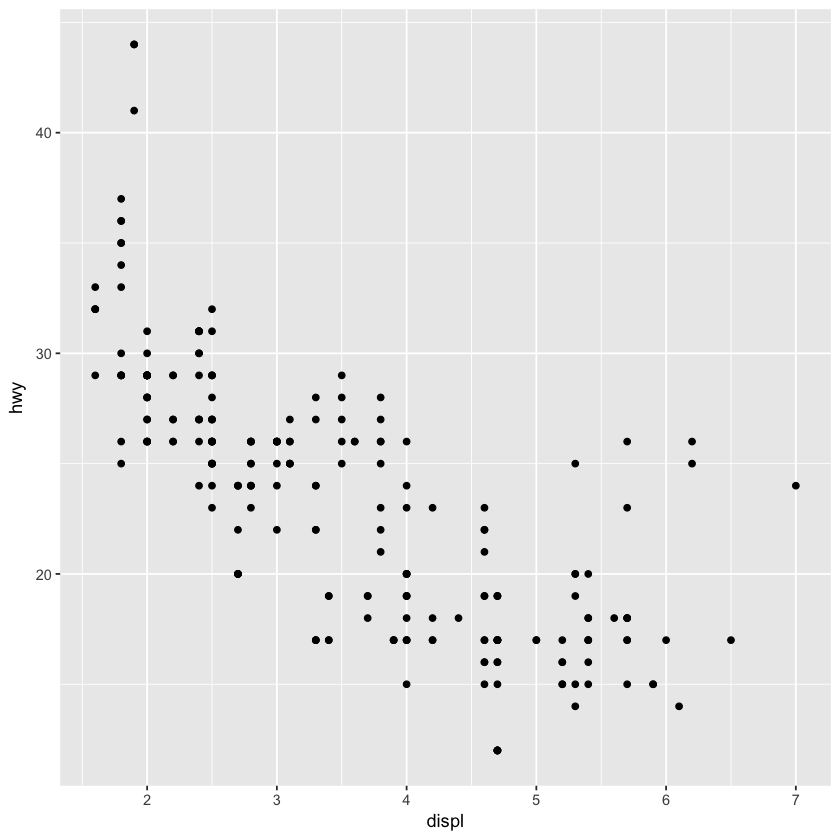

In [25]:
library(ggplot2)
qplot(displ, hwy, data = mpg)

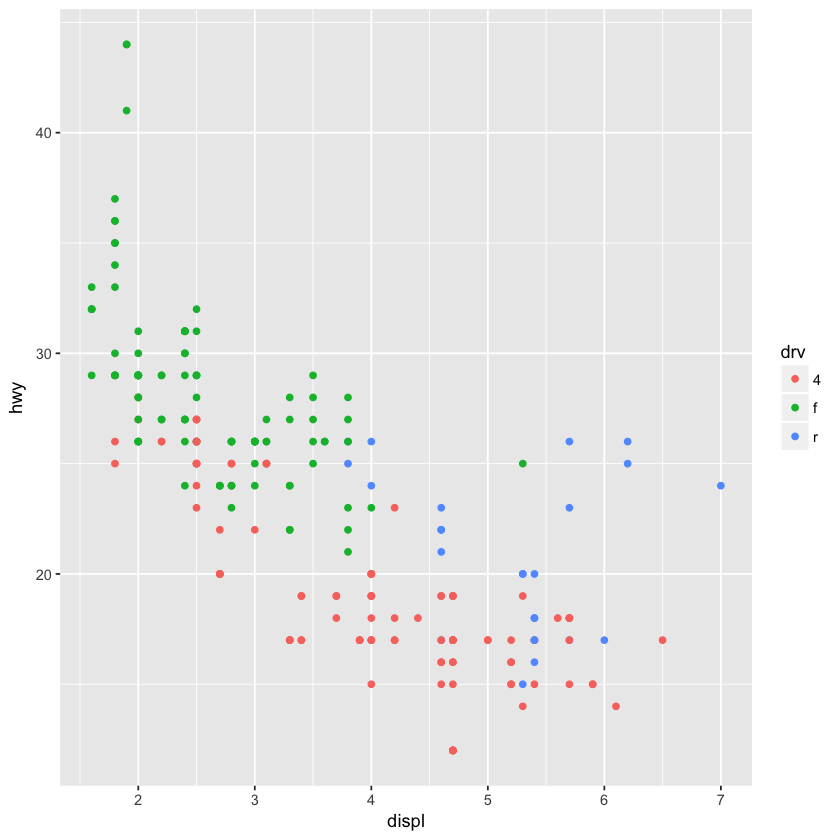

In [26]:
# Modifying aesthetics

qplot(displ, hwy, data = mpg, color = drv)

`geom_smooth()` using method = 'loess'


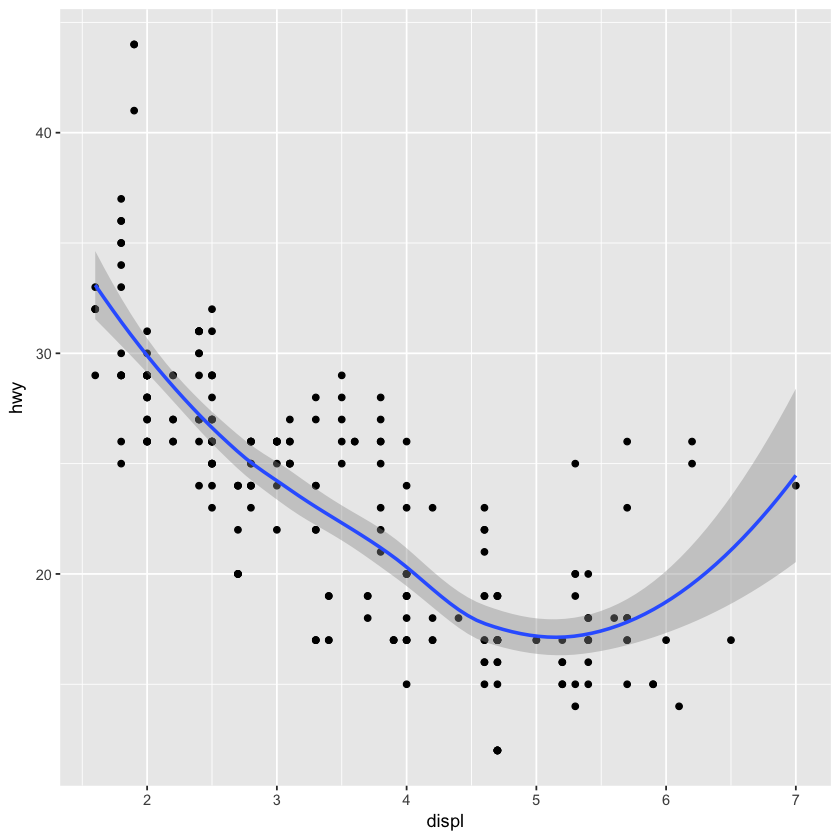

In [30]:
# Adding a geom / Some statistics, data summary

qplot(displ, hwy, data = mpg, geom = c("point", "smooth"))

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


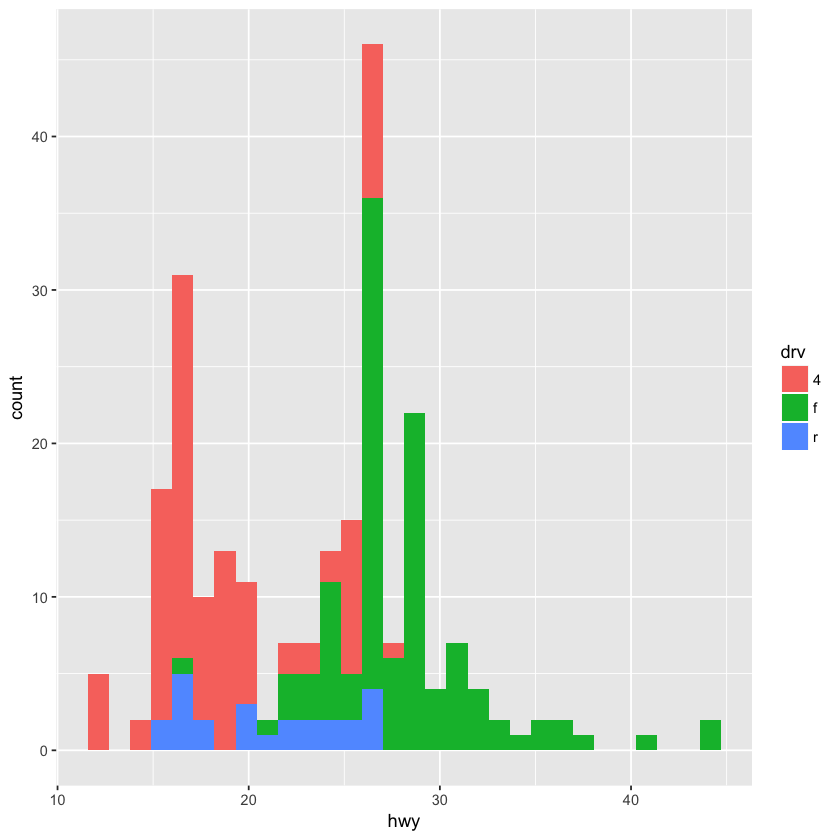

In [67]:
# Histograms

qplot(hwy, data = mpg, fill = drv)

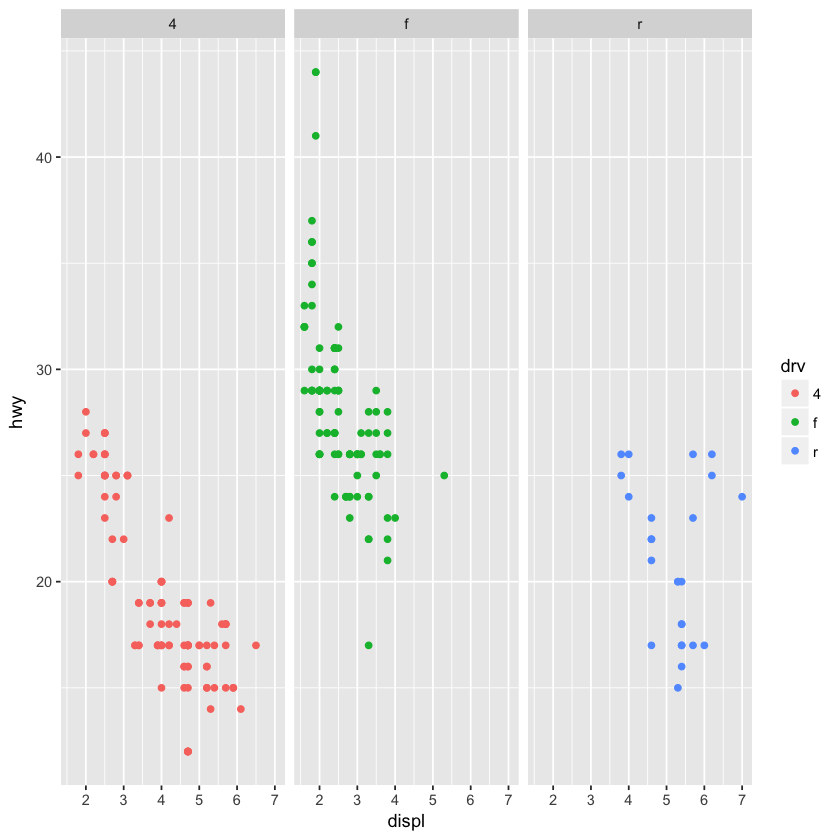

In [33]:
# Facets: like panels in lattice

qplot(displ, hwy, data = mpg, facets = .~ drv, col = drv)

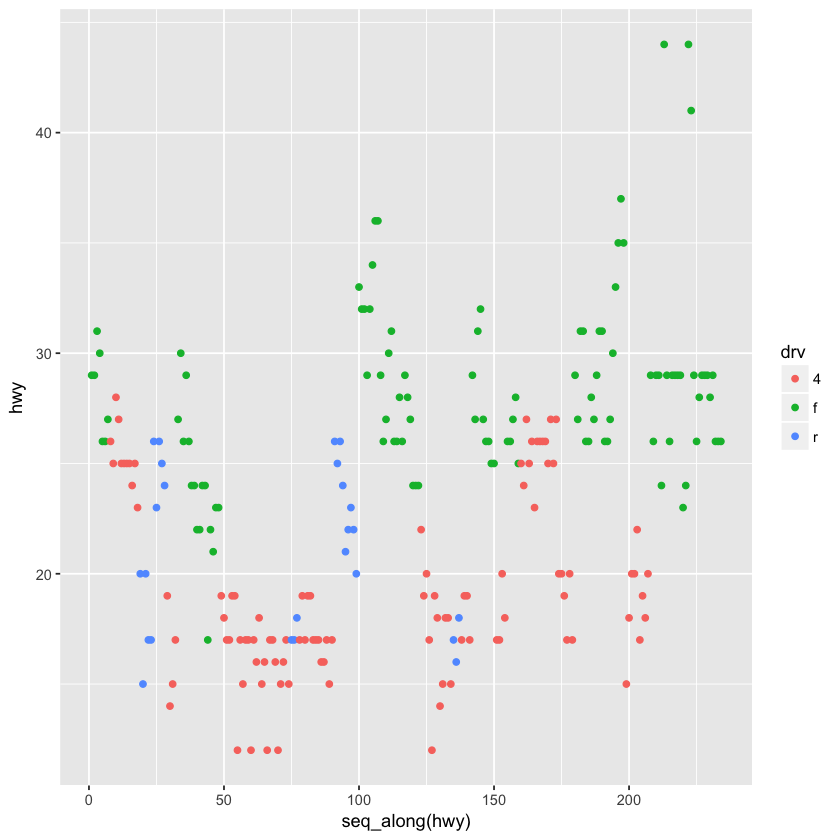

In [61]:
# So, specifying the y parameter only, without an x argument, 
# plots the values of the y argument in the order in which
# they occur in the data.

qplot(y=hwy,data=mpg,color=drv)

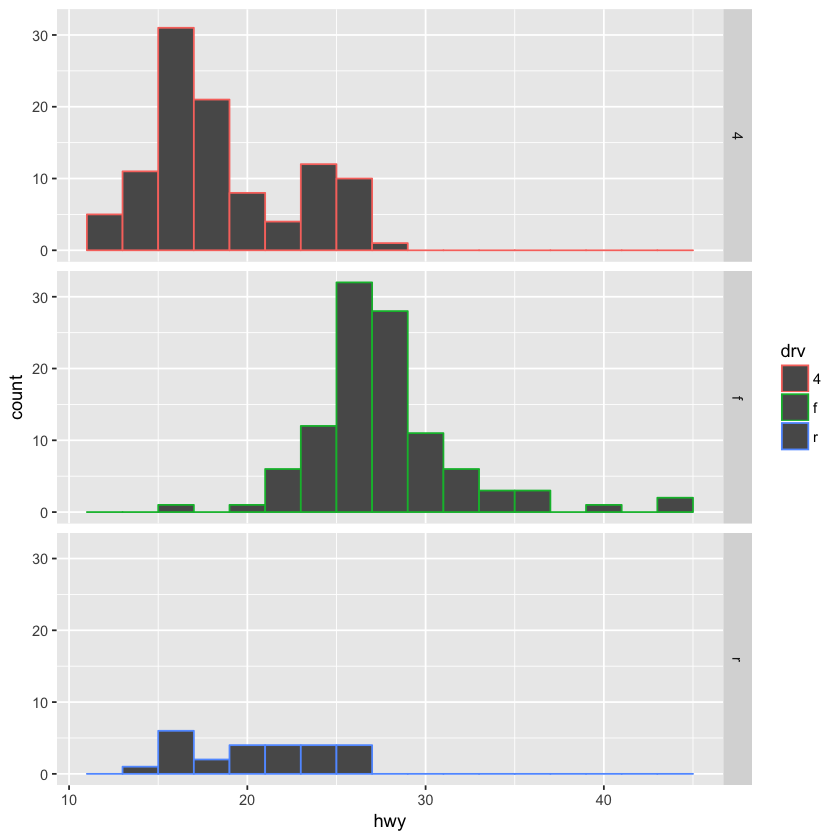

In [34]:
qplot(hwy, data = mpg, facets = drv ~., col = drv, binwidth = 2)

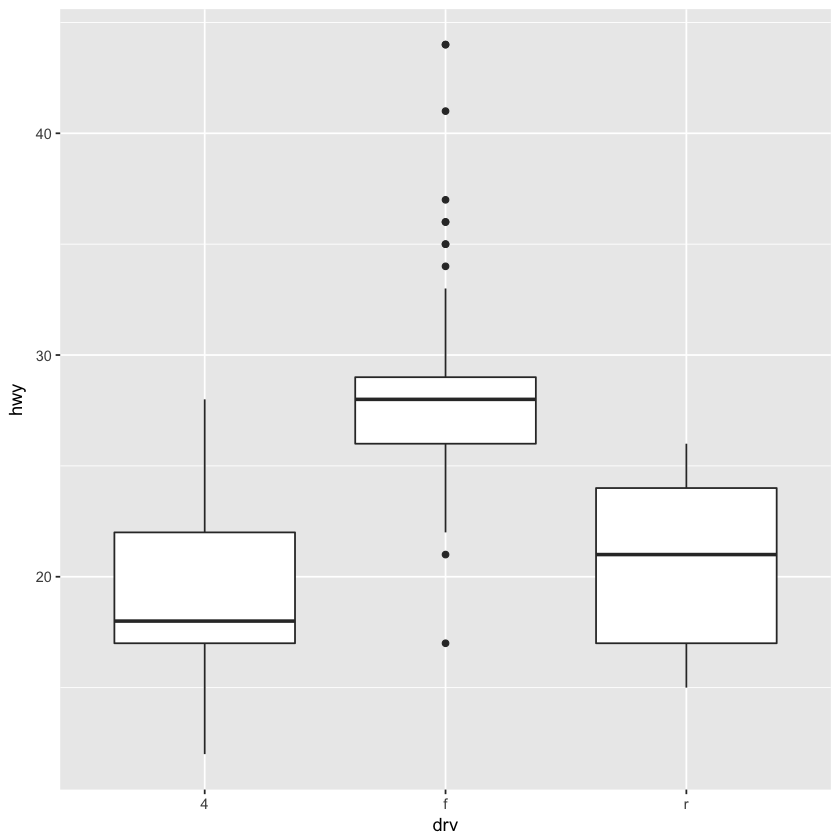

In [62]:
# First specify the variable by which you'll split the data, 
# in this case drv, then specify the variable which you want 
# to examine, in this case hwy.

qplot(drv, hwy, data = mpg, geom = "boxplot")

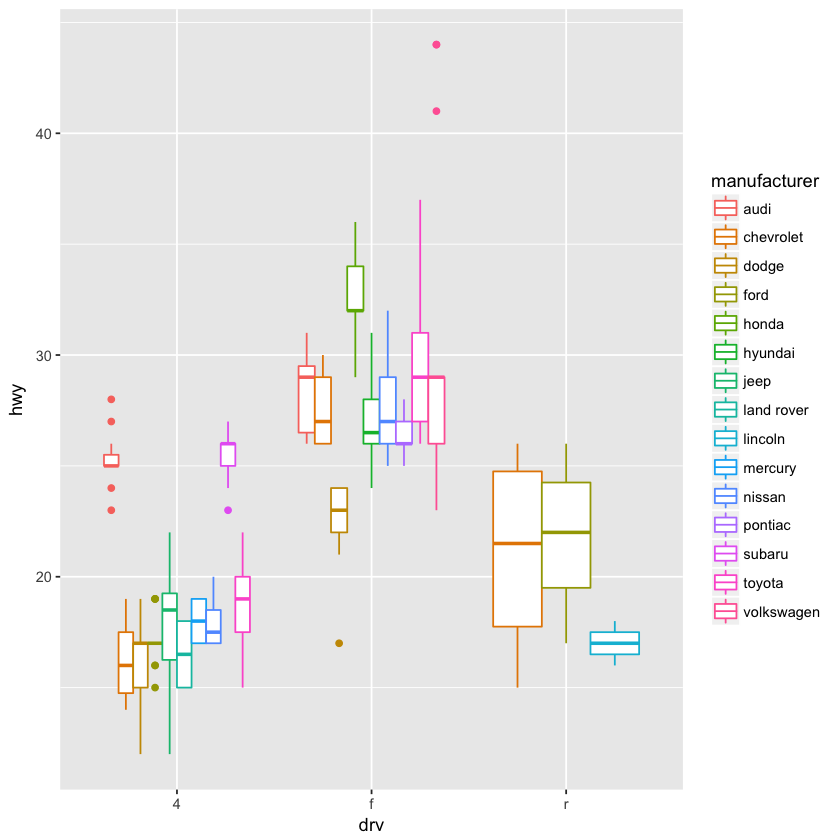

In [63]:
qplot(drv, hwy, data = mpg, geom = "boxplot", color=manufacturer)

In [48]:
# Mouse Allergen and Asthma Cohort Study, children 5-17, studies
# indoor environment and its relationship with asthma morbidity

# smooth with geom density
qplot(var, data, geom="density")

# separating groups by shape or by color
qplot(var1,var2, data, shape=var, col=var)

# adding lm and smoothline
qplot(var1,var2, data, col=var) + geom_smooth(method="lm")

# also possible to split data out with the facets
qplot(var1,var2, data, facets=.~var) + geom_smooth(method="lm")


#### Summary of qplot()

- Very easy and nice graphics
- Difficult to go against the grain/customize (don-t bother, use full ggplot2 power in that case)


#### 2.2.2 ggplot2

#### Basic components of ggplot2 plot
- A **data frame**
- **aesthetic mappings**: how data are mapped to color, size
- **geoms**: geometric objects like points, lines, shapes
- **facets**: for conditional plots
- **stats**: statistical transformation like binning, quantiles, smoothing
- **scales**: what scale an aesthetic map uses (example: male=red, female=blue)
- **coordinate system**

#### Building plots with ggplot2
- When building plots with ggplot2, the artists palette model be the closes analogy
- Plots are built up in layers
    - Plot the data
    - Overlay a summary
    - Metadata and annotation

In [83]:
# being g a ggplot2

## initial call to ggplot, define aesthetics
g <- ggplot(mpg, aes(displ, hwy))
summary(g) ## provides info about the graph object

data: manufacturer, model, displ, year, cyl, trans, drv, cty, hwy, fl,
  class [234x11]
mapping:  x = displ, y = hwy
faceting: <ggproto object: Class FacetNull, Facet>
    compute_layout: function
    draw_back: function
    draw_front: function
    draw_labels: function
    draw_panels: function
    finish_data: function
    init_scales: function
    map: function
    map_data: function
    params: list
    render_back: function
    render_front: function
    render_panels: function
    setup_data: function
    setup_params: function
    shrink: TRUE
    train: function
    train_positions: function
    train_scales: function
    vars: function
    super:  <ggproto object: Class FacetNull, Facet>


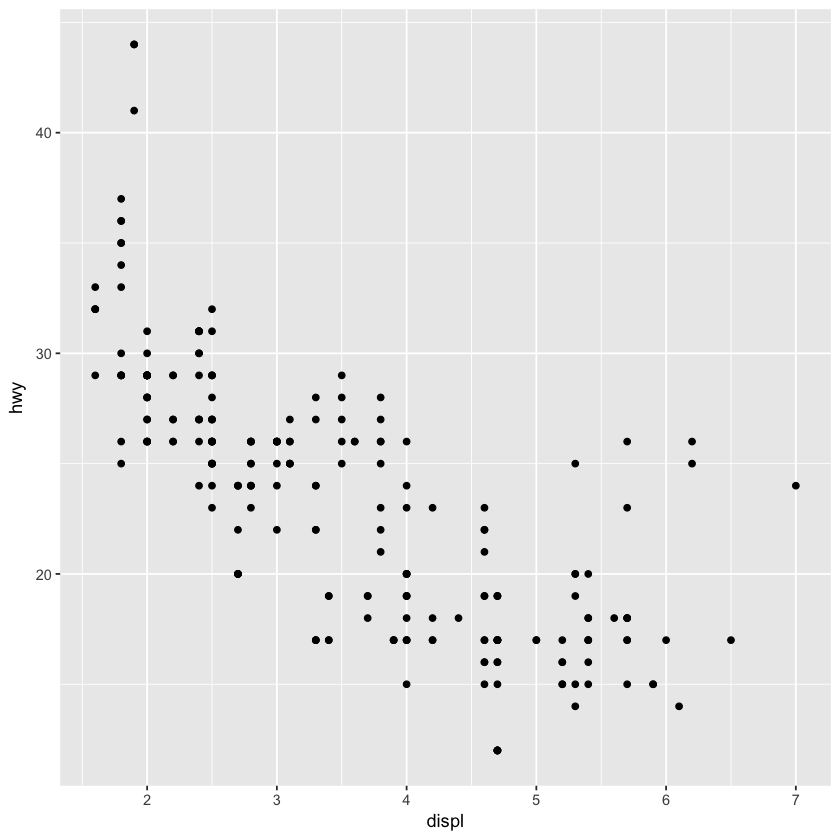

In [84]:
## adding what g needs to do
g+geom_point()


`geom_smooth()` using method = 'loess'


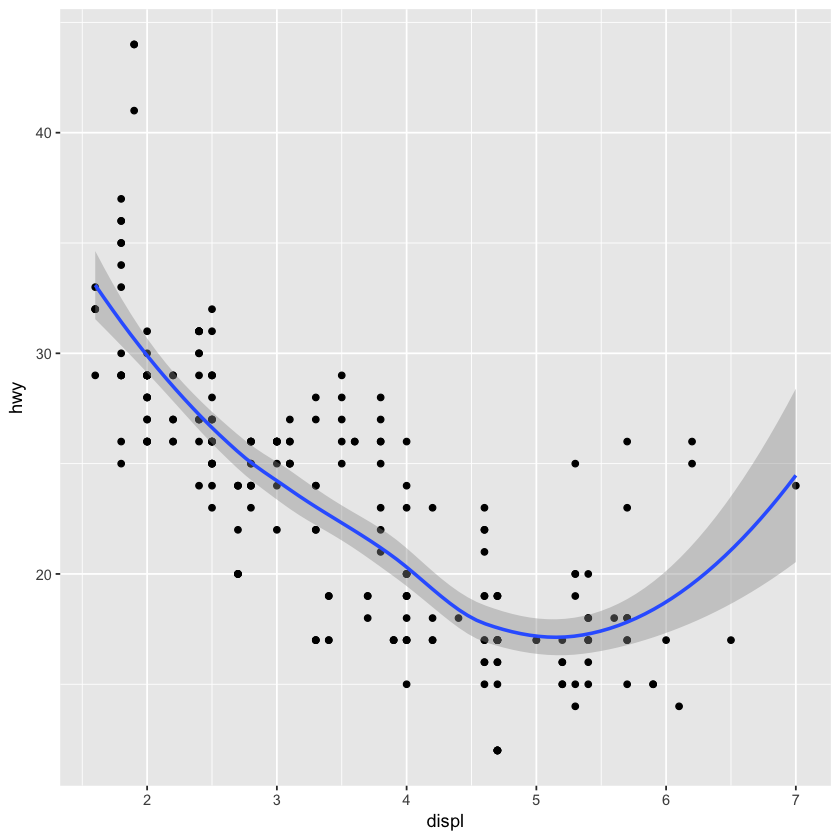

In [85]:
## flexible smoother
g + geom_point() + geom_smooth() 

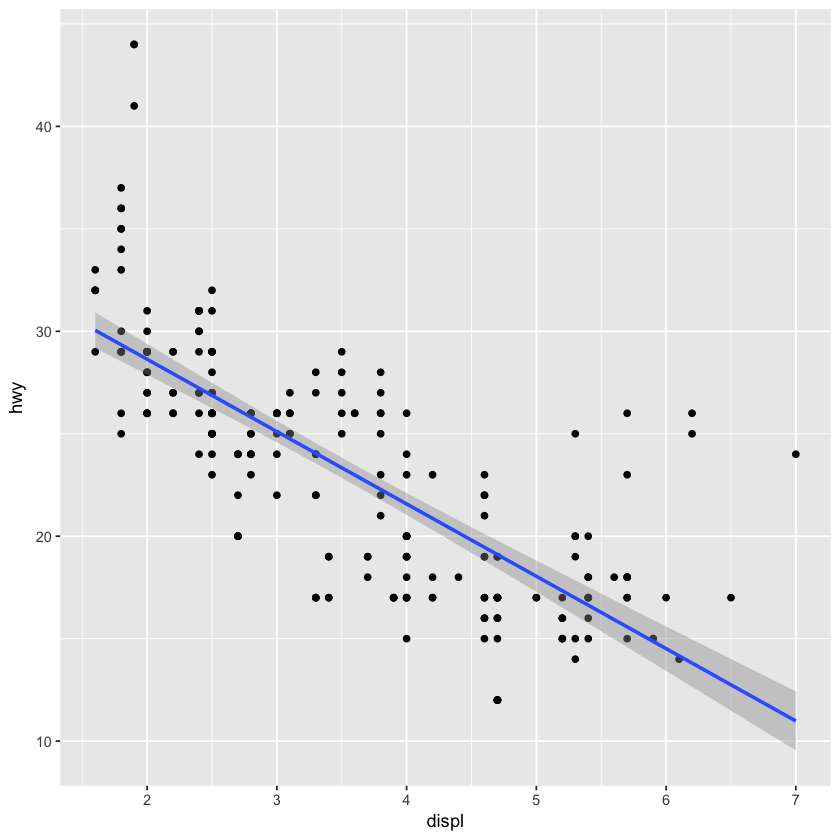

In [86]:
## linear regression line
g + geom_point() + geom_smooth(method="lm") 


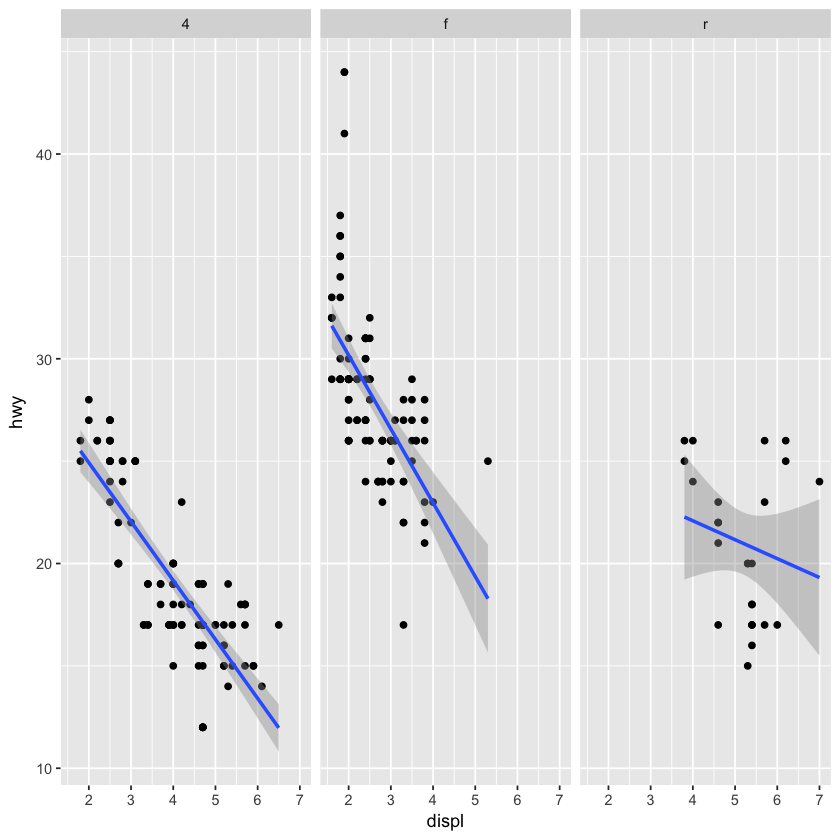

In [88]:
## adding a facet
g + geom_point() + facet_grid(. ~ drv) + geom_smooth(method="lm") 


#### Annotation

- Labels: xlab(), ylab(), labs(), ggtitle()
- Each of the geom functions has options to modify
- For things that only make sense globally, use theme()
    - e.g. theme(legend.position="none")
- Two standard appearance themes are included
    - theme_gray(): The default theme (gray background)
    - theme_bw(): More stark/plain
    

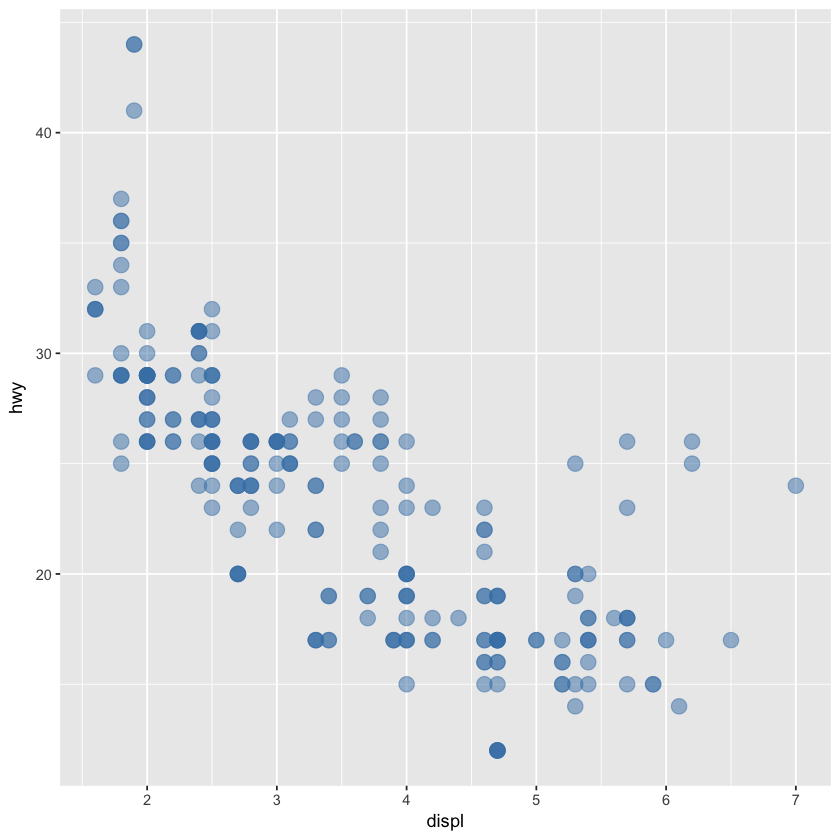

In [89]:
## Modifying aesthetics / alpha is transparency

## Constant variable
g + geom_point(color="steelblue", size=4, alpha=1/2)

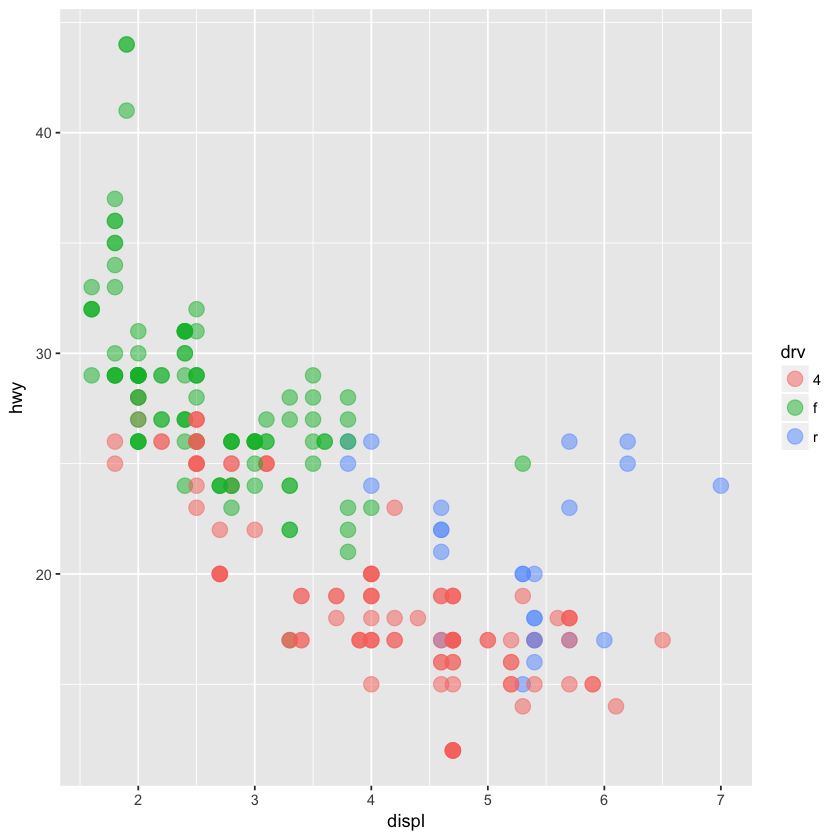

In [90]:
## Data variable --> note it goes into the aes function
g + geom_point(aes(color=drv), size=4, alpha=1/2)

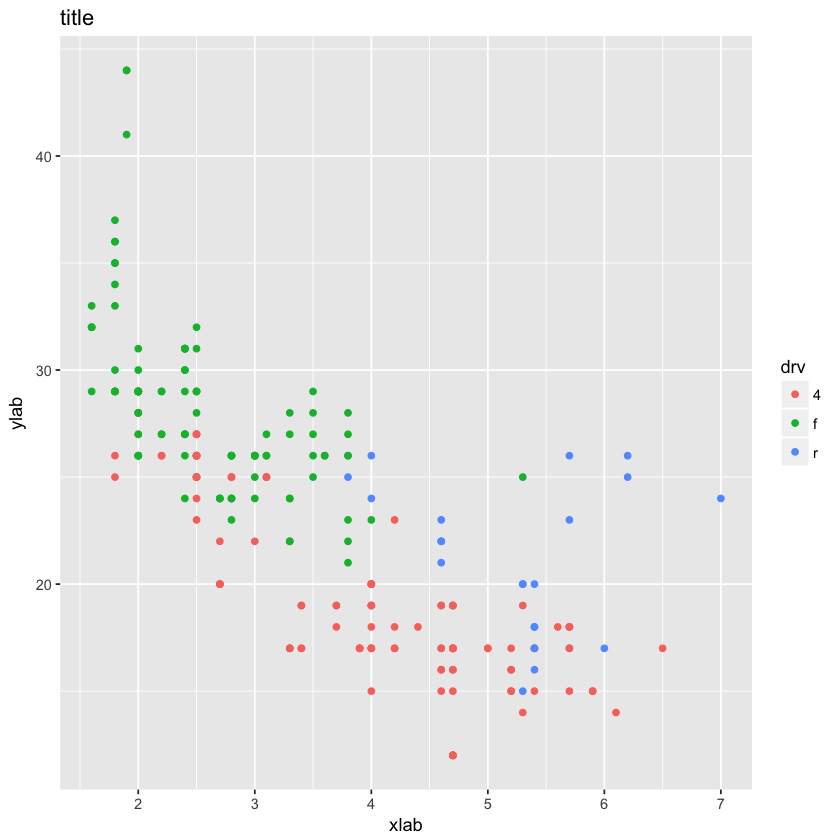

In [92]:
## Using the labs() function to add titles and axis labels
g + geom_point(aes(color=drv)) + labs(title = "title") +  
labs(x = "xlab", y = "ylab")

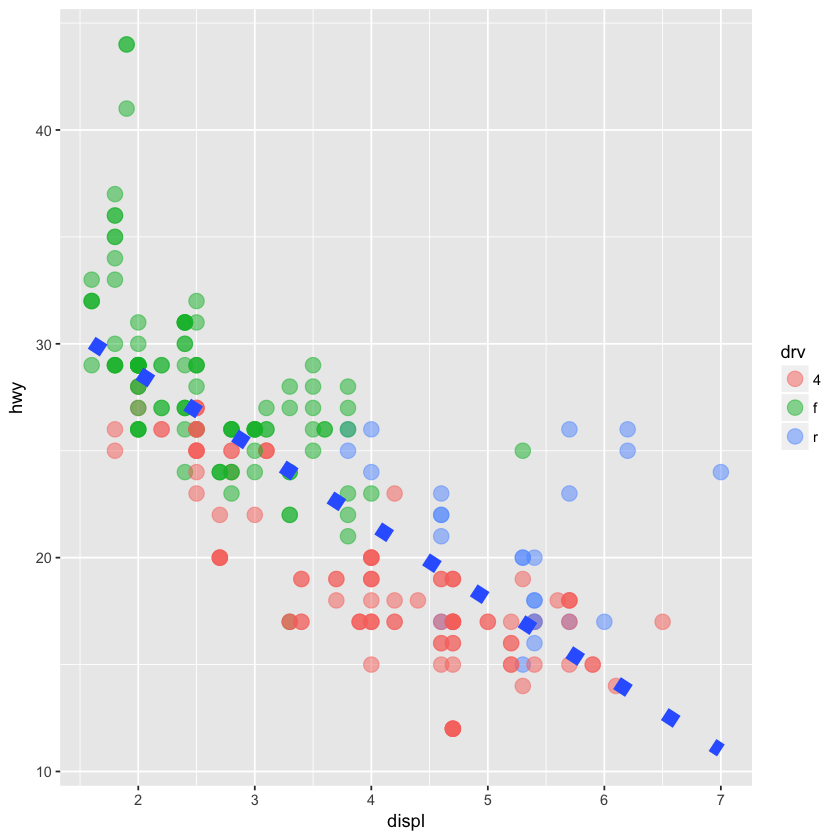

In [93]:
## Also possible to modify a smoother
g + geom_point(aes(color=drv), size=4, alpha=1/2) + 
geom_smooth(size=4, linetype=3, method="lm", se=FALSE)

# se means standard errors shadows = FALSE

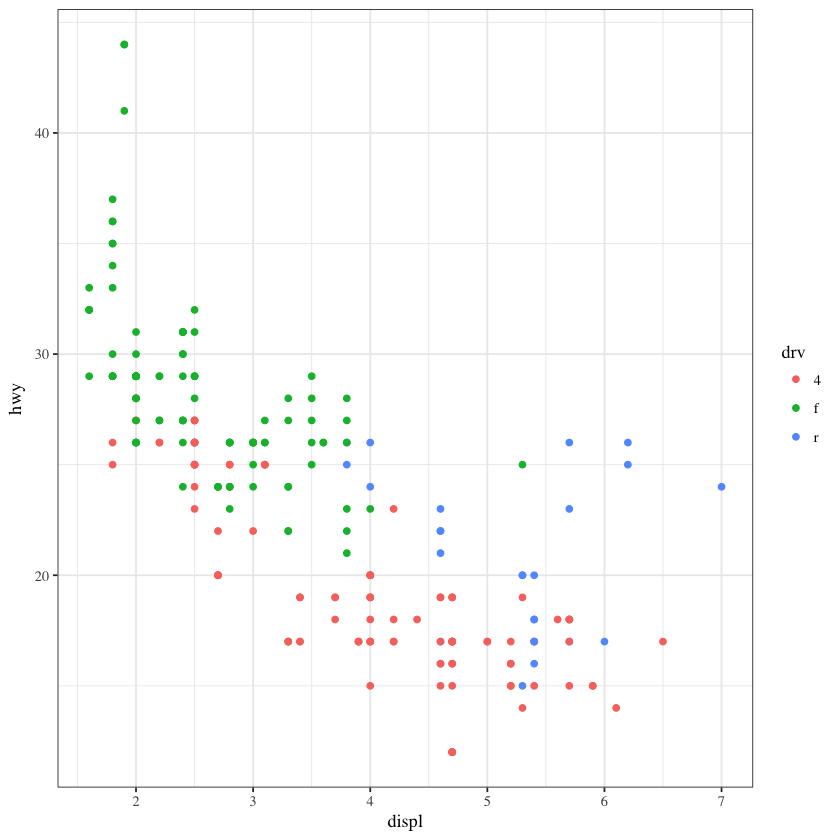

In [95]:
## Changing the theme
g + geom_point(aes(color=drv)) + theme_bw(base_family = "Times")

#### Notes about axis limits

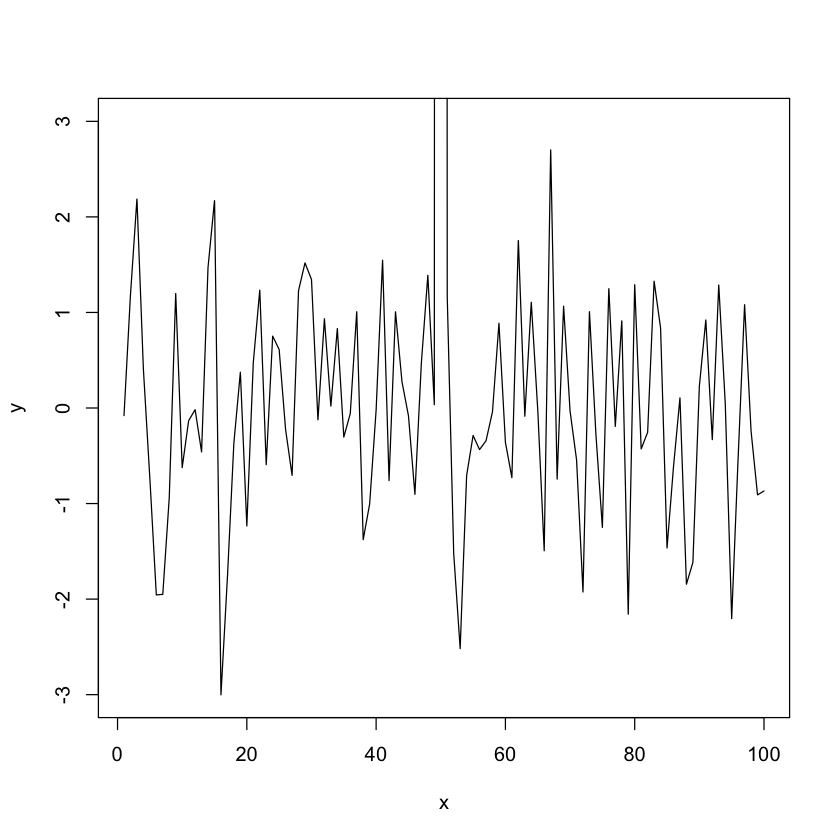

In [77]:
testdat <- data.frame(x=1:100, y = rnorm(100))
testdat[50,2] <- 100 # Added an outlier
with(testdat, plot(x, y, type="l", ylim=c(-3,3)))

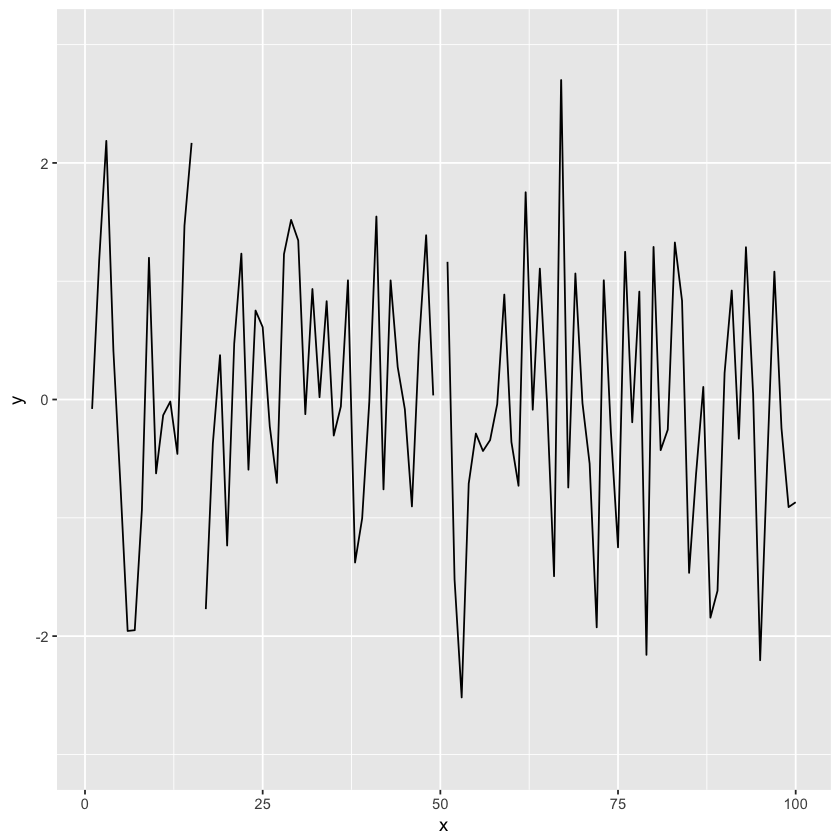

In [78]:
## Outlier missing

g <- ggplot(testdat, aes(x = x, y = y))
g + geom_line() + ylim(-3,3) ## It kills the outlier! 

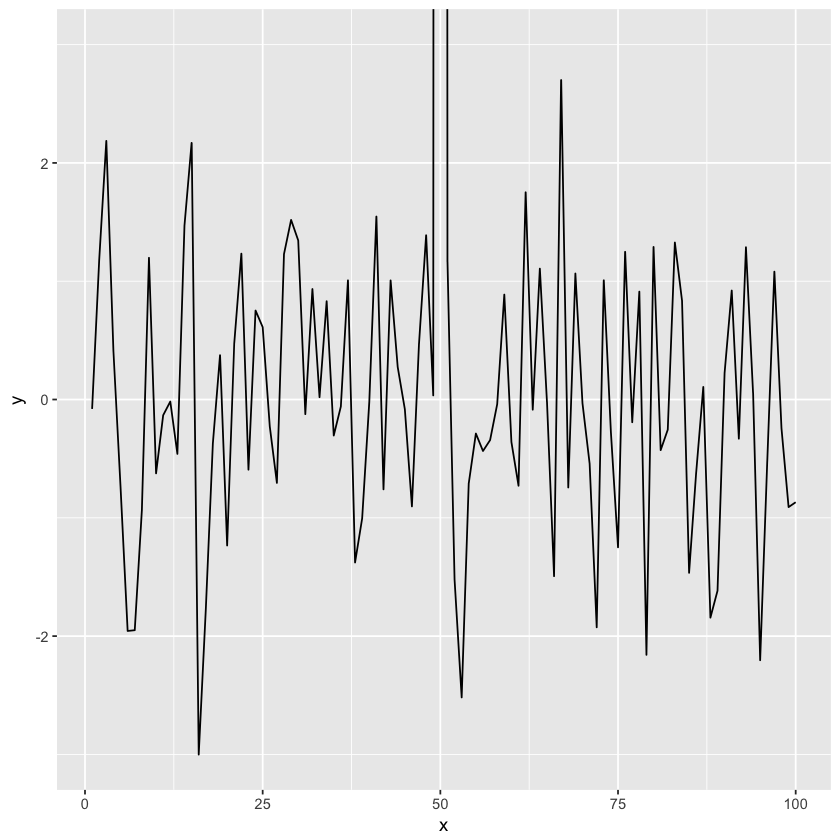

In [82]:
## Outlier included

g <- ggplot(testdat, aes(x = x, y = y))
g + geom_line() + coord_cartesian(ylim = c(-3,3)) 

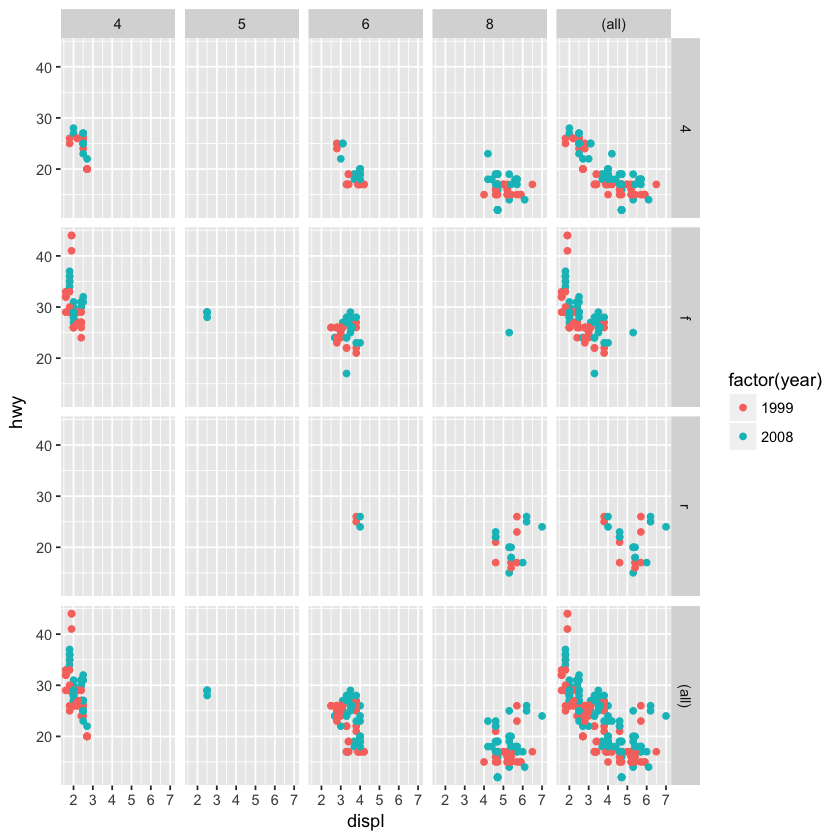

In [96]:
## Another example

g <- ggplot(mpg,aes(x=displ,y=hwy,color=factor(year)))
g + geom_point()+facet_grid(drv~cyl,margins=TRUE)

# The margins argument tells ggplot to display the 
# marginal totals over each row and column

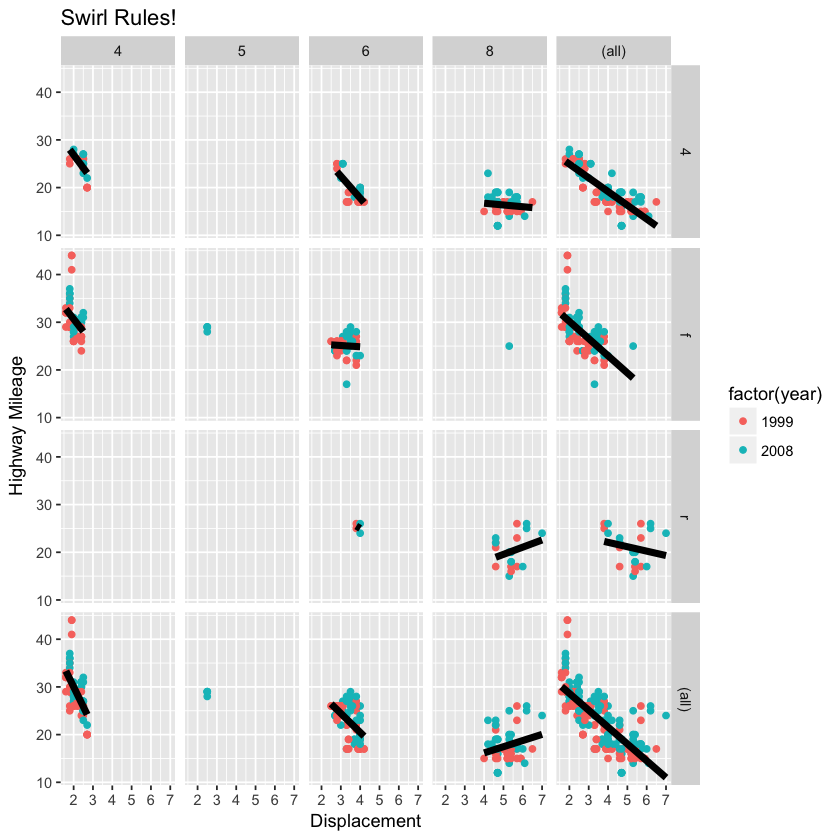

In [97]:
## Adding linear regression lines and labels

g + geom_point()+facet_grid(drv~cyl,margins=TRUE)+
geom_smooth(method="lm",se=FALSE, size=2,color="black")+
labs(x="Displacement",y="Highway Mileage",title="Swirl Rules!")

When making plots, continuos vars need to be categorized, **cut()** can be used
- cut returns a factor variable

In [ ]:
## Calculate deciles of the data
# cutpoints <- quantile(data$var, seq(0,1, length=4),na.rm=TRUE)

## Cut the data at the deciles and create a new factor variable
#data$newvar <- cut(data$var, cutppoints)

## See the levels of the newly created factor variable
# levels(data$newvar)

### Swirl
#### Colors

In [51]:
# Swirl Colors

library(jpeg)
library(RColorBrewer)
library(datasets)

# colorRamp (in RGB)
pal <- colorRamp(c("red","blue"))
pal(0)
pal(0.5)
pal(1)

255,0,0


127.5,0,127.5


0,0,255


In [52]:
pal(seq(0,1,len=6))

255,0,0
204,0,51
153,0,102
102,0,153
51,0,204
0,0,255


In [55]:
# Now using colorRampPalette (in hexadecimal)

p1 <- colorRampPalette(c("red","blue"))
p1(2)
p1(6)

[1] "#FF0000" "#0000FF"

[1] "#FF0000" "#CC0033" "#990066" "#650099" "#3200CC" "#0000FF"

In [58]:
## the fourth argument to rgb() is transparency alpha

# plot(x,y,pch=19,col=rgb(0,.5,.5,.3))

# RColorBrewer provides color palettes for sequential,
# categorical, and diverging data 
# Creating a palette using the RColorBrewer colors, BuGn is one palette
cols <- brewer.pal(3,"BuGn") 
pal <- colorRampPalette(cols)

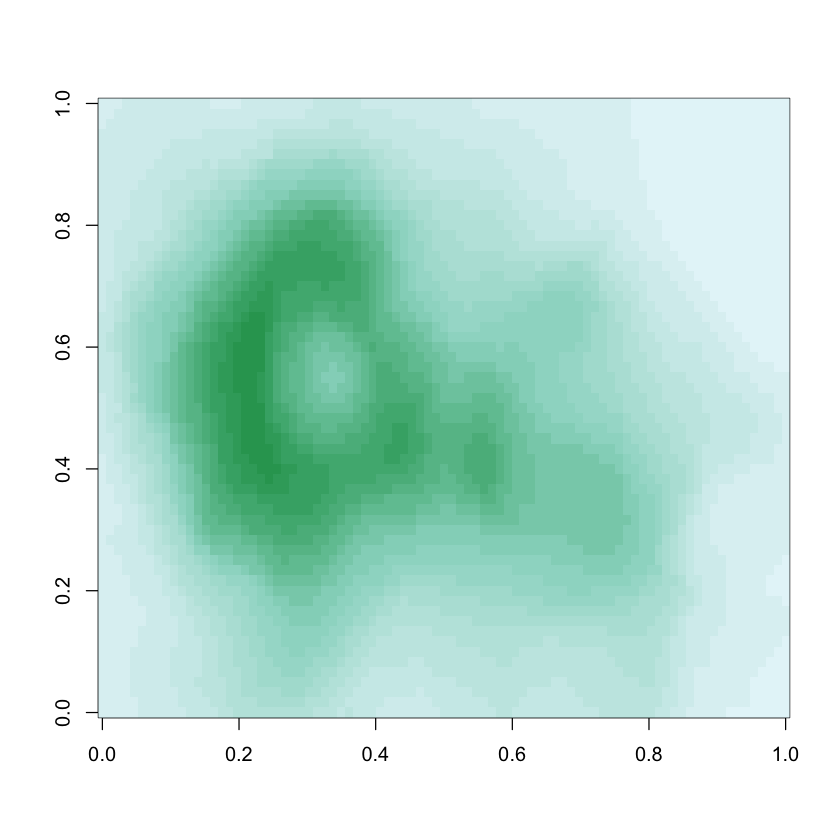

In [59]:
# using the volcano dataset from datasets

image(volcano,col=pal(20))

#### Diamonds example

In [100]:
str(diamondsqplot(price, data=diamonds))

Classes ‘tbl_df’, ‘tbl’ and 'data.frame':	53940 obs. of  10 variables:
 $ carat  : num  0.23 0.21 0.23 0.29 0.31 0.24 0.24 0.26 0.22 0.23 ...
 $ cut    : Ord.factor w/ 5 levels "Fair"<"Good"<..: 5 4 2 4 2 3 3 3 1 3 ...
 $ color  : Ord.factor w/ 7 levels "D"<"E"<"F"<"G"<..: 2 2 2 6 7 7 6 5 2 5 ...
 $ clarity: Ord.factor w/ 8 levels "I1"<"SI2"<"SI1"<..: 2 3 5 4 2 6 7 3 4 5 ...
 $ depth  : num  61.5 59.8 56.9 62.4 63.3 62.8 62.3 61.9 65.1 59.4 ...
 $ table  : num  55 61 65 58 58 57 57 55 61 61 ...
 $ price  : int  326 326 327 334 335 336 336 337 337 338 ...
 $ x      : num  3.95 3.89 4.05 4.2 4.34 3.94 3.95 4.07 3.87 4 ...
 $ y      : num  3.98 3.84 4.07 4.23 4.35 3.96 3.98 4.11 3.78 4.05 ...
 $ z      : num  2.43 2.31 2.31 2.63 2.75 2.48 2.47 2.53 2.49 2.39 ...


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


[1]   326 18823

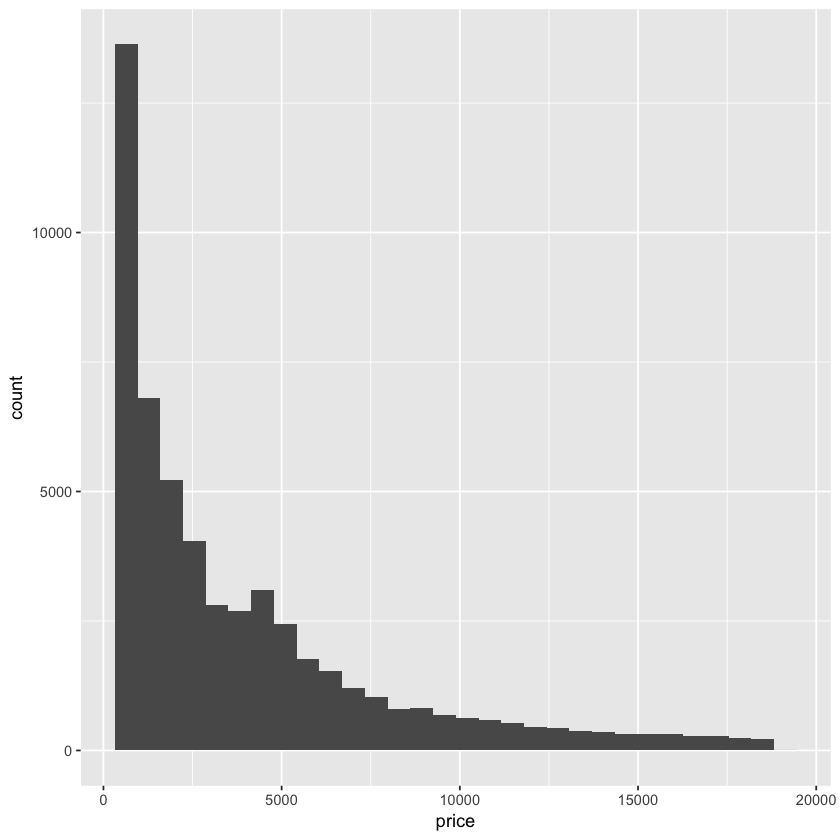

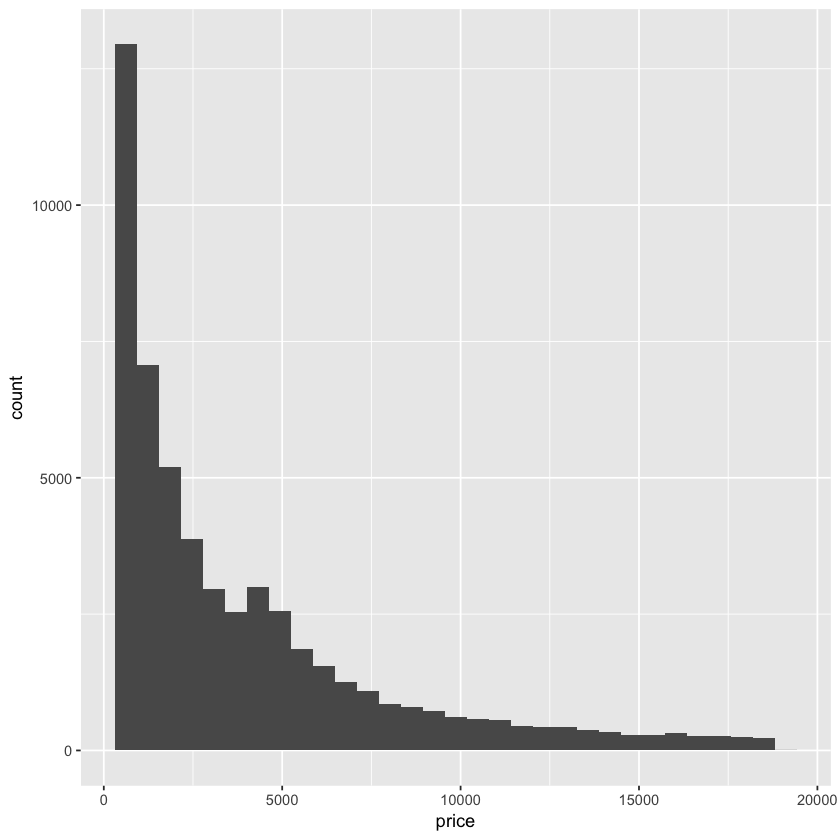

In [103]:
qplot(price, data=diamonds)
range(diamonds$price)
# to delete the error message, do 18823-326 = 18497
# if we use binwidth=18947/30 we won't have it anymore
qplot(price, data=diamonds, binwidth=18497/30)

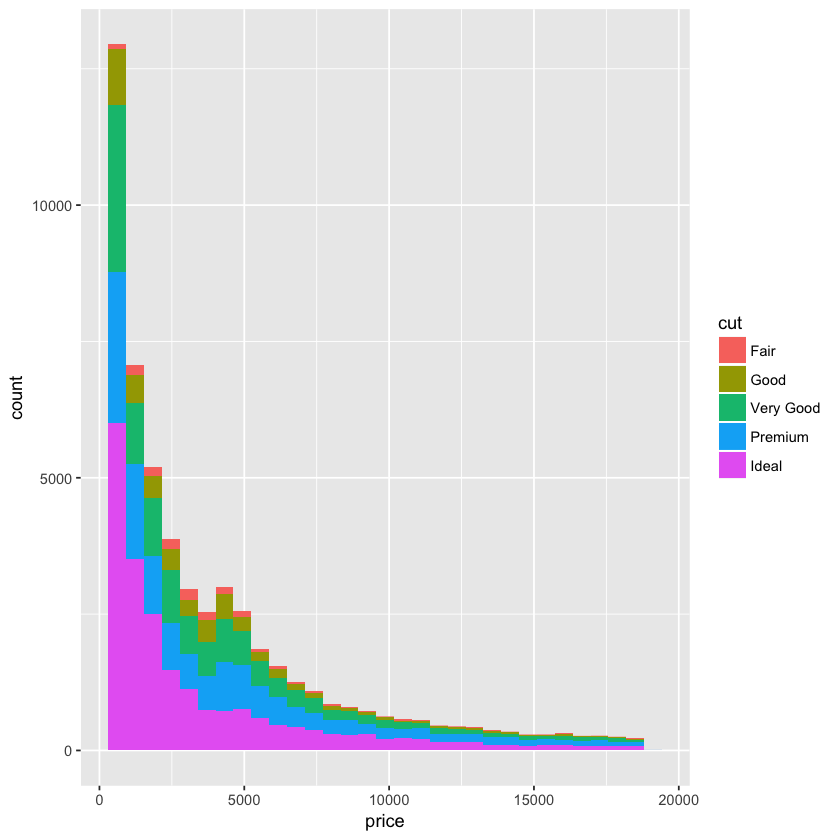

In [105]:
qplot(price, data=diamonds, binwidth=18497/30, fill=cut)

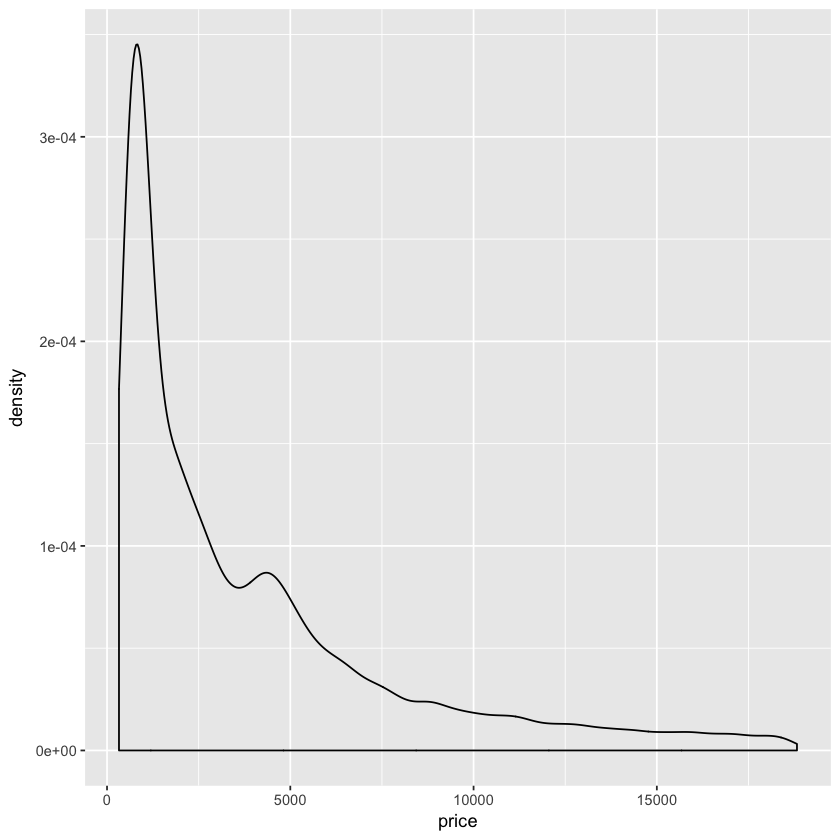

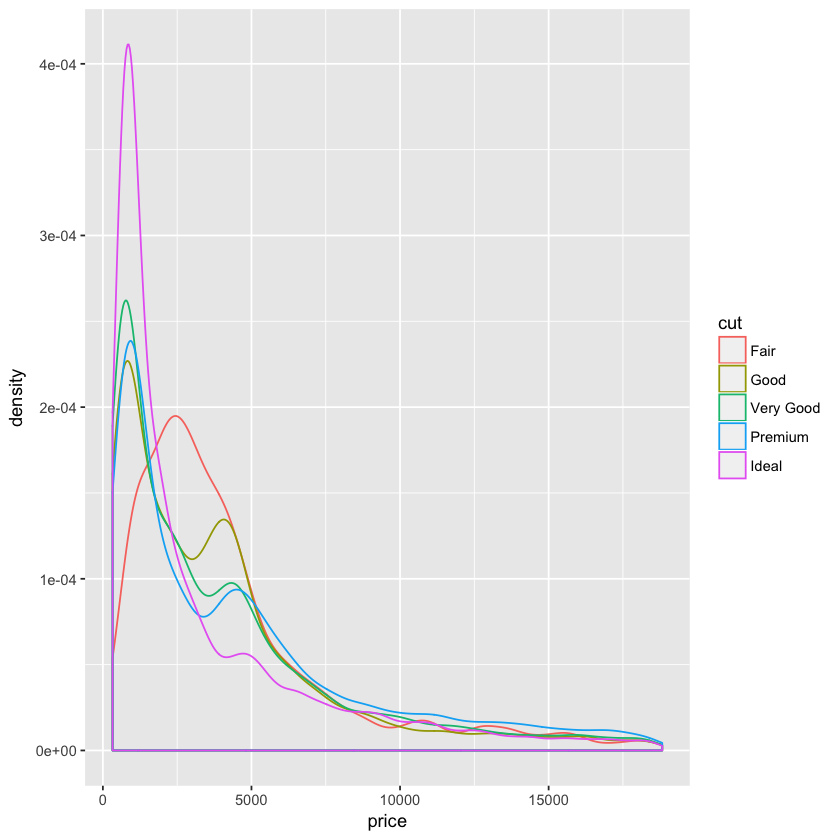

In [106]:
qplot(price, data=diamonds, geom="density")
qplot(price, data=diamonds, geom="density", color=cut)

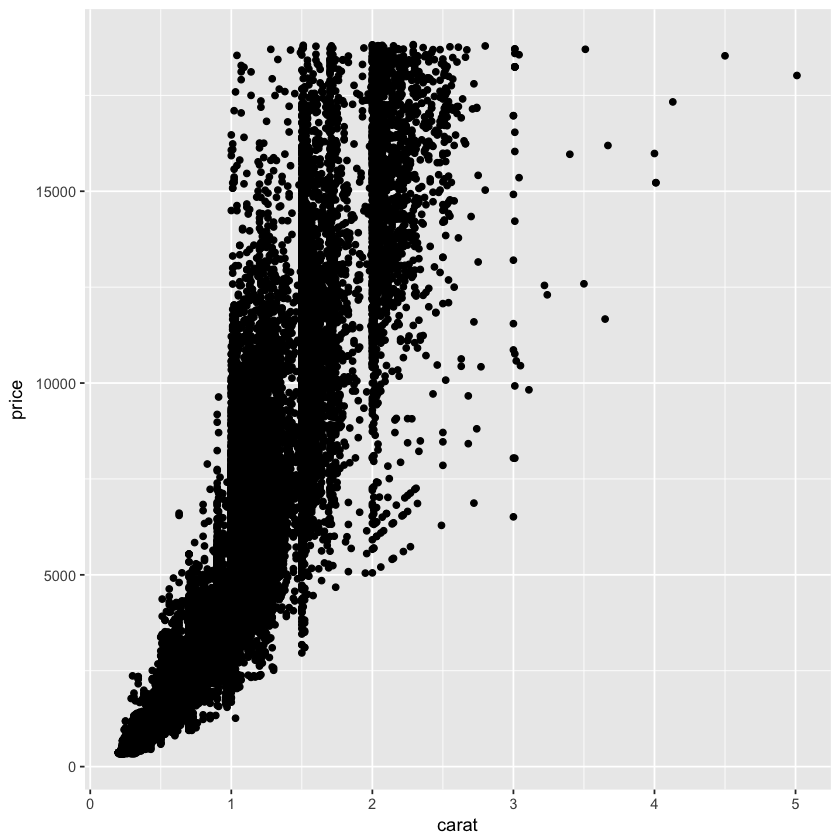

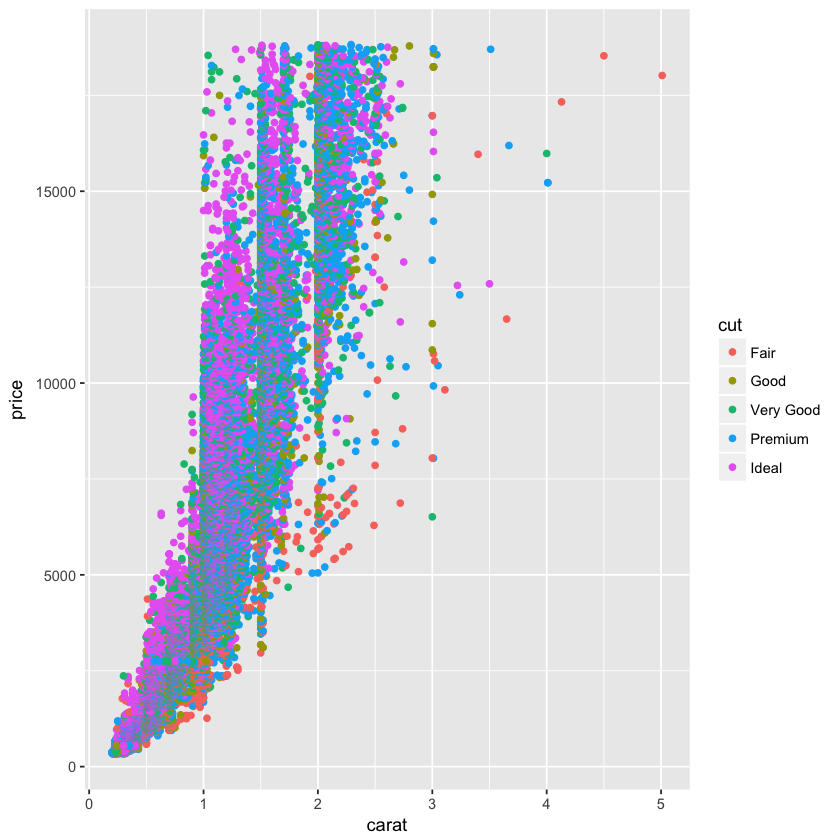

In [108]:
qplot(carat,price, data=diamonds)
qplot(carat,price, data=diamonds, color=cut)

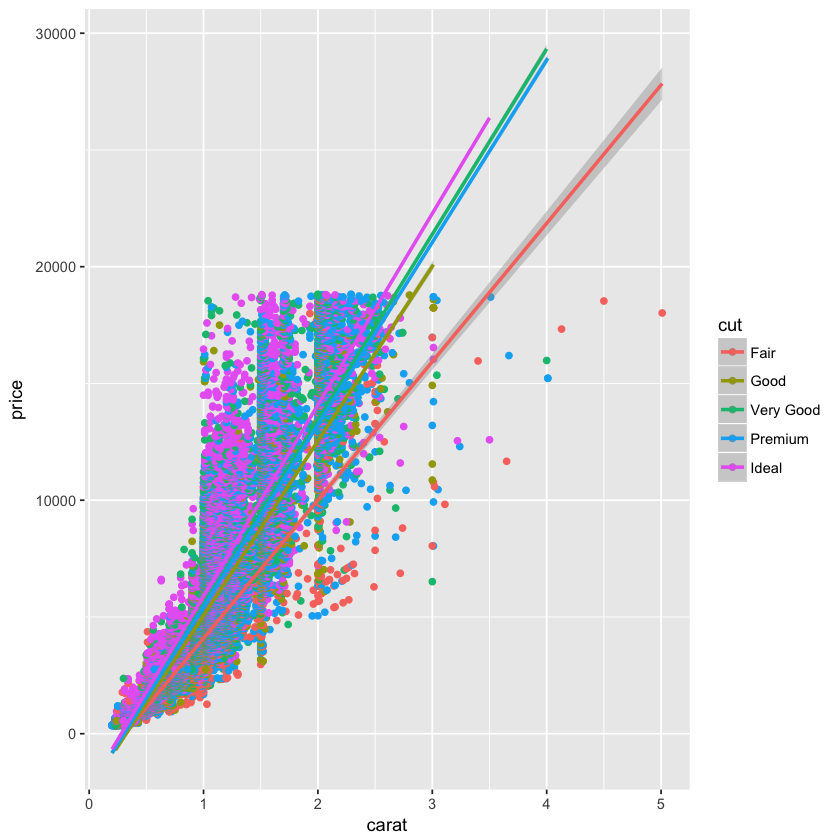

In [109]:
qplot(carat,price,data=diamonds, color=cut) + 
geom_smooth(method="lm")

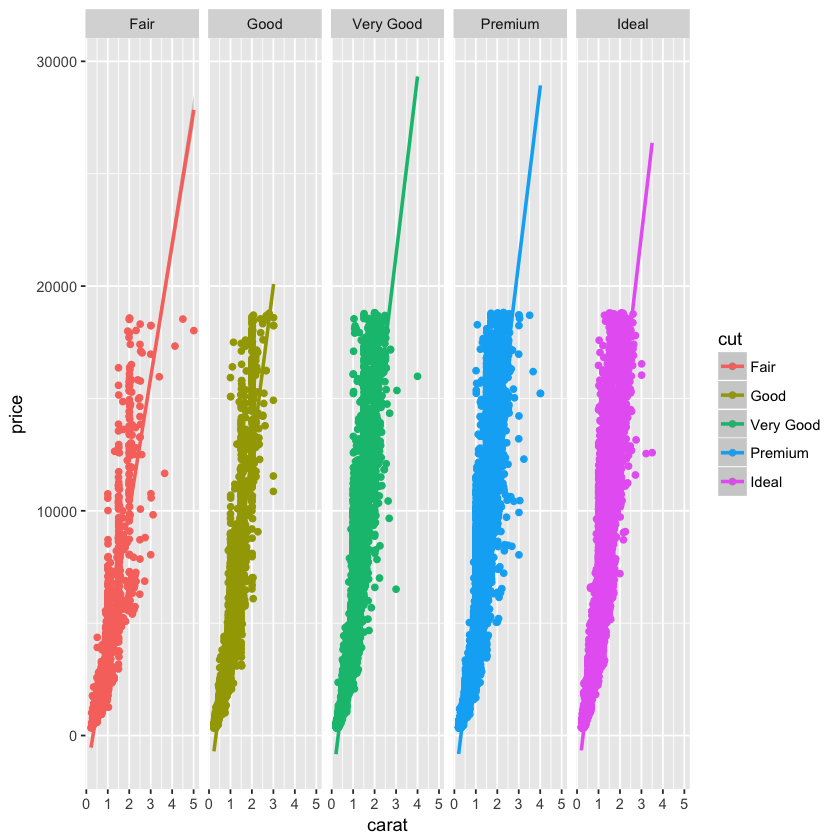

In [110]:
qplot(carat,price,data=diamonds, color=cut, facets=.~cut) + 
geom_smooth(method="lm")

#### Same diamonds dataset, now with ggplot

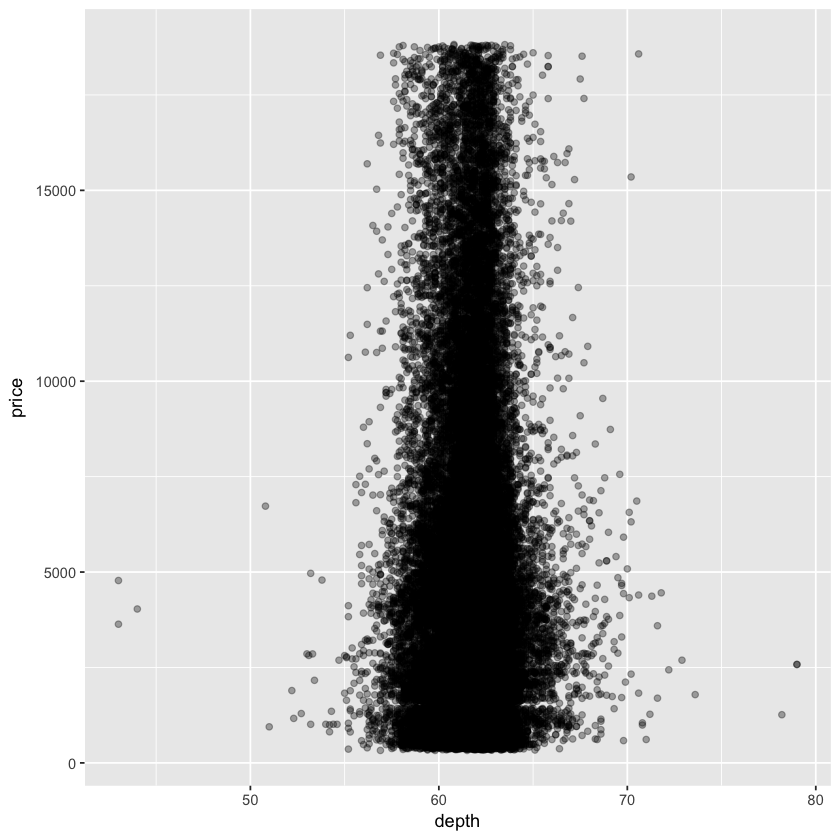

In [111]:
g <- ggplot(diamonds, aes(depth, price))
g + geom_point(alpha=1/3)

In [112]:
cutpoints <- quantile(diamonds$carat, seq(0,1,length=4), 
                      na.rm=TRUE)
cutpoints

0% 33.33333% 66.66667%      100% 
     0.20      0.50      1.00      5.01

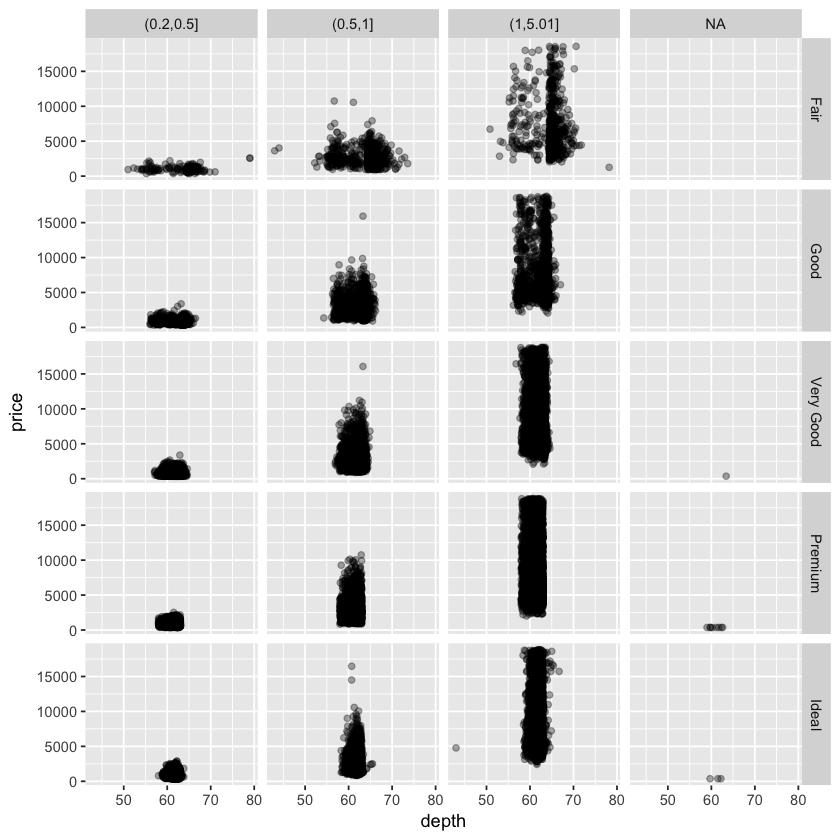

In [113]:
# we create a new variable that will cut according to cutpoints

diamonds$car2 <- cut(diamonds$carat, cutpoints)

# as we change the dataset, we need to make g again

g <- ggplot(diamonds, aes(depth, price))
g + geom_point(alpha=1/3) + facet_grid(cut~car2)


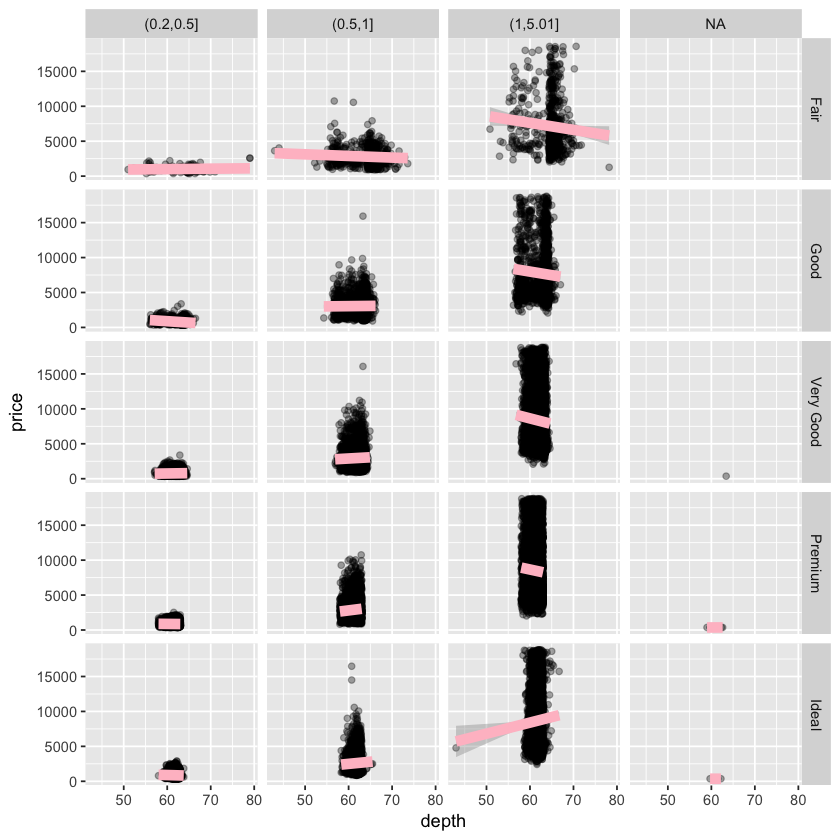

In [114]:
g + geom_point(alpha=1/3) + facet_grid(cut~car2)+
geom_smooth(method="lm", size=3, color="pink")

Warning message:
“Continuous x aesthetic -- did you forget aes(group=...)?”

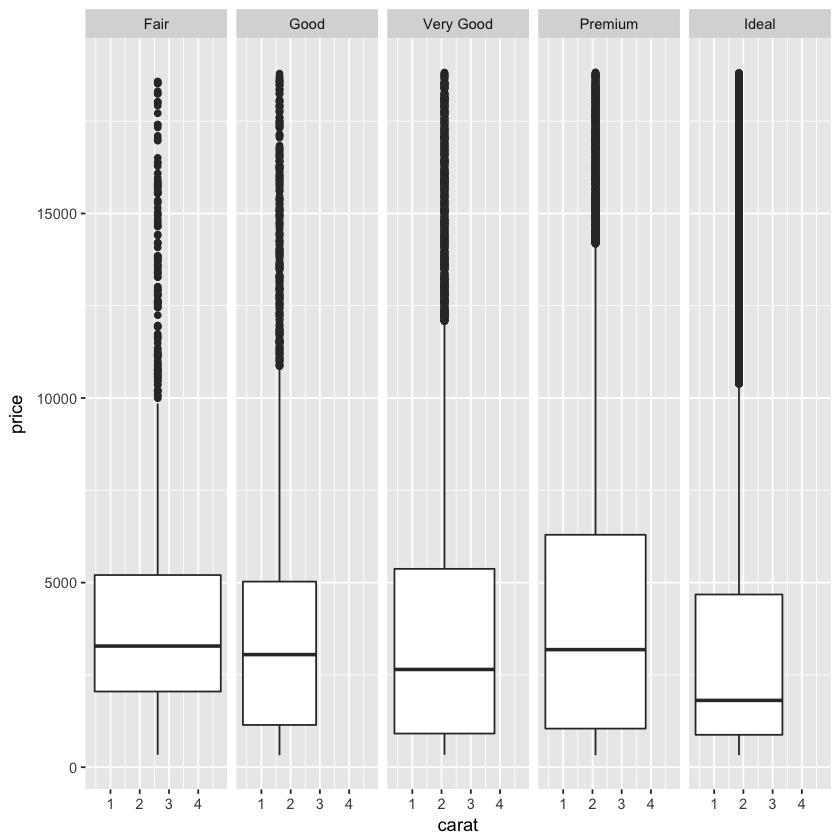

In [115]:
ggplot(diamonds,aes(carat,price))+geom_boxplot()+facet_grid(.~cut)

### Quiz 2
#### Question 2

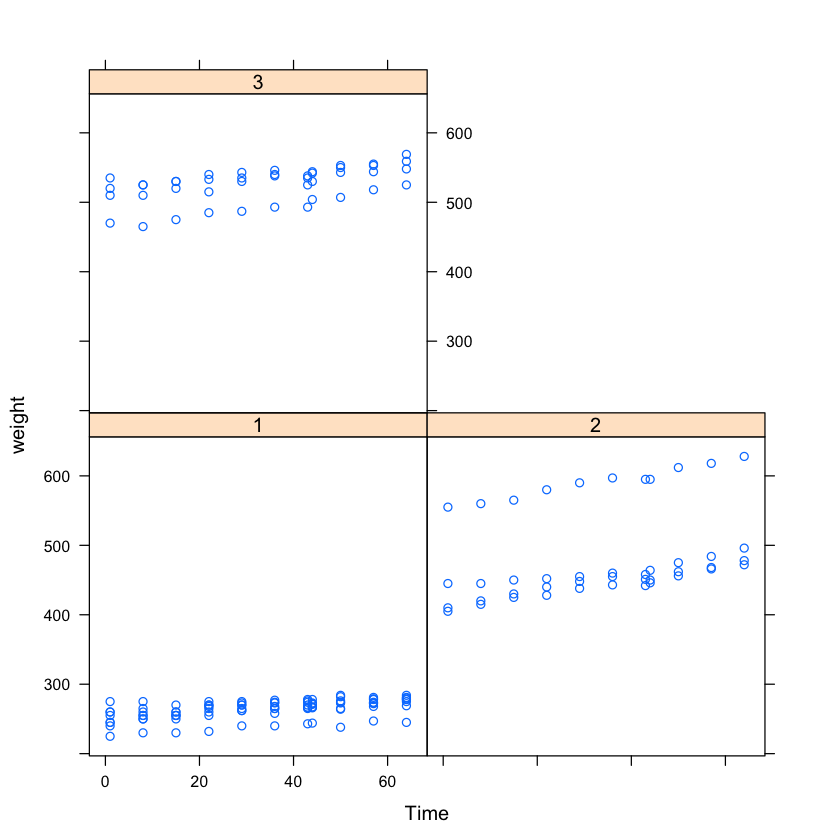

In [68]:
library(nlme)
library(lattice)
xyplot(weight ~ Time | Diet, BodyWeight)

In [69]:
str(BodyWeight)

Classes ‘nfnGroupedData’, ‘nfGroupedData’, ‘groupedData’ and 'data.frame':	176 obs. of  4 variables:
 $ weight: num  240 250 255 260 262 258 266 266 265 272 ...
 $ Time  : num  1 8 15 22 29 36 43 44 50 57 ...
 $ Rat   : Ord.factor w/ 16 levels "2"<"3"<"4"<"1"<..: 4 4 4 4 4 4 4 4 4 4 ...
 $ Diet  : Factor w/ 3 levels "1","2","3": 1 1 1 1 1 1 1 1 1 1 ...
 - attr(*, "outer")=Class 'formula'  language ~Diet
  .. ..- attr(*, ".Environment")=<environment: R_GlobalEnv> 
 - attr(*, "formula")=Class 'formula'  language weight ~ Time | Rat
  .. ..- attr(*, ".Environment")=<environment: R_GlobalEnv> 
 - attr(*, "labels")=List of 2
  ..$ x: chr "Time"
  ..$ y: chr "Body weight"
 - attr(*, "units")=List of 2
  ..$ x: chr "(days)"
  ..$ y: chr "(g)"
 - attr(*, "FUN")=function (x)  
  ..- attr(*, "source")= chr "function(x) max(x, na.rm = TRUE)"
 - attr(*, "order.groups")= logi TRUE


#### Question 7

Warning message:
“Removed 37 rows containing missing values (geom_point).”

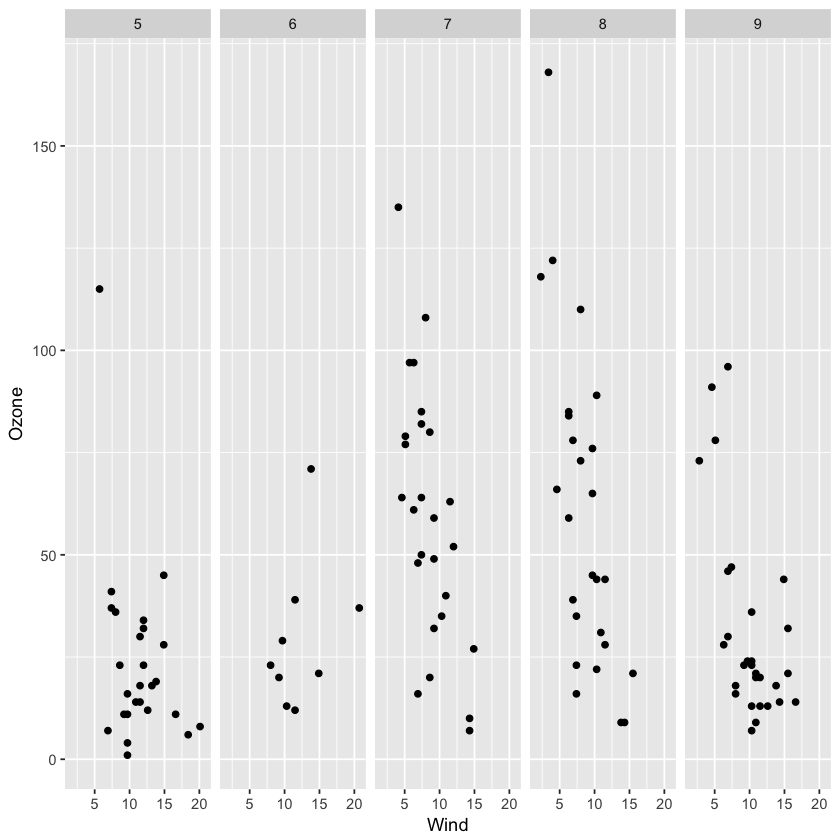

In [70]:
library(datasets)
data(airquality)
qplot(Wind, Ozone, data = airquality, facets = . ~ factor(Month))

Warning message:
“Removed 37 rows containing missing values (geom_point).”

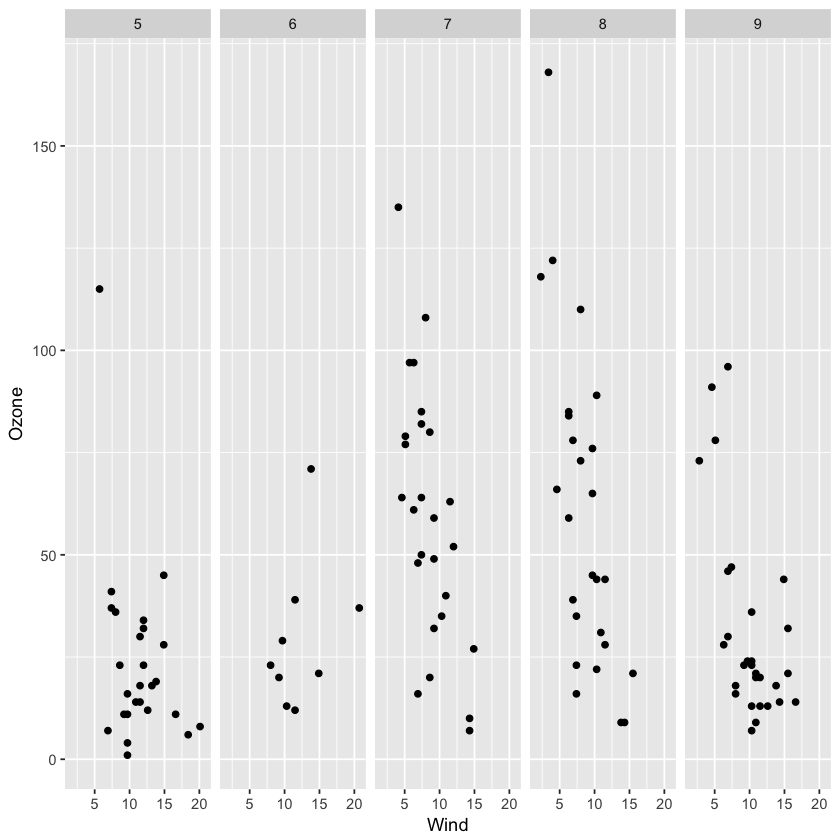

In [71]:
airquality = transform(airquality, Month = factor(Month))
qplot(Wind, Ozone, data = airquality, facets = . ~ Month)

## Week 3

### Lesson 1: Hierarchical Clustering

### 3.1.1 Hierarchical Clustering

#### Can we find things that are close together?
Clustering organizes things that are **close** into groups
- How do we define close?
- How do we define things?
- How do we visualize the grouping?
- How do we interpret the grouping?

An agglomerative approach
- Find closest two things
- Pull them together
- Find next closest

Requires
- A defined distance
- A merging approach

Produces
- A tree showing how close things are to each other

#### How do we define close?
- Most important step
    - Garbage in -> garbage out
- Distance or similarity
    - Continuous - euclidean distance (straight line)
    - Continuous - correlation similarity
    - Binary - manhattan distance (like in a grid, get from
    A to B in a city block, following streets)
- Pick a distance/similarity that makes sense for your problem


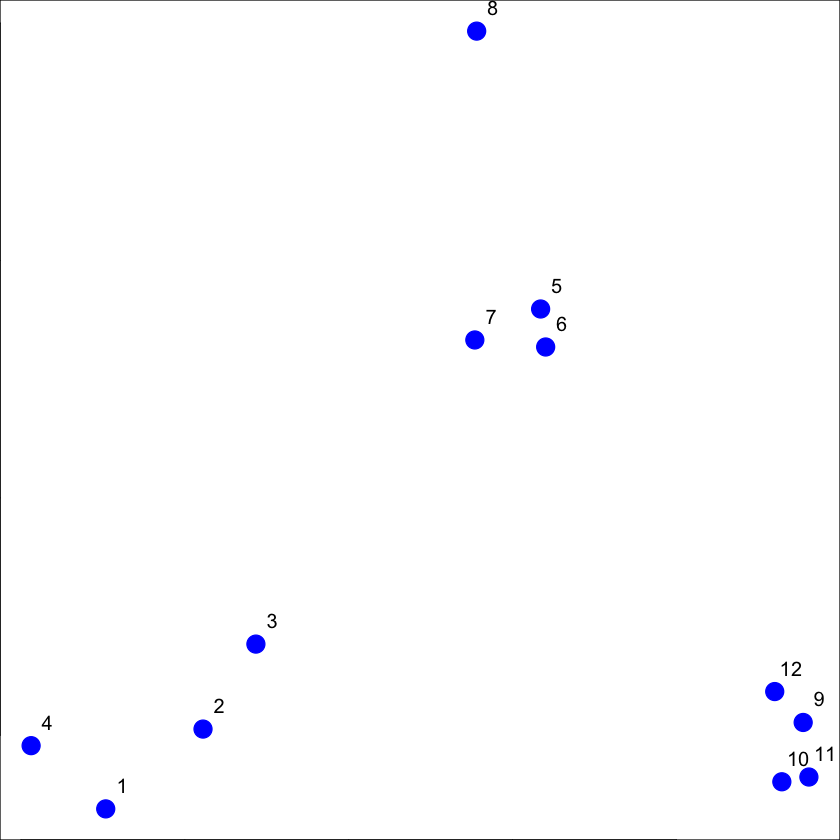

In [119]:
# First example to see how to cluster the points together

set.seed(1234)
par(mar=c(0,0,0,0))
x <- rnorm(12, mean = rep(1:3, each = 4), sd = 0.2)
y <- rnorm(12, mean = rep(c(1,2,1), each = 4), sd = 0.2)
plot(x,y,col="blue", pch=19, cex=2)
text(x + 0.05, y + 0.05, labels = as.character(1:12))

In [120]:
# First, we need to calculate the distance between the points
# dist takes matrix or dataframe
# important parameters: x, method

dataFrame <- data.frame(x=x, y=y)
dist(dataFrame)  # gives distance matrix, defaults euclidean

            1          2          3          4          5          6          7
2  0.34120511                                                                  
3  0.57493739 0.24102750                                                       
4  0.26381786 0.52578819 0.71861759                                            
5  1.69424700 1.35818182 1.11952883 1.80666768                                 
6  1.65812902 1.31960442 1.08338841 1.78081321 0.08150268                      
7  1.49823399 1.16620981 0.92568723 1.60131659 0.21110433 0.21666557           
8  1.99149025 1.69093111 1.45648906 2.02849490 0.61704200 0.69791931 0.65062566
9  2.13629539 1.83167669 1.67835968 2.35675598 1.18349654 1.11500116 1.28582631
10 2.06419586 1.76999236 1.63109790 2.29239480 1.23847877 1.16550201 1.32063059
11 2.14702468 1.85183204 1.71074417 2.37461984 1.28153948 1.21077373 1.37369662
12 2.05664233 1.74662555 1.58658782 2.27232243 1.07700974 1.00777231 1.17740375
            8          9         10     

#### Hierarchical clustering - hclust

- Take two points that are closer to each other: **5 & 6**
- Group together and merge into a single cluster
- Then take **10 & 11** and group it
- Keep going, then we can get a **dendrogram** showing how it clusters together
- The further down it is, the closer to each other they were (clustered first), up are clustered later
- Decision to cut the tree to decide how many clusters we have, how many branches do we cut out with an horizontal line?


Call:
hclust(d = distxy)

Cluster method   : complete 
Distance         : euclidean 
Number of objects: 12 


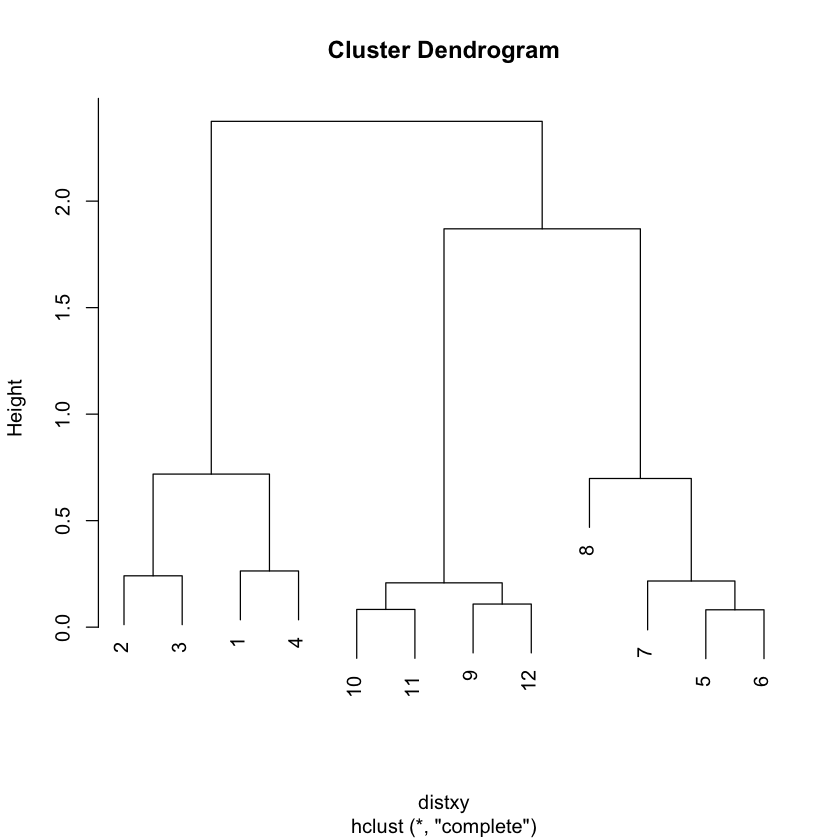

In [137]:
dataFrame <- data.frame(x=x, y=y)
distxy <- dist(dataFrame)
hClustering <- hclust(distxy)
plot(hClustering)
# shows the cluster method "complete avg" and distance "euclidean"
hClustering 

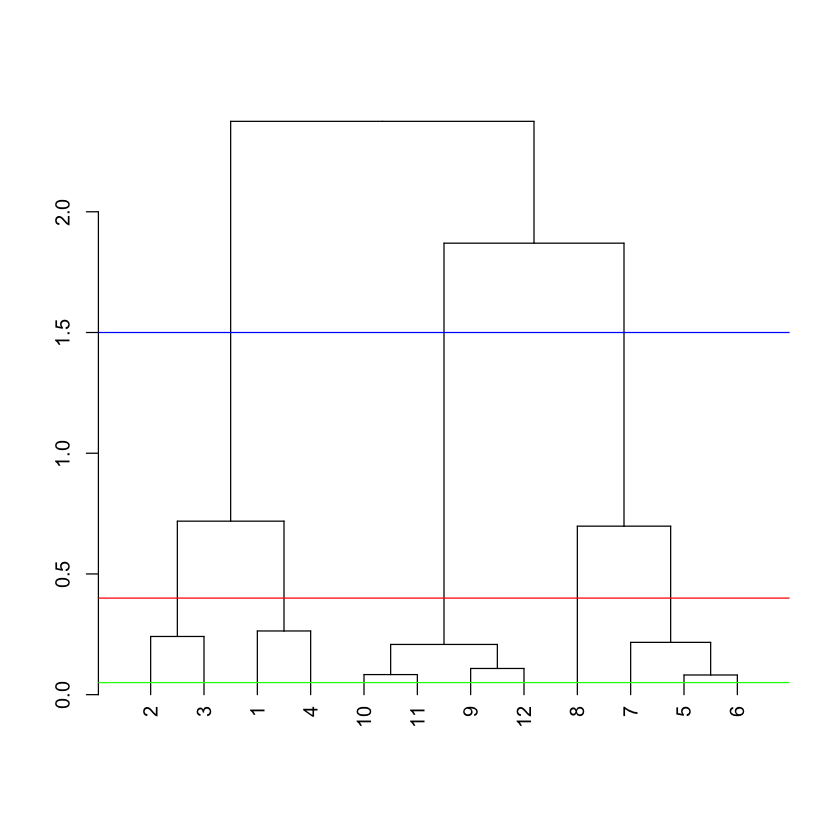

In [136]:
# Plotting as dendrogram plots on the same level
# Distance is shown by height of lines

plot(as.dendrogram(hClustering))
abline(h=1.5, col="blue")
abline(h=0.4, col="red")
abline(h=0.05, col = "green")

# The number of clusters of the data depends on where you
# draw the line, or the cut.

#### Prettier dendrograms

In [123]:
# A prettier dendrogram, copied from the class

myplclust <- function( hclust, lab=hclust$labels, 
                      lab.col=rep(1,length(hclust$labels)), 
                      hang=0.1,...)
{
 ## modifiction of plclust for plotting hclust objects *in colour*!
 ## Copyright Eva KF Chan 2009
 ## Arguments:
 ##    hclust:    hclust object
 ##    lab:        a character vector of labels of the leaves of the tree
 ##    lab.col:    colour for the labels; NA=default device foreground colour
 ##    hang:     as in hclust & plclust
 ## Side effect:
 ##    A display of hierarchical cluster with coloured leaf labels.
 y <- rep(hclust$height,2)
 x <- as.numeric(hclust$merge)
 y <- y[which(x<0)]
 x <- x[which(x<0)]
 x <- abs(x)
 y <- y[order(x)]
 x <- x[order(x)]
 plot( hclust, labels=FALSE, hang=hang, ... )
 text( x=x, y=y[hclust$order]-(max(hclust$height)*hang), 
      labels=lab[hclust$order], col=lab.col[hclust$order], 
      srt=90, adj=c(1,0.5), xpd=NA, ... )
}

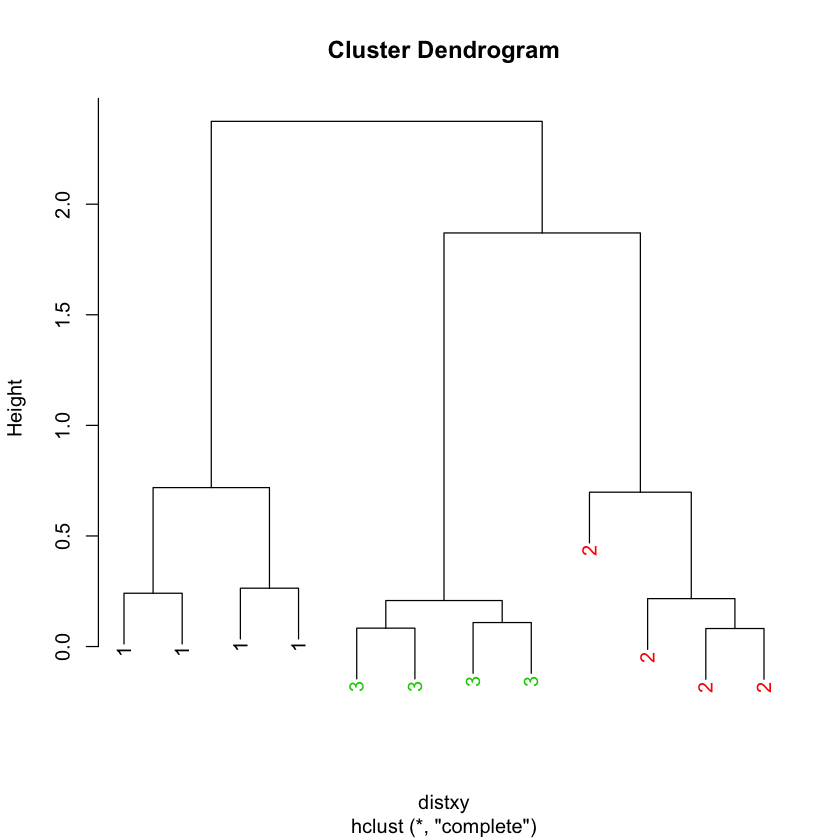

In [130]:
myplclust(hClustering, lab = rep(1:3, each=4), 
          lab.col=rep(1:3, each=4))

#### Merging points - complete

When merging points together, what defines their new location?
- **Average linkage**: you compute an "average" point in each cluster (think of it as the cluster's center of gravity). You do this by computing the mean (average) x and y coordinates of the points in the cluster.
- **Complete linkage**: take distance between the two farthest points between two clusters. (e.g. taking three clusters, we would measure distance between 4 and 8, between 4 and 11, and distance between 8 and 11)

The two merging approaches can give very different results.

#### heatmap( )
Great function to visualize matrix data
For extremely large table or matrix numbers, to look quickly in an organized way.
Runs a hierarchical cluster analysis in the rows and columns of the table. 

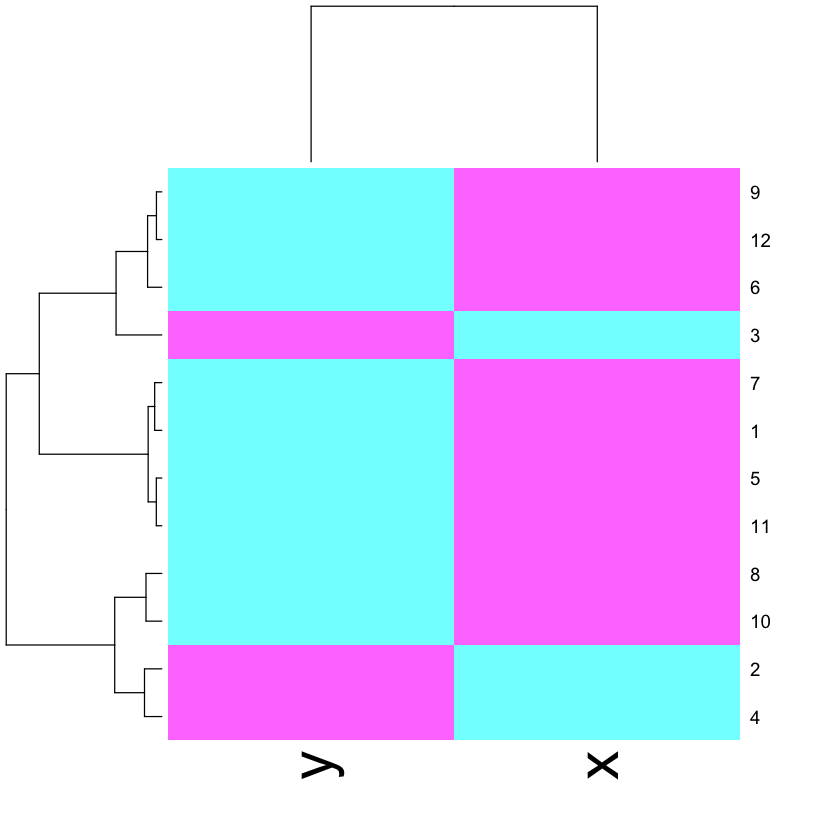

In [140]:
dataFrame <- data.frame(x=x, y=y)
set.seed(143)
dataMatrix <- as.matrix(dataFrame)[sample(1:12),]
heatmap(dataMatrix, col = cm.colors(25))

- Gives an idea of the relationships between variables/observations
- The picture may be unstable
    - Change a few points
    - Have different missing values
    - Pick a difference distance
    - Change the merging strategy
    - Change the scale of points for one variable
- But it is deterministic
- Choosing where to cut isn't always obvious
- Should be primarily used for exploration
- "Rafa's distances and clustering video" -> https://www.youtube.com/watch?v=PArRvqLUP6o
- "Elements of statistical learning" 
- Great heatmap tutorial -> http://sebastianraschka.com/Articles/heatmaps_in_r.html#clustering.

### Lesson 2. K-Means Clustering & Dimension Reduction

#### 3.2.1 K-Means Clustering

Useful for summarizing high-dimensional data, getting a sense of what patterns data show. 

#### Can we find things that are close together?
- How do we define close?
- How do we define things?
- How do we visualize the grouping?
- How do we interpret the grouping?

#### How do we define close?
- Most important step
    - Garbage in -> garbage out
- Distance or similarity
    - Continuous - euclidean distance (straight line)
    - Continuous - correlation similarity
    - Binary - manhattan distance (like in a grid, get from
    A to B in a city block, following streets)
- Pick a distance/similarity that makes sense for your problem

#### K-means clustering

The k-means method "aims to partition the points into k groups such that the sum of squares from points to the assigned cluster  centres is minimized."

A partitioning approach
- Fix a number of clusters
- Get "centroids" of each cluster (center of gravity)
- Assign things to closest centroid
- Recalculate centroids

Requires
- A defined distance metric
- A number of clusters
- An initial guess as to cluster centroids

Produces
- Final estimate of cluster centroids
- An assignment of each point to clusters

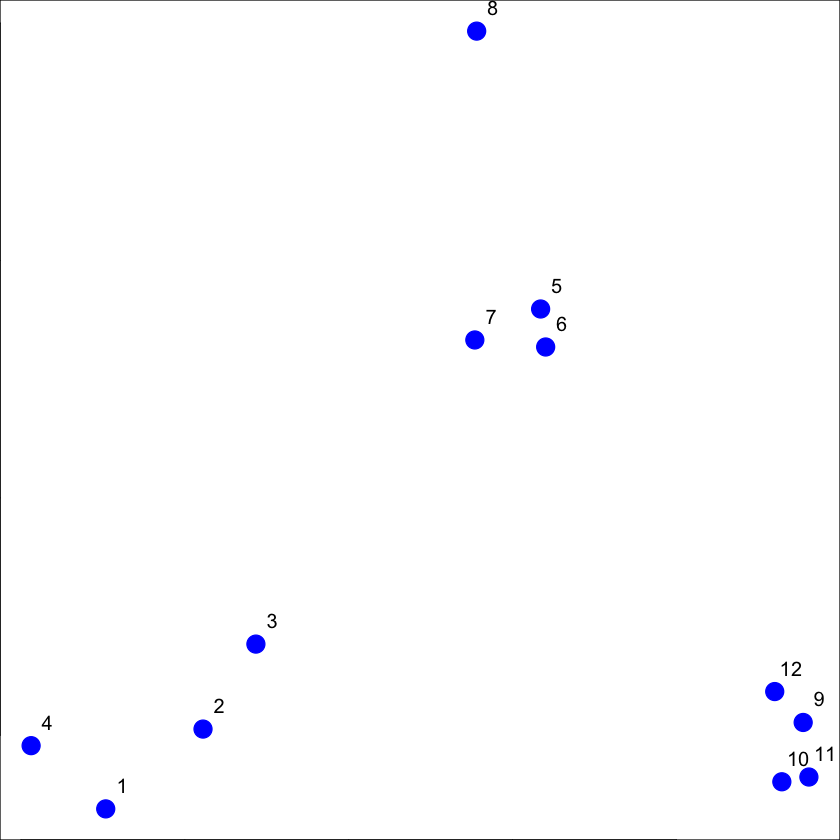

In [142]:
# K-means clustering example

set.seed(1234)
par(mar=c(0,0,0,0))
x <- rnorm(12, mean = rep(1:3, each = 4), sd = 0.2)
y <- rnorm(12, mean = rep(c(1,2,1), each = 4), sd = 0.2)
plot(x,y,col="blue", pch=19, cex=2)
text(x + 0.05, y + 0.05, labels = as.character(1:12))

#### Centroid approach
- Choose first three random starting points
- Points are assigned to closest centroid (initial grouping)
- Then recalculate the centroids (mean of cluster)
- Repeat process, which centroid is closest to you now?
- Assign to closest centroid, recalculate centroid, etc...
- Repeat until centroids don't move anymore

#### kmeans( ) 
- Important parameters: x, centers, iter.max, nstart

In [167]:
dataFrame <- data.frame(x,y)
kmeansObj <- kmeans(dataFrame, centers = 3)
names(kmeansObj)

[1] "cluster"      "centers"      "totss"        "withinss"     "tot.withinss"
[6] "betweenss"    "size"         "iter"         "ifault"

In [168]:
kmeansObj$cluster
kmeansObj$centers

[1] 1 1 1 1 3 3 3 3 2 2 2 2

,x,y
1,0.8904553,1.0068707
2,2.8534966,0.9831222
3,1.9906904,2.0078229


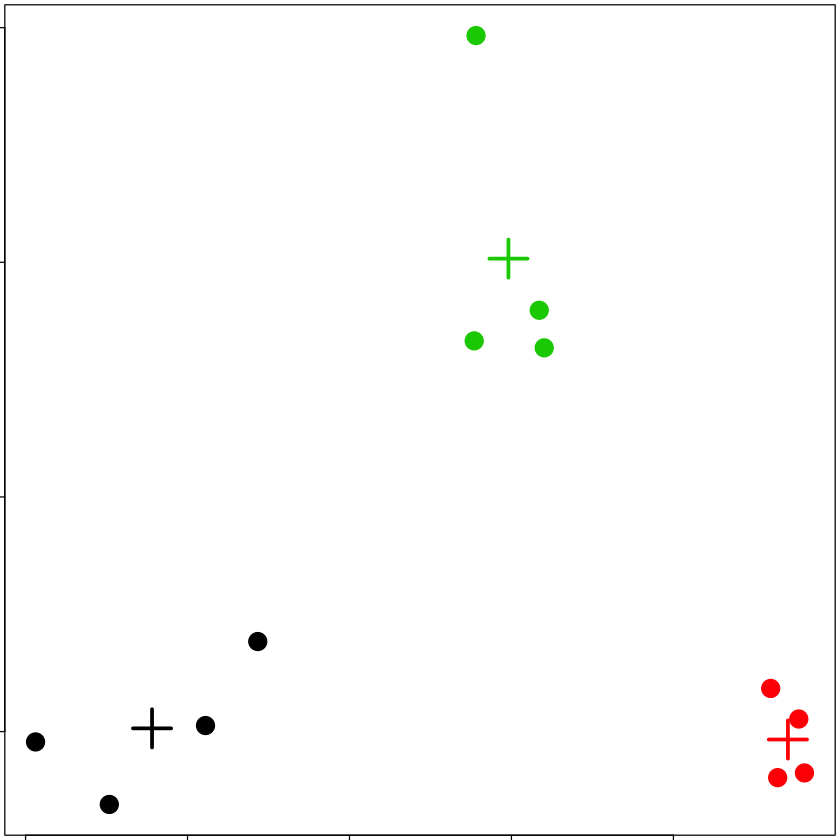

In [169]:
par(mar=rep(0.2,4))
plot(x,y,col=kmeansObj$cluster,pch=19, cex=2)
points(kmeansObj$centers, col=1:3, pch=3, cex=3, lwd=3)

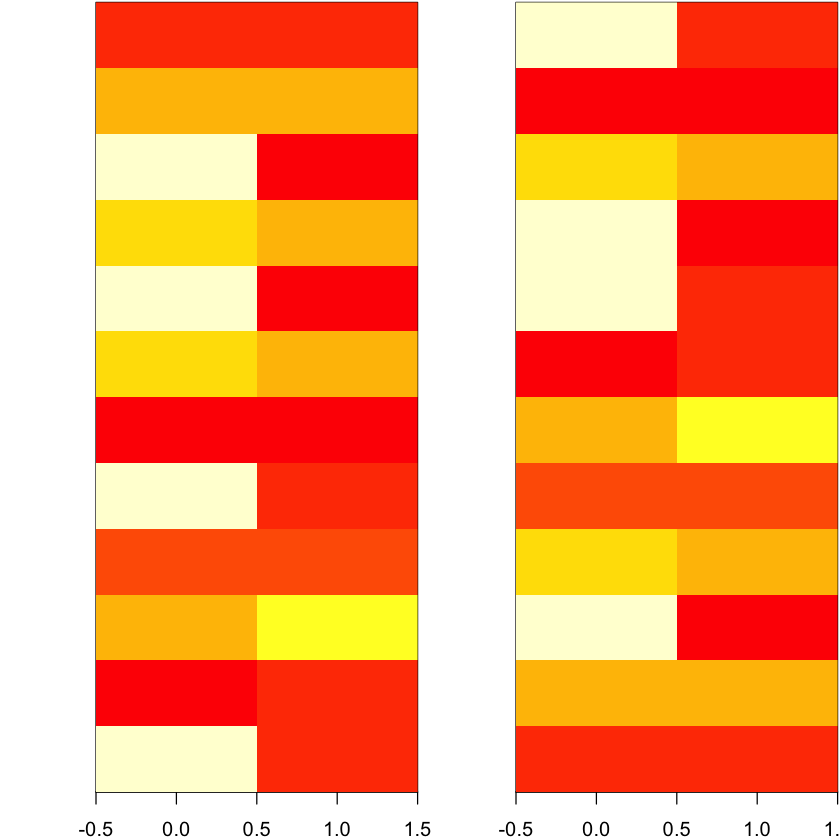

In [175]:
set.seed(1234)
dataMatrix <- as.matrix(dataFrame)[sample(1:12),]
kmeansObj2 <- kmeans(dataMatrix, centers=3)
par(mfrow=c(1,2), mar=c(2,4,0.1,0.1))

# image of the original data
image(t(dataMatrix)[, nrow(dataMatrix):1], yaxt="n")

# reorder the rows of the dataframe so that the clusters are
# put together
image(t(dataMatrix)[, order(kmeansObj$cluster)], yaxt="n")

#### Summary

K-means requires a number of clusters
- pick by eye/intuition
- pick by cross validation/information theory, etc.
- determining the number of clusters

K-means is not deterministic
- different number of clusters
- different number of iterations

#### 3.2.2 Dimension Reduction


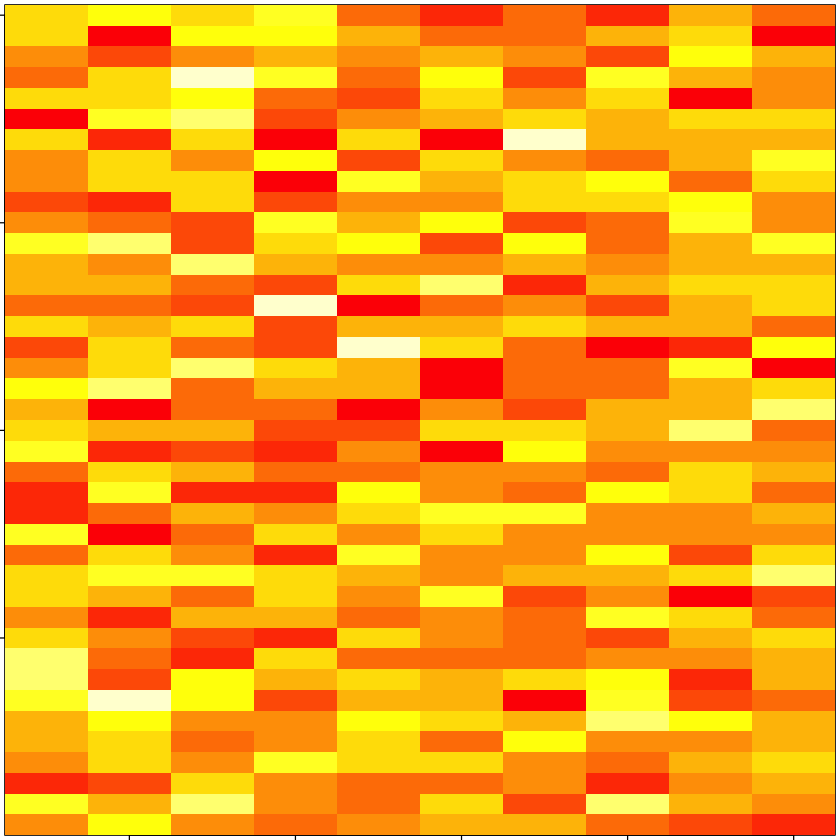

In [178]:
set.seed(12345)
par(mar=rep(0.2,4))
dataMatrix <- matrix(rnorm(400), nrow=40)
image(1:10, 1:40, t(dataMatrix)[, nrow(dataMatrix):1])

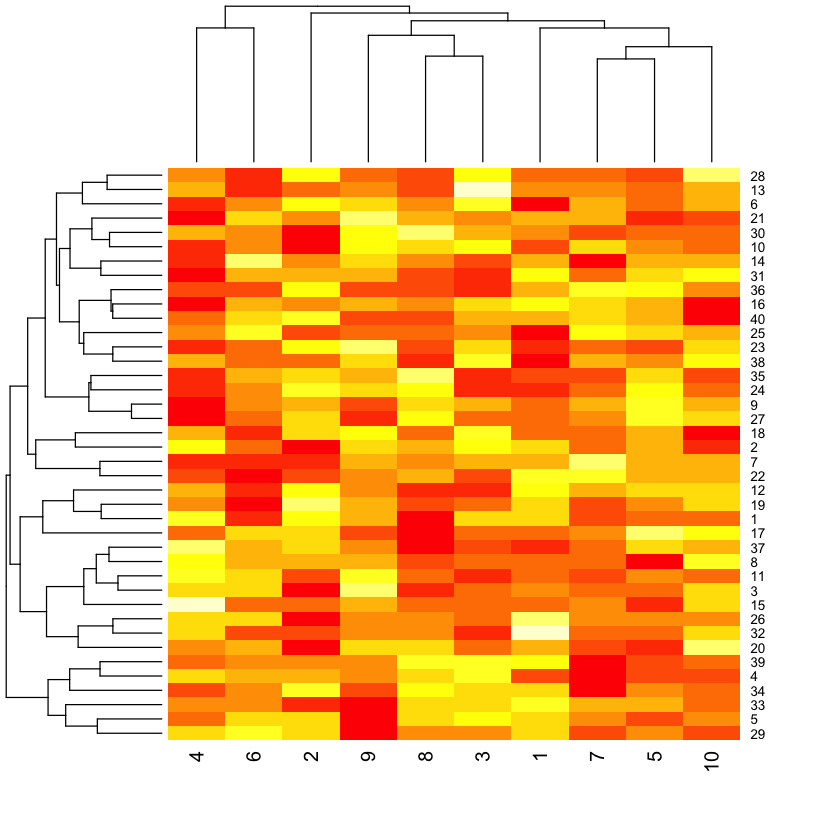

In [179]:
# clustering the data

par(mar=rep(0.2,4))
heatmap(dataMatrix)

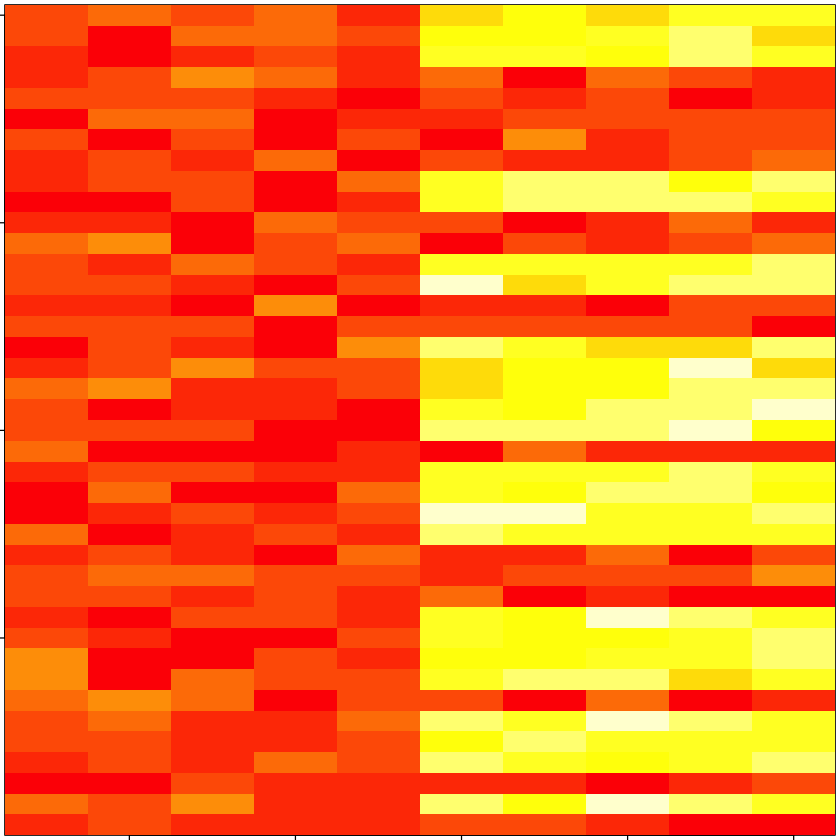

In [181]:
# So far not interesting, as the data is random, no pattern
# Let's add a pattern to the data

set.seed(678910)
for(i in 1:40){
    # flip a coin
    coinFlip <- rbinom(1, size=1, prob=0.5)
    # if coin is heads add a common pattern to that row
    if(coinFlip){
        dataMatrix[i, ] <- dataMatrix[i, ]+rep(c(0,3), each=5)
    }
}

par(mar=rep(0.2,4))
image(1:10, 1:40, t(dataMatrix)[, nrow(dataMatrix):1])

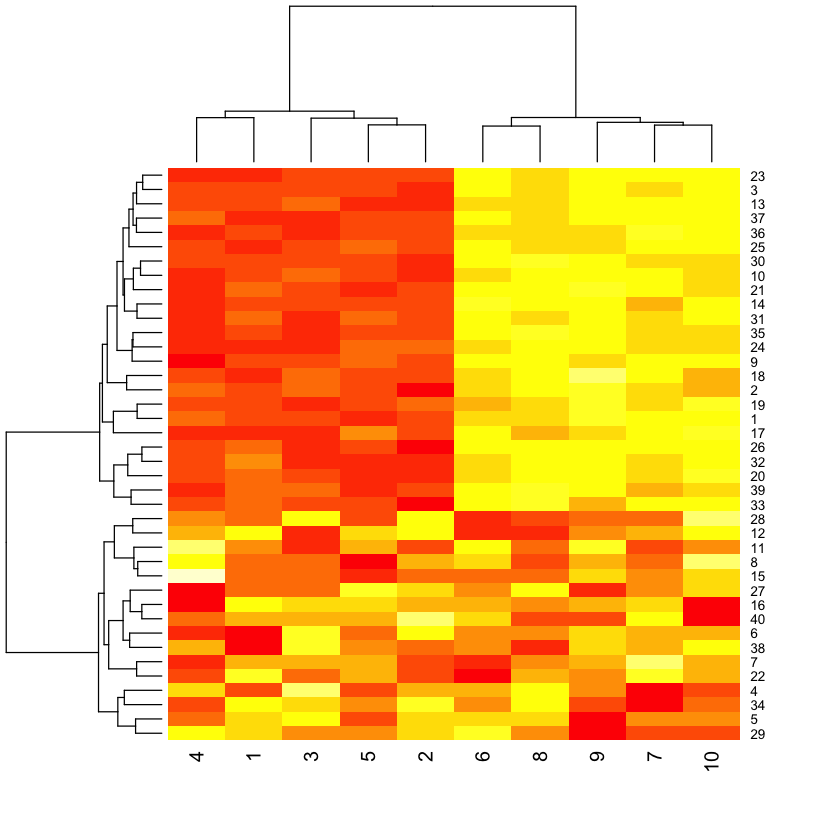

In [182]:
# now a pattern is more evident

par(mar=rep(0.2,4))
heatmap(dataMatrix)

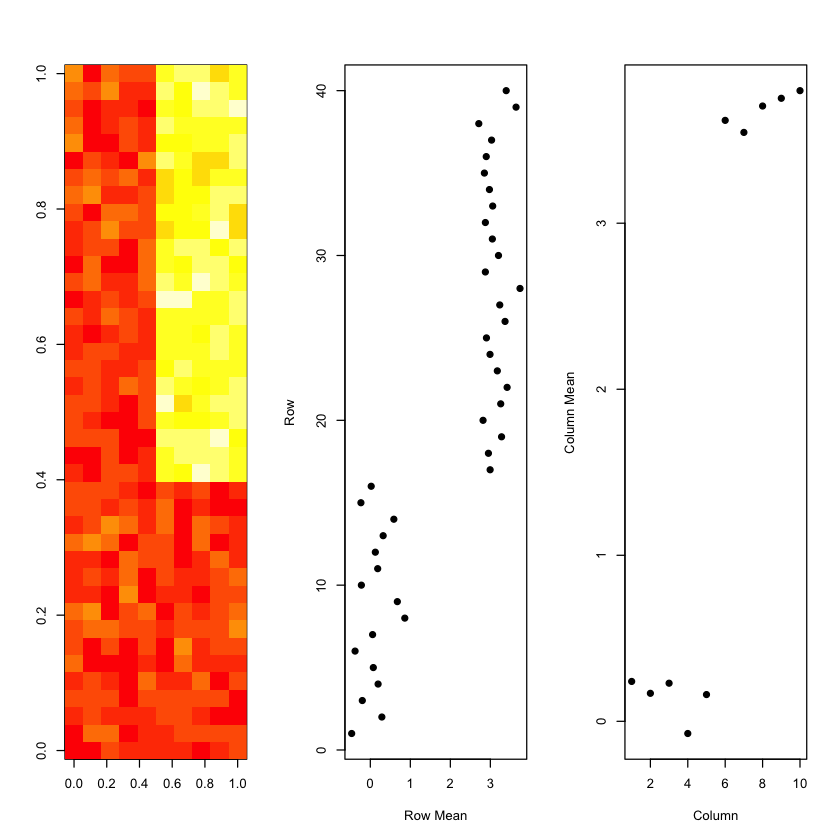

In [183]:
# looking at marginal means in rows or columns help us
# understand the data better

hh <- hclust(dist(dataMatrix))
dataMatrixOrdered <- dataMatrix[hh$order, ]
par(mfrow = c(1,3))
image(t(dataMatrixOrdered)[, nrow(dataMatrixOrdered):1])
plot(rowMeans(dataMatrixOrdered), 40:1, , xlab = "Row Mean",
    ylab = "Row", pch=19)
plot(colMeans(dataMatrixOrdered), xlab = "Column",
    ylab = "Column Mean", pch=19)

#### Related problems

You have multivariate variables X1, ..., Xn, so X1=(X11, ..., X1m)
- Find a new set of multivariate variables that are uncorrelated and explain as much variance as possible.
- If you put all the variables together in one matrix, find the best matrix created with fewer variables (lower rank) that explains the original data.

The first goal is **statistical** and the second goal is **data compression**

#### Related solutions - PCA/SVD

**SVD** - Singular value decomposition
<p>
If X is a matrix with each variable in a column and each observation in a row then the SVD is a "matrix decomposition" 
<p>
X = UDV^T  --> V transpose
<p>
where columns of U are orthogonal (left singular vectors), the columns of V are orthogonal (right singular vectors) and D is a diagonal matrix (singular vectors).

**PCA** - Principal components analysis
<p>
The principal components are equal to the right singular values if you first scale (substract the mean, divide by the standard deviation) in the variables. 



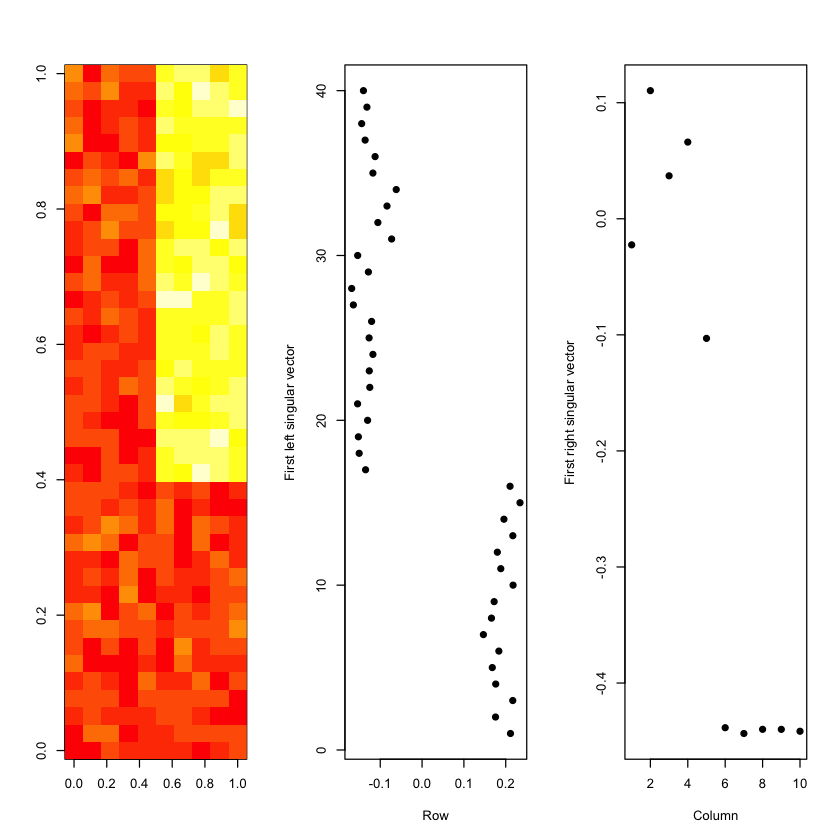

In [184]:
# Components of the SVD - u and v

# use SVD for the dataMatrixOrdered data
svd1 <- svd(scale(dataMatrixOrdered))

par(mfrow = c(1,3))
image(t(dataMatrixOrdered)[, nrow(dataMatrixOrdered):1])
plot(svd1$u[ ,1], 40:1, , xlab = "Row",
    ylab = "First left singular vector", pch=19)
plot(svd1$v[ ,1], xlab = "Column",
    ylab = "First right singular vector", pch=19)

# it immediatelly picked up on the patterns

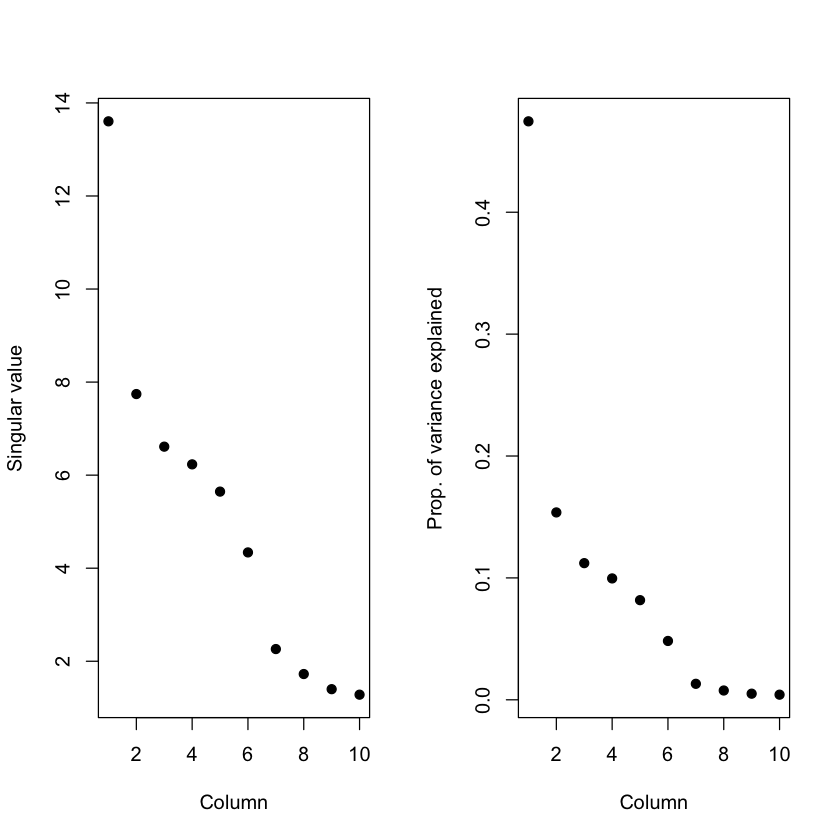

In [185]:
# Components of the SVD - Variance explained
# Comes from the singular values of the D matrix
# Total variation explained by that component

par(mfrow=c(1,2))
plot(svd1$d, xlab="Column", ylab="Singular value", pch=19)
plot(svd1$d^2/sum(svd1$d^2), xlab="Column", 
     ylab="Prop. of variance explained", pch=19)

# over 40% of the data variation is explained by a singular
# value, and the rest is from the rest of the components

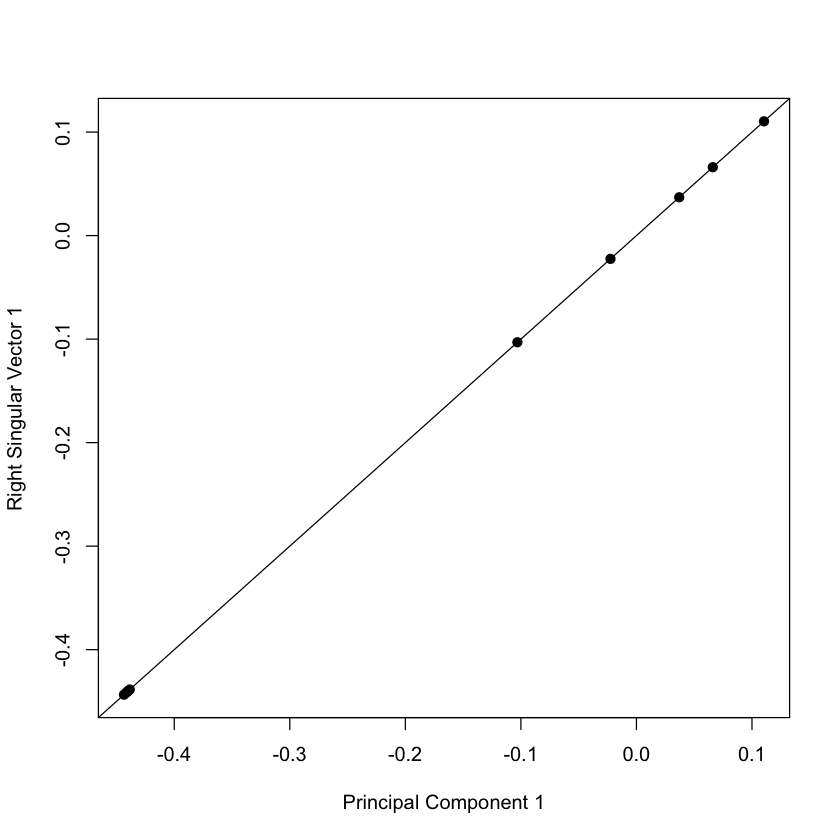

In [188]:
# Relationship to principal components

svd1 <- svd(scale(dataMatrixOrdered))
pca1 <- prcomp(dataMatrixOrdered, scale = TRUE)
plot(pca1$rotation[, 1], svd1$v[,1], pch=19,
     xlab="Principal Component 1", ylab= "Right Singular Vector 1")
abline(c(0,1))

# rest assured, svd and pca do the same!

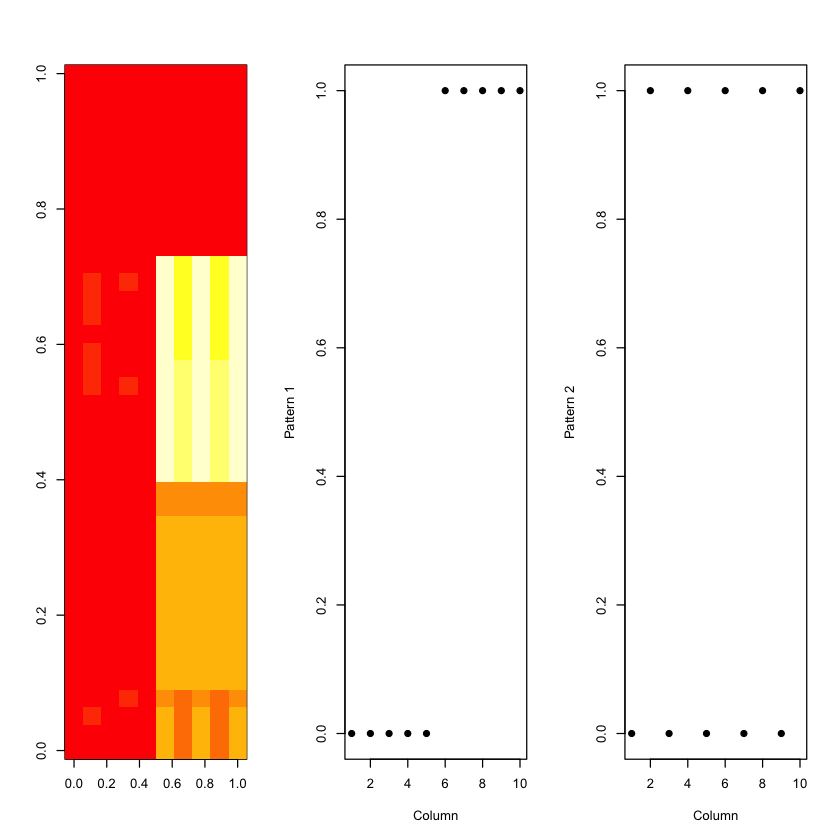

In [200]:
# What if we add a second pattern?

set.seed(678910)
for(i in 1:40){
    # flip a coin
    coinFlip1 <- rbinom(1, size=1, prob=0.5)
    coinFlip2 <- rbinom(1, size=1, prob=0.5)
    # if coin is heads add a common pattern to that row
    if(coinFlip1){
        dataMatrix[i, ] <- dataMatrix[i, ]+rep(c(0,5), each=5)
    }
    if(coinFlip2){
        dataMatrix[i, ] <- dataMatrix[i, ]+rep(c(0,5), 5)
    }
}

hh <- hclust(dist(dataMatrix))
dataMatrixOrdered <- dataMatrix[hh$order, ]

svd2 <- svd(scale(dataMatrixOrdered))
par(mfrow = c(1,3))
image(t(dataMatrixOrdered)[, nrow(dataMatrixOrdered):1])
plot(rep(c(0,1), each=5), xlab = "Column",
    ylab = "Pattern 1", pch=19)
plot(rep(c(0,1), 5), xlab = "Column",
    ylab = "Pattern 2", pch=19)

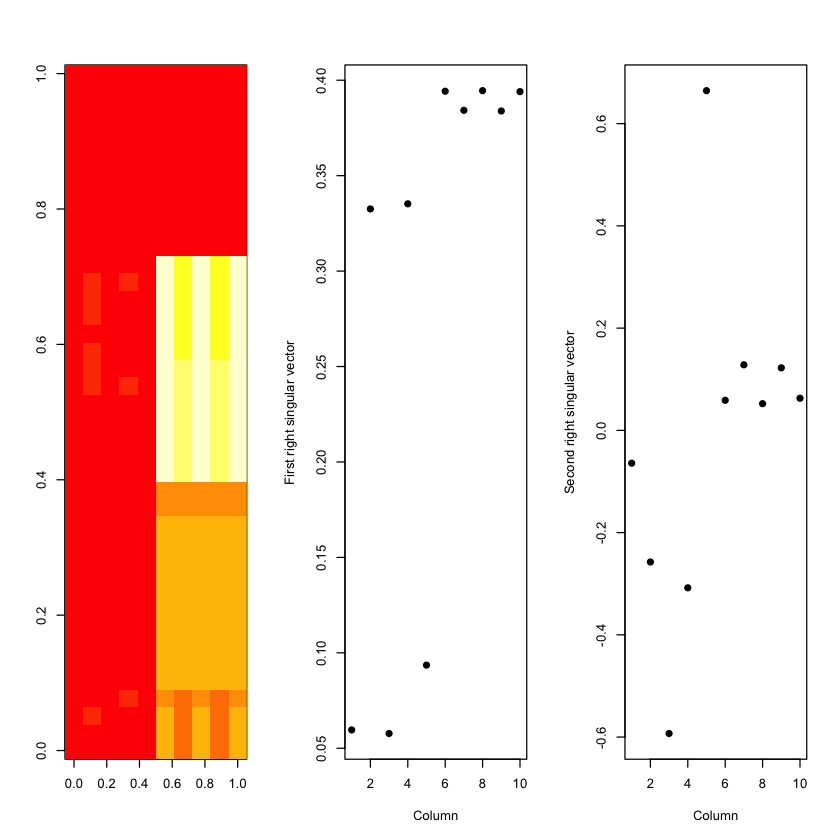

In [201]:
svd2 <- svd(scale(dataMatrixOrdered))
par(mfrow = c(1,3))
image(t(dataMatrixOrdered)[, nrow(dataMatrixOrdered):1])
plot(svd2$v[, 1], xlab = "Column",
    ylab = "First right singular vector", pch=19)
plot(svd2$v[, 2], xlab = "Column",
    ylab = "Second right singular vector", pch=19)

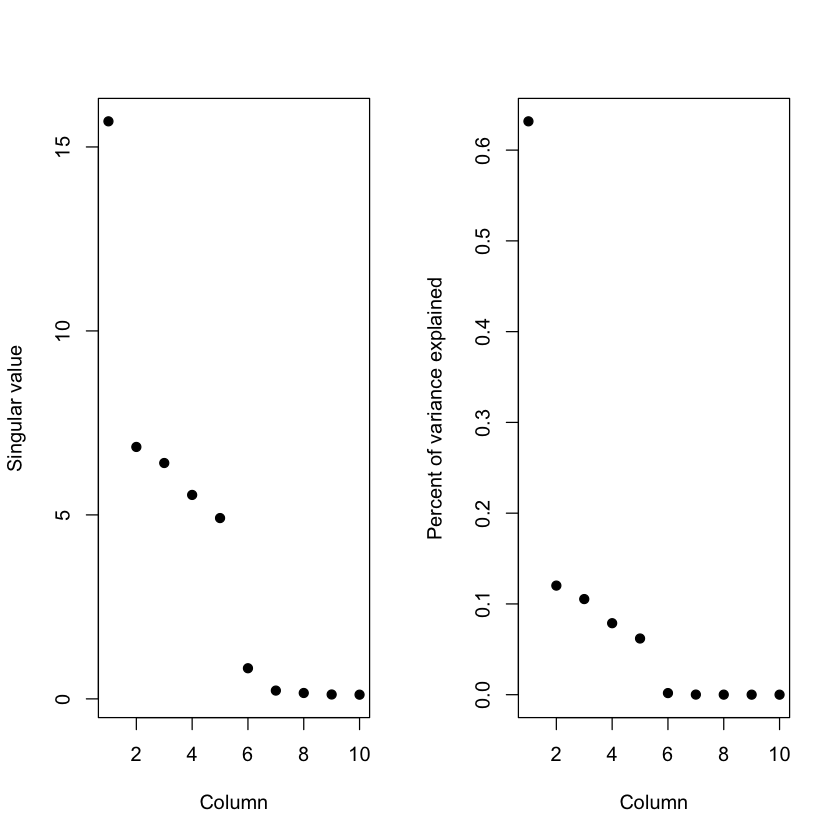

In [203]:
# d and variance explained

svd1 <- svd(scale(dataMatrixOrdered))
par(mfrow = c(1,2))
plot(svd1$d, xlab = "Column", ylab = "Singular value", pch=19)
plot(svd1$d^2/sum(svd1$d^2), xlab = "Column",
    ylab = "Percent of variance explained", pch=19)

#### Missing values

In [204]:
# Missing values is an issue with svd, as you cannot run it

dataMatrix2 <- dataMatrixOrdered

## Randomly insert some missing data
dataMatrix2[sample(1:100, size= 40, replace=FALSE)] <- NA
svd1 <- svd(scale(dataMatrix2)) # Gives an error!

ERROR: Error in svd(scale(dataMatrix2)): infinite or missing values in 'x'


#### Imputing {impute}

In [213]:
# Install impute package

source("http://bioconductor.org/biocLite.R")
biocLite("BiocUpgrade")
biocLite("impute")

Bioconductor version 3.5 (BiocInstaller 1.26.1), ?biocLite for help
A newer version of Bioconductor is available for this version of R,
  ?BiocUpgrade for help
BioC_mirror: https://bioconductor.org
Using Bioconductor 3.5 (BiocInstaller 1.26.1), R 3.4.2 (2017-09-28).
Installing package(s) ‘impute’
Warning message in install.packages(pkgs = doing, lib = lib, ...):
“installation of package ‘impute’ had non-zero exit status”Old packages: 'CORElearn', 'DRR', 'Hmisc', 'caret', 'chron', 'dotCall64',
  'foreach', 'htmlTable', 'iterators', 'lava', 'recipes', 'tidyselect',
  'timeDate', 'viridis', 'MASS', 'Matrix', 'Rcpp', 'backports', 'broom',
  'curl', 'data.table', 'digest', 'glue', 'hms', 'knitr', 'lazyeval',
  'lubridate', 'openssl', 'pbdZMQ', 'pryr', 'purrr', 'quantmod', 'reshape2',
  'rlang', 'rmarkdown', 'robustbase', 'rpart', 'rprojroot', 'stringi',
  'tibble', 'tidyr', 'tidyverse', 'withr', 'xts', 'yaml', 'zoo'


In [214]:
# must do something about missing values if using svd 

library(impute) ## Available from http://bioconductor.org
dataMatrix2 <- dataMatrixOrdered
dataMatrix2[sample(1:100, size=40,replace=FALSE)] <-NA
dataMatrix2 <- impute.knn(dataMatrix2)$data
svd1 <- svd(scale(dataMatrixOrdered)); svd2 <- svd(scale(dataMatrix2))
par(mfrow=c(1,2)); 
plot(svd1$v[,1], pch=19); plot(svd2$v[,1], pch=19)

ERROR: Error in library(impute): there is no package called ‘impute’


#### Face example

In [ ]:
load("data/face.rda")
image(t(faceData)[,nrow(faceData):1])
svd1 <- svd(scale(faceData))
plot(svd1$d^2/sum(svd1$d^2), xlab = "Column",
    ylab = "Variance explained", pch=19)

In [ ]:
# Create approximations

svd1 <- svd(scale(faceData))
# Note that %*% is matrix multiplication

# Here svd1$d[1] is a constant
approx1 <- svd1$u[,1] %*% t(svd1$v[,1]) * svd1$d 

# In these examples we need to make the diagonal matrix out of d
approx5 <- svd1$u[,1:5] %*% diag(svd1$d[1:5]) %*% t(svd1$v[,1:5])
approx10 <- svd1$u[,1:10] %*% diag(svd1$d[1:10]) %*% t(svd1$v[,1:10])

# Plot approximations

par(mfrow=c(1,4))
image(t(approx1)[, nrow(approx1):1], main = "(a)")
image(t(approx5)[, nrow(approx5):1], main = "(b)")
image(t(approx10)[, nrow(approx10):1], main = "(c)")
image(t(faceData)[, nrow(faceData):1], main = "(d)") # original

#### Notes 

- Scale matters
- PCs/SVs may mix real patterns
- Can be computationally intensive
- Advance data analysis from an elementary point of view
- Elements of statistical learning
- Alternatives
    - Factor analysis
    - Independent components analysis
    - Latent sematic analysis
    
#### Swift

In [224]:
mat <- matrix(c(1,2,3, 2,5,7), nrow = 2, ncol = 3, byrow = TRUE)
mat

1,2,3
2,5,7


In [232]:
svdmat <- svd(mat)
svdmat

# svd returns 3 components, d which holds 2 diagonal
# elements, u, a 2 by 2 matrix, and v, a 3 by 2 matrix.

# Note that this decomposition is NOT unique!

-0.3897782,-0.9209087
-0.9209087,0.3897782
-0.2327012,-0.7826345
-0.5614308,0.5928424
-0.7941320,-0.1897921


In [231]:
# Store diagonal entries in diag
matdiag <- diag(svdmat$d)
matdiag

9.589962,0.0000000
0.000000,0.1806108


In [234]:
matu <- svdmat$u
matv <- svdmat$v
matu
matv

-0.3897782,-0.9209087
-0.9209087,0.3897782


-0.2327012,-0.7826345
-0.5614308,0.5928424
-0.7941320,-0.1897921


In [236]:
# we get our original matrice doing UDV^t

matu %*% matdiag %*% t(matv)

1,2,3
2,5,7


In [239]:
## Now doing PCA, to explain variability in data

# First we need to scale mat 
scale(mat)

-0.7071068,-0.7071068,-0.7071068
0.7071068,0.7071068,0.7071068


In [240]:
svd(scale(mat))

-0.7071068,0.7071068
0.7071068,0.7071068
0.5773503,0.8101892
0.5773503,-0.4928162
0.5773503,-0.3173731


In [241]:
prcomp(scale(mat))

# Notice that the principal components of the scaled matrix, 
# from the prcomp outputs, ARE the columns of v, the right sing vals
# THUS PCA of a scaled matrix yields the V matrix of the same matrix


Standard deviations (1, .., p=2):
[1] 1.732051e+00 1.005654e-16

Rotation (n x k) = (3 x 2):
           PC1        PC2
[1,] 0.5773503  0.8101892
[2,] 0.5773503 -0.4928162
[3,] 0.5773503 -0.3173731

### Lesson 3. Working with Color

#### 3.3.1 Working with Color in R

Two palettes of colors:
- **heat.colors( )**
- **topo.colors( )**

In [243]:
heat.colors(3)

[1] "#FF0000FF" "#FF8000FF" "#FFFF00FF"

In [245]:
topo.colors(3)

[1] "#4C00FFFF" "#00FF4DFF" "#FFFF00FF"

#### Color utilities in R

- The **grDevices** package has two functions:
    - colorRamp
    - coloRampPalette
- These functions take palettes of colors and help to interpolate between the colors
- The function **colors( )** lists the names of colors you can use in any plotting function
<p>
- **colorRamp**: Take a palette of colors and return a function that takes values between 0 and 1, indicating the extremes of the color palette (e.g. see the gray function)
- **colorRampPalette**: take a palette of colors and return a function that takes integer arguments and returns a vector of colors interpolating the palette (like heat.colors or topo.colors)


In [253]:
# colorRamp

pal <- colorRamp(c("red","blue"))
pal(0)

255,0,0


In [247]:
pal(1)

0,0,255


In [248]:
pal(0.5)

127.5,0,127.5


In [249]:
pal(seq(0,1,len=10))

255.00000,0,0.00000
226.66667,0,28.33333
198.33333,0,56.66667
170.00000,0,85.00000
141.66667,0,113.33333
113.33333,0,141.66667
85.00000,0,170.00000
56.66667,0,198.33333
28.33333,0,226.66667
0.00000,0,255.00000


In [251]:
# colorRampPalette

pal <- colorRampPalette(c("red","yellow"))
pal(2)

[1] "#FF0000" "#FFFF00"

In [252]:
pal(10)

[1] "#FF0000" "#FF1C00" "#FF3800" "#FF5500" "#FF7100" "#FF8D00" "#FFAA00"
 [8] "#FFC600" "#FFE200" "#FFFF00"

#### RColorBrewer Package
- One package on CRAN that contains interesting/useful color palettes
- There are 3 types of palettes
    - Sequential -> (from light to dark) for ordered data
    - Diverging  -> (light in the middle) for neg/pos data
    - Qualitative -> (no specific order) for qualitative data
- Palette information can be used in conjunction with the colorRamp( ) and colorRampPalette( )

In [254]:
library(RColorBrewer)

In [259]:
# numbers of colors, names of palette

cols <- brewer.pal(3, "PRGn") # PurpleGreen palette
cols

?brewer.pal

[1] "#AF8DC3" "#F7F7F7" "#7FBF7B"

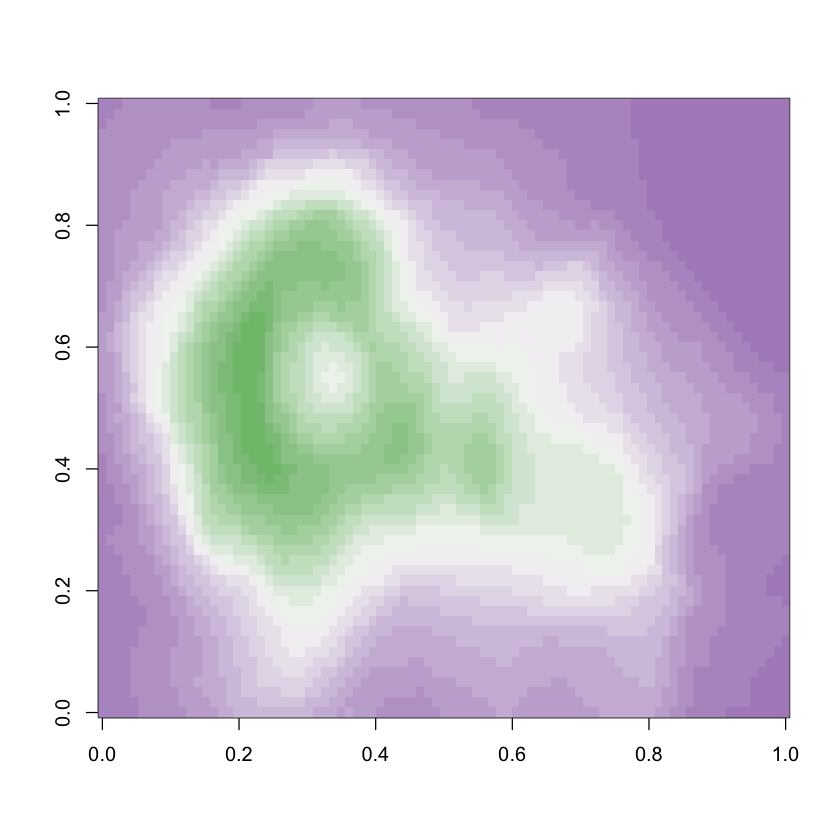

In [260]:
pal <- colorRampPalette(cols)
image(volcano, col = pal(20))

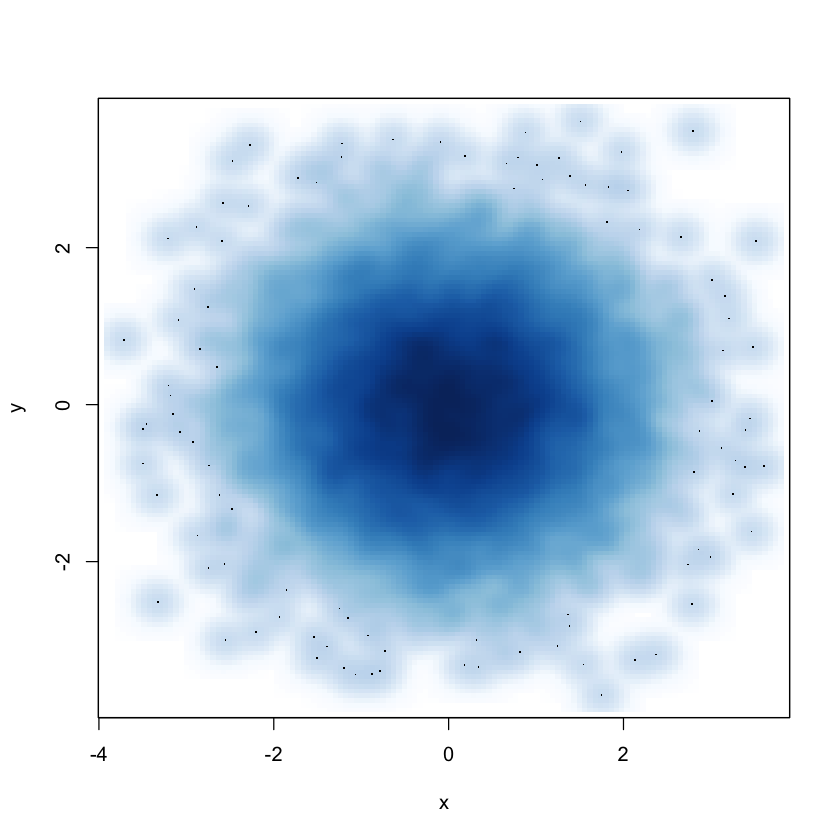

In [261]:
# The smoothScatter function creates a 2D histagram

x <- rnorm(10000)
y <- rnorm(10000)
smoothScatter(x,y)

# high vs lower density regions of the plot

- The **rgb** function can be used to produced any color via red, green, blue proportions
- Color transparency can be added via the *alpha* parameter to rgb
- The **colorspace** package can be used for a different control over colors

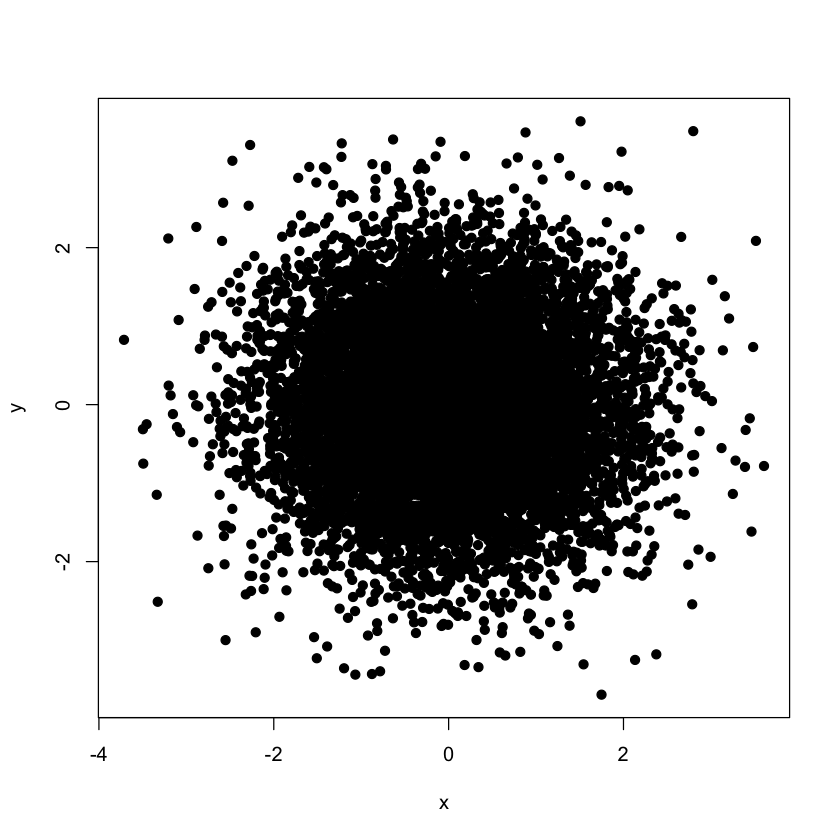

In [262]:
# Scatterplot with no transparency

plot(x,y,pch=19)

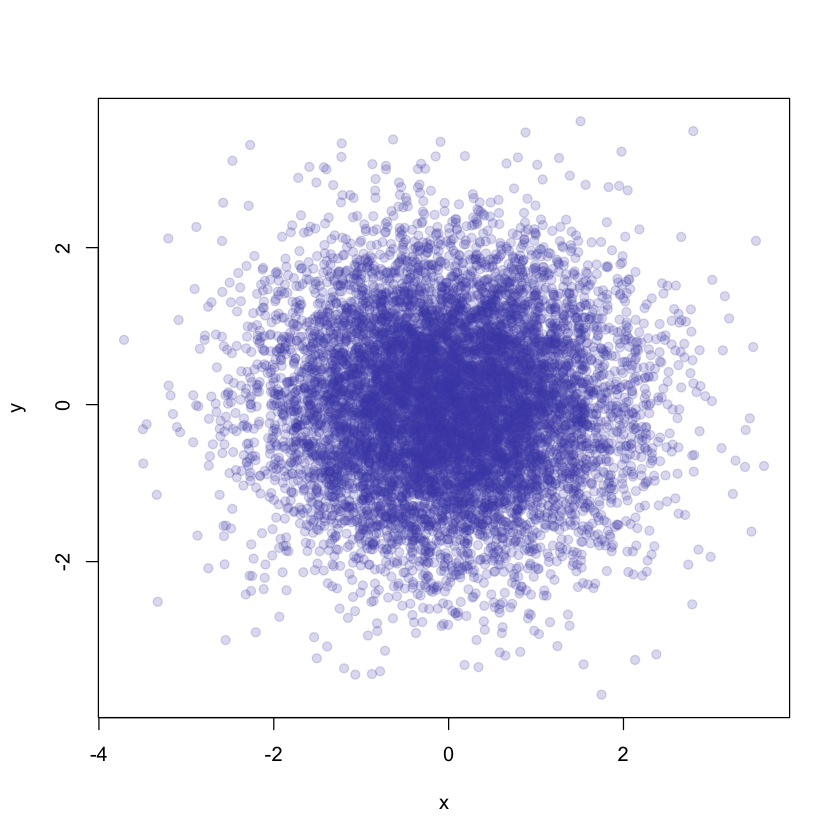

In [276]:
plot(x,y,col=rgb(0.3,0.3,0.7,0.2),pch=19)

## Week 4

### Lesson 1: Case Studies

### 4.1.1 EDA Case Study - Understanding Human Activity with Smartphones

This is basically the **swirl( )** learning part of 14. Clustering Example.

### 4.1.2 Air Pollution Case Study


### NOTES

Slides for this course: https://github.com/DataScienceSpecialization/courses